In [ ]:
## Importing the necessary libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
## Importing the dataset
df=pd.read_csv('LoanExport.csv')
df.head()

<ipython-input-3-518087db567d>:2: DtypeWarning: Columns (18) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv('LoanExport.csv')


,CreditScore,FirstPaymentDate,FirstTimeHomebuyer,MaturityDate,MSA,MIP,Units,Occupancy,OCLTV,DTI,...,PostalCode,LoanSeqNum,LoanPurpose,OrigLoanTerm,NumBorrowers,SellerName,ServicerName,EverDelinquent,MonthsDelinquent,MonthsInRepayment
0,0,199902,N,202901,16974,25,1,O,89,27,...,60400,F199Q1268030,P,360,2,FL,WASHINGTONMUTUALBANK,0,0,52
1,0,199902,N,202901,19740,0,1,O,73,17,...,80200,F199Q1015092,N,360,1,FT,CHASEHOMEFINANCELLC,0,0,144
2,0,199902,N,202901,29940,0,1,O,75,16,...,66000,F199Q1266886,N,360,2,FL,WASHINGTONMUTUALBANK,0,0,67
3,0,199902,N,202901,31084,0,1,O,76,14,...,90700,F199Q1178167,N,360,2,GM,GMACMTGECORP,0,0,35
4,0,199902,N,202901,35644,0,1,O,78,18,...,7600,F199Q1178517,N,360,2,GM,GMACMTGECORP,0,0,54


In [ ]:
df.shape

(291451, 28)

In [ ]:
## Basic information displayed
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 291451 entries, 0 to 291450
Data columns (total 28 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   CreditScore         291451 non-null  int64  
 1   FirstPaymentDate    291451 non-null  int64  
 2   FirstTimeHomebuyer  291451 non-null  object 
 3   MaturityDate        291451 non-null  int64  
 4   MSA                 291451 non-null  object 
 5   MIP                 291451 non-null  int64  
 6   Units               291451 non-null  int64  
 7   Occupancy           291451 non-null  object 
 8   OCLTV               291451 non-null  int64  
 9   DTI                 291451 non-null  int64  
 10  OrigUPB             291451 non-null  int64  
 11  LTV                 291451 non-null  int64  
 12  OrigInterestRate    291451 non-null  float64
 13  Channel             291451 non-null  object 
 14  PPM                 291451 non-null  object 
 15  ProductType         291451 non-nul

In [ ]:

# Observations:
# There are 291451 records and 28 columns in the dataset 13 columns are numerical, 14 columns are categorical and 1 column is of float

In [ ]:
### Summary statistics of the dataset
df.describe()

,CreditScore,FirstPaymentDate,MaturityDate,MIP,Units,OCLTV,DTI,OrigUPB,LTV,OrigInterestRate,OrigLoanTerm,EverDelinquent,MonthsDelinquent,MonthsInRepayment
count,291451.000000,291451.000000,291451.000000,291451.000000,291451.000000,291451.000000,291451.000000,291451.000000,291451.000000,291451.000000,291451.000000,291451.000000,291451.000000,291451.000000
mean,708.936991,199904.760553,202902.367043,9.216685,1.026022,76.960529,30.033453,124940.387921,76.937986,6.926547,359.835375,0.197848,1.837729,60.805291
std,68.408791,13.821228,16.090508,12.648273,0.202986,15.236154,13.203974,53657.440624,15.225298,0.343541,2.286939,0.398378,8.809392,46.142599
min,0.000000,199901.000000,202402.000000,0.000000,0.000000,0.000000,0.000000,8000.000000,0.000000,4.000000,301.000000,0.000000,0.000000,1.000000
25%,675.000000,199903.000000,202902.000000,0.000000,1.000000,70.000000,22.000000,83000.000000,70.000000,6.750000,360.000000,0.000000,0.000000,34.000000
50%,717.000000,199904.000000,202903.000000,0.000000,1.000000,80.000000,31.000000,117000.000000,80.000000,6.875000,360.000000,0.000000,0.000000,48.000000
75%,753.000000,199905.000000,202904.000000,25.000000,1.000000,90.000000,39.000000,160000.000000,90.000000,7.125000,360.000000,0.000000,0.000000,63.000000
max,849.000000,201303.000000,204302.000000,55.000000,4.000000,110.000000,65.000000,497000.000000,103.000000,12.350000,361.000000,1.000000,180.000000,212.000000


In [ ]:
# Observations:
# Average credit score is 709 points
# Average MIP is 9
# Average OCLTV is 77
# Average DTI is 30
# Average OrigUPB is 124940
# Average LTV is 77
# Average Interest rate is 7%

In [ ]:
## Checking the null values
df.isnull().sum()

CreditScore               0
FirstPaymentDate          0
FirstTimeHomebuyer        0
MaturityDate              0
MSA                       0
MIP                       0
Units                     0
Occupancy                 0
OCLTV                     0
DTI                       0
OrigUPB                   0
LTV                       0
OrigInterestRate          0
Channel                   0
PPM                       0
ProductType               0
PropertyState             0
PropertyType              0
PostalCode                0
LoanSeqNum                0
LoanPurpose               0
OrigLoanTerm              0
NumBorrowers              0
SellerName            24994
ServicerName              0
EverDelinquent            0
MonthsDelinquent          0
MonthsInRepayment         0
dtype: int64

In [ ]:
# Handling Missing Values
for var in ['MSA','PropertyType','NumBorrowers']: ## Loop containing variables used for handling nan values
    df[var]=df[var].str.strip() ## Removing the white space using str.strip()
    df[var]=df[var].replace('X','Other') ## Replacing nan values with a category "Other"
for var in ['FirstTimeHomebuyer','SellerName']:
    mode=df[var].mode()
    df[var]=df[var].fillna(mode)[0]
df['PPM']=df['PPM'].replace('X','Other') ## Replacing nan values with "Other"

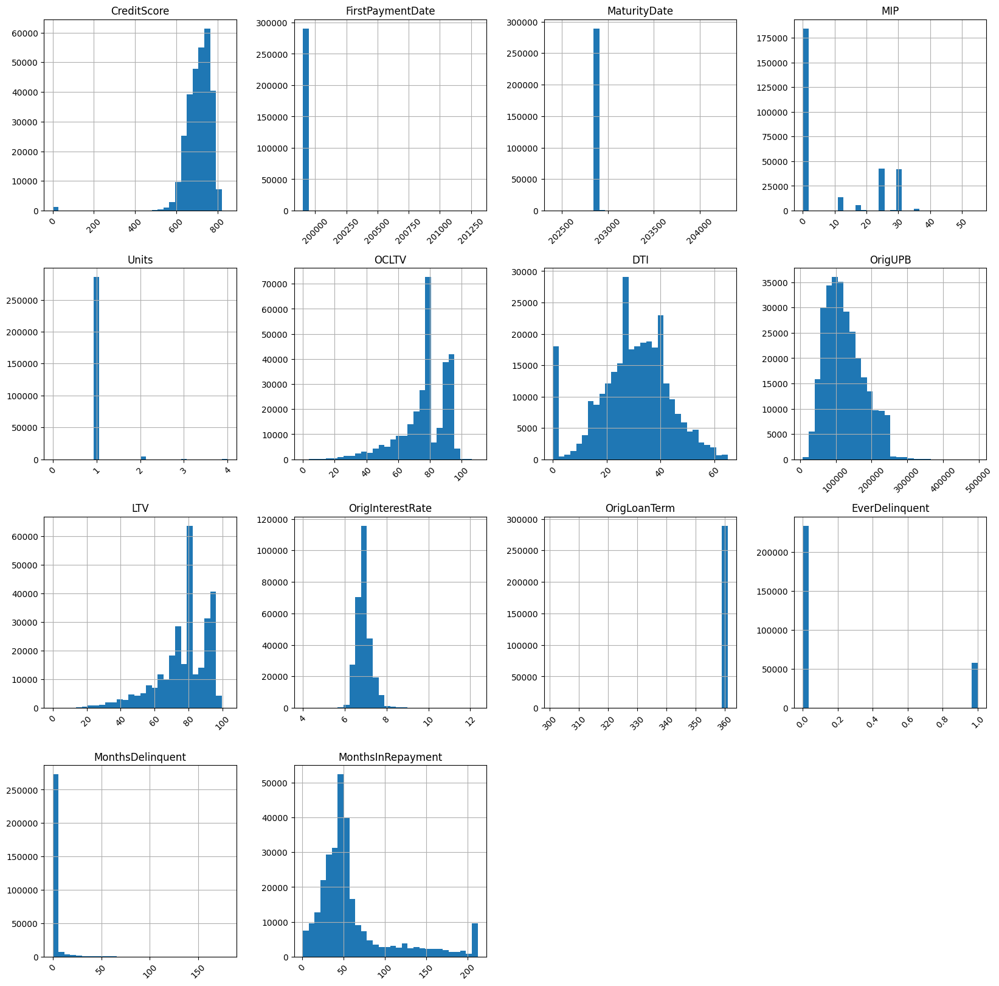

In [ ]:
# Exploratory Data Analysis
# Univariate Analysis


df.hist(bins=30,figsize=(20,20),xrot=45)
plt.show() ## Histogram for the numerical variables

In [ ]:
# Observations:
# Credit score follows a left skewed distribution. Most values are concentrated within 500-800 points
# Interest Rates are lying between 6-8%
# OrigUPB values are lying between 100000-300000
# LTV and OCLTV follows a left skewed distribution. Highest value of both is between 80 to 100

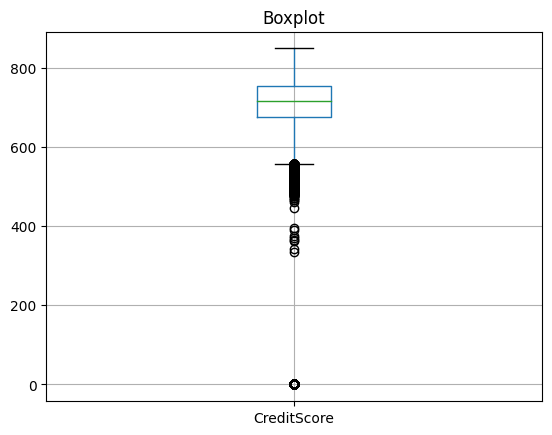

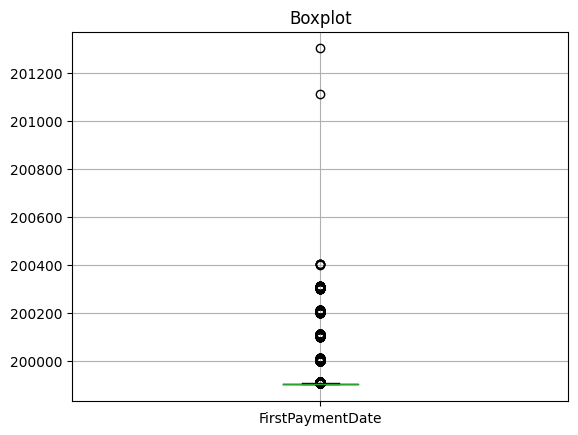

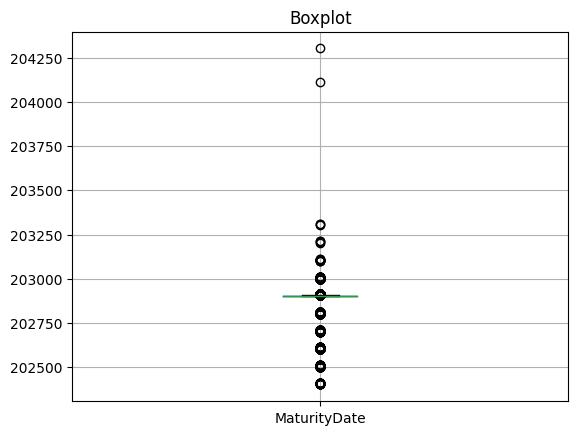

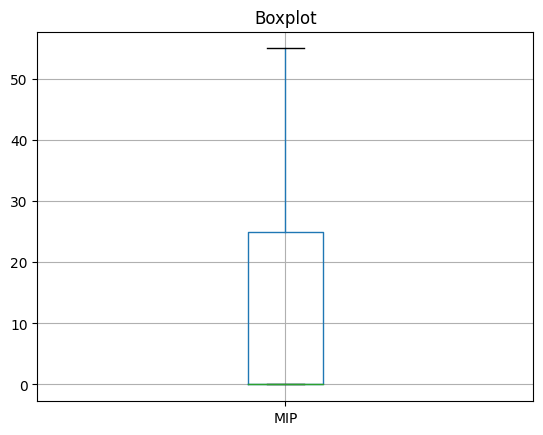

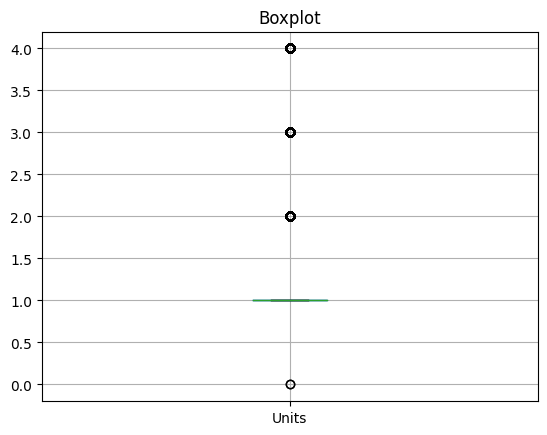

...

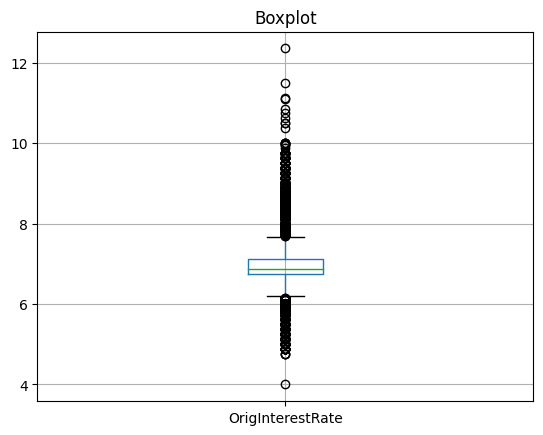

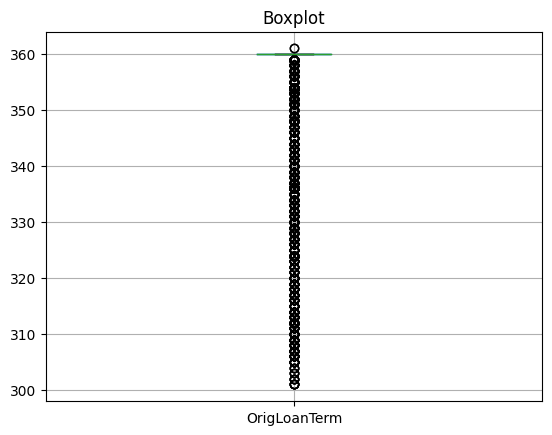

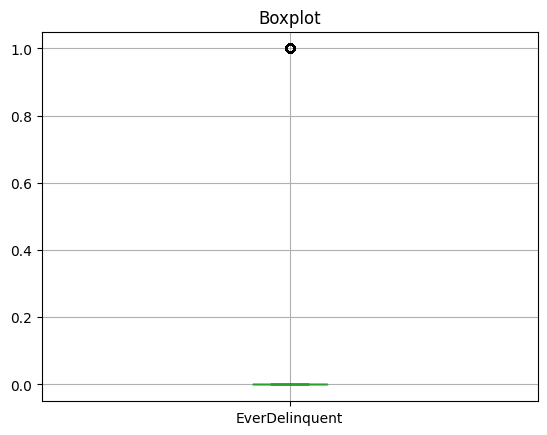

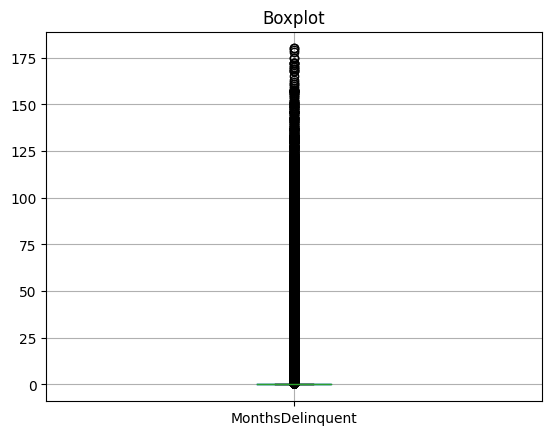

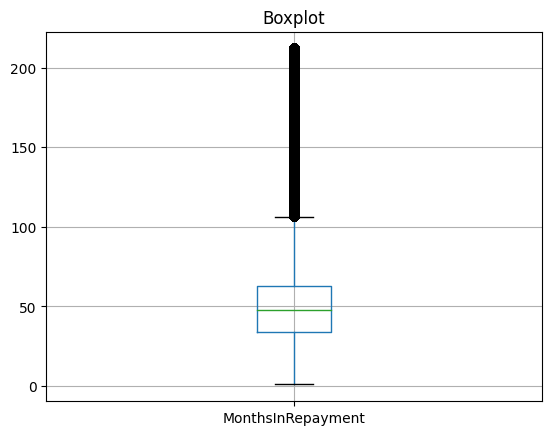

In [ ]:
for var in df.select_dtypes(exclude='O'): ## Loop which contains only numerical variables
    df.boxplot(var)
    plt.title('Boxplot')
    plt.show() ## Creating a boxplot for all the numerical variables

<Axes: xlabel='EverDelinquent', ylabel='Density'>

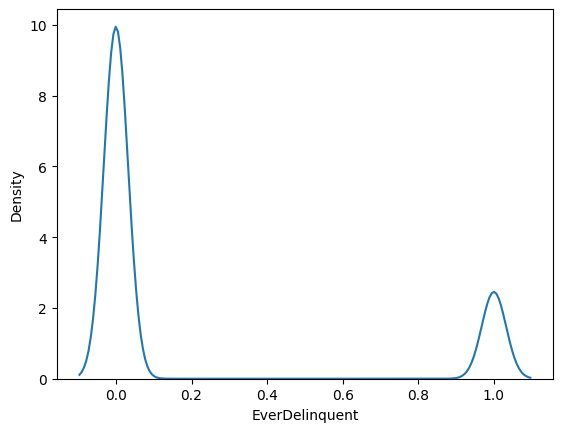

In [ ]:
sns.kdeplot(data=df,x='EverDelinquent',gridsize=200) ## Plotiing the kde plot for everdelinquent

In [ ]:
def distplot(df,variable): ## Creating a function which will plot the kde plot of the variables
    plt.figure(figsize=(8,8))
    sns.kdeplot(df[variable])
    plt.title('Density Plot')
    plt.show()

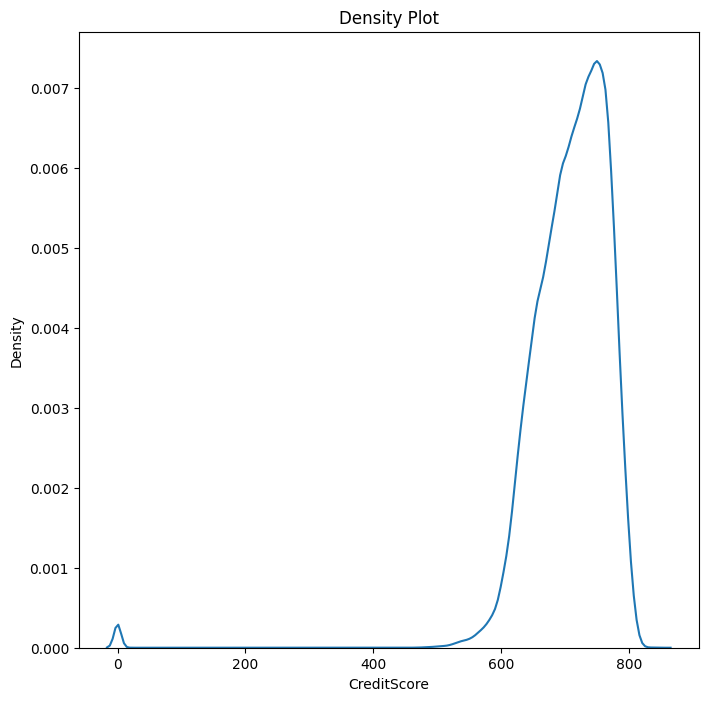

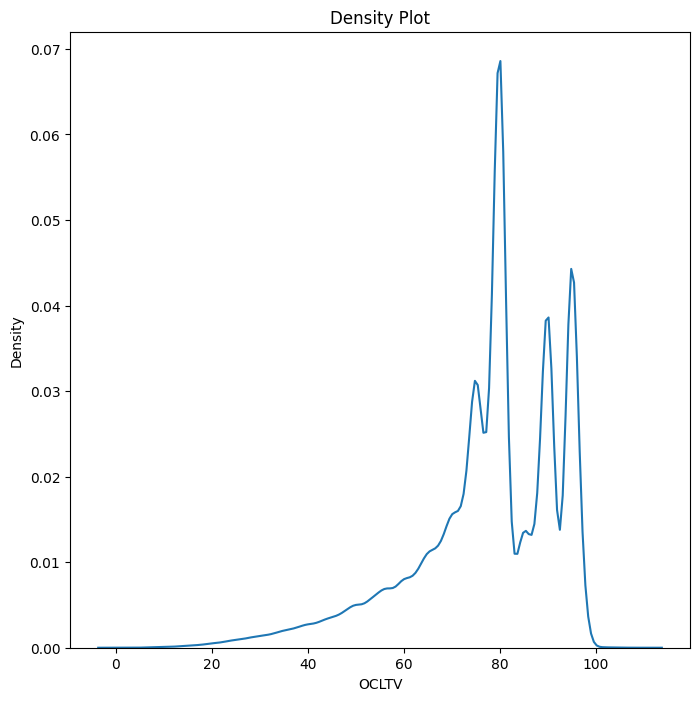

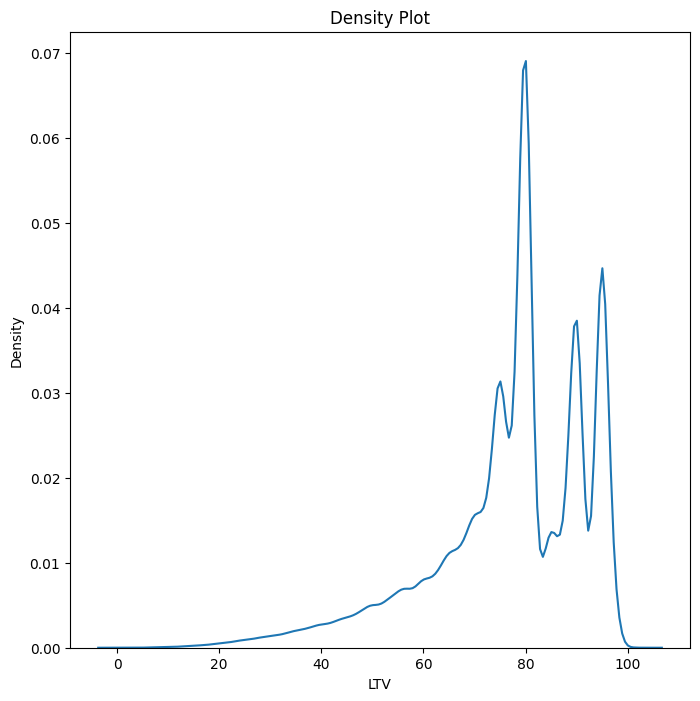

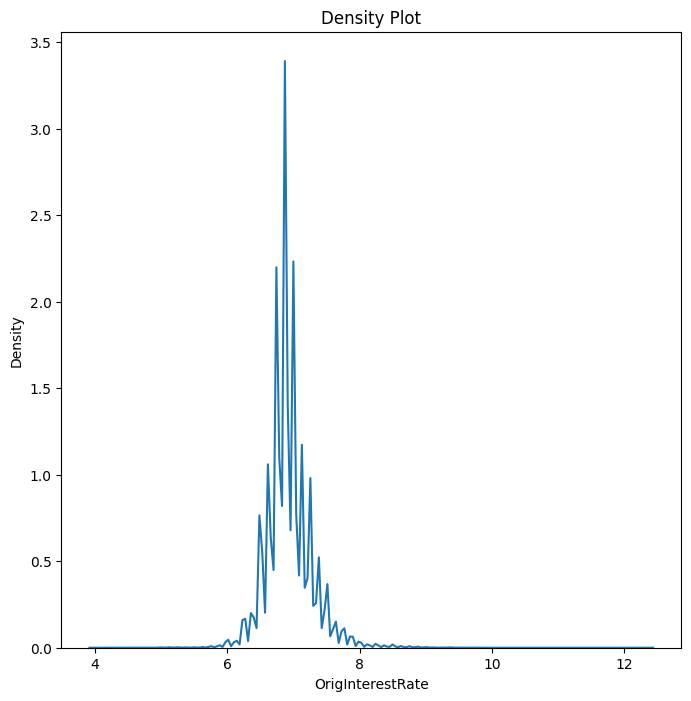

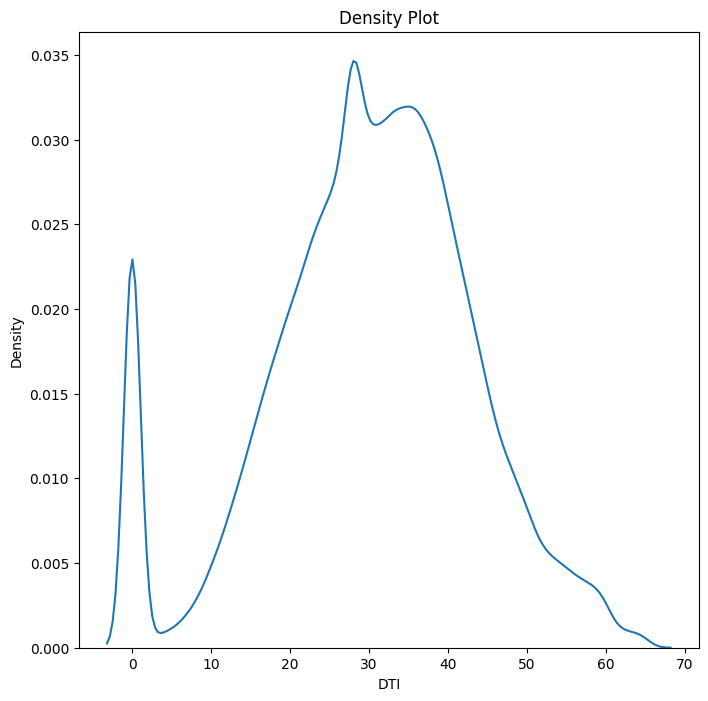

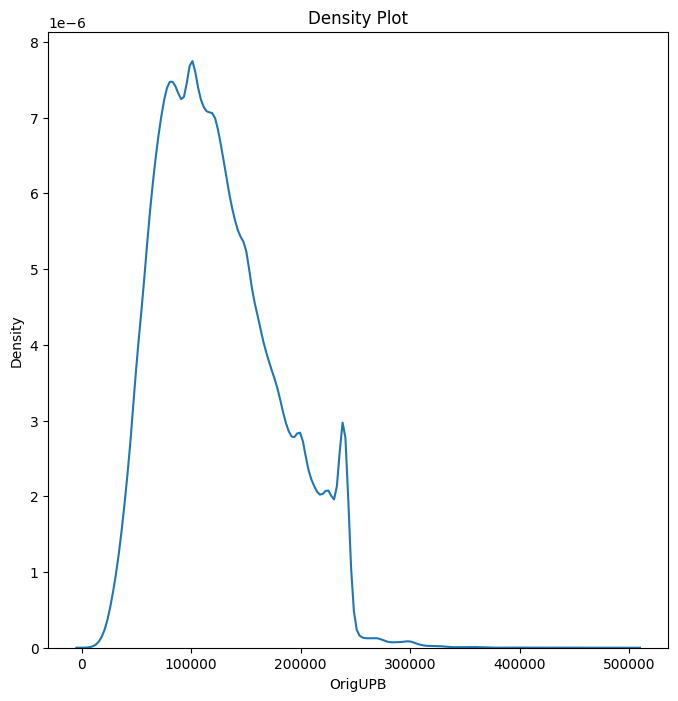

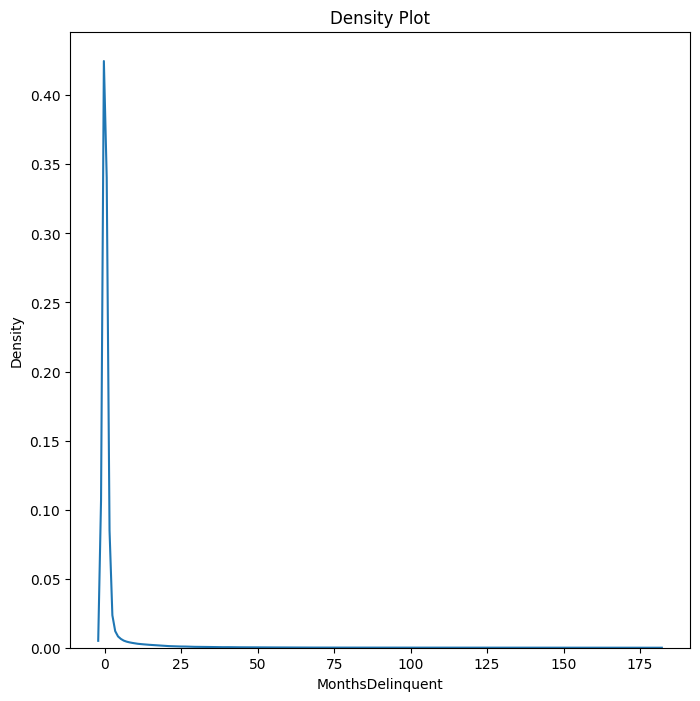

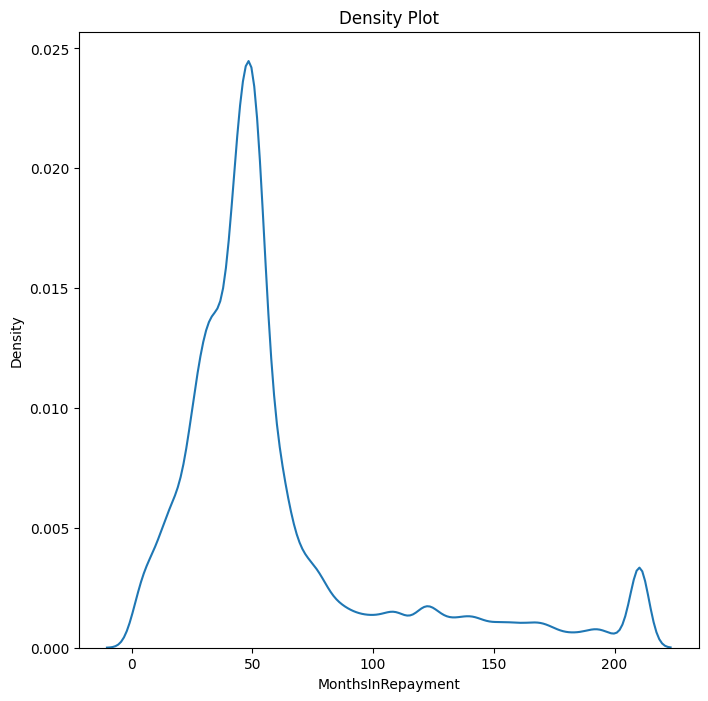

In [ ]:
var=['CreditScore','OCLTV','LTV','OrigInterestRate','DTI','OrigUPB',
    'MonthsDelinquent','MonthsInRepayment']
for variable in var:
    distplot(df,variable) ## Loop which creates the density plot for all the variables mentioned in the list

Text(0, 0.5, '% of borrowers')

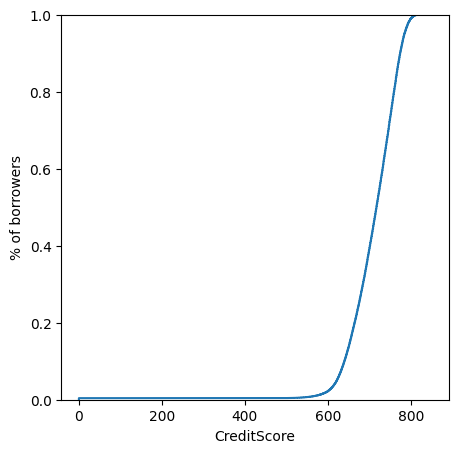

In [ ]:
plt.figure(figsize=(5,5))
sns.ecdfplot(data=df,x='CreditScore') ## plotting the ecdf plot of credit score
plt.ylabel('% of borrowers')

In [ ]:
# Observations:
# We can interpret the graph as follows: Let's say we want to find out what percentage of borrowers have a credit score less than 800 points, then we can see that almost all the borrowers(99%) have the credit score less than 800 points

Text(0, 0.5, '% of borrowers')

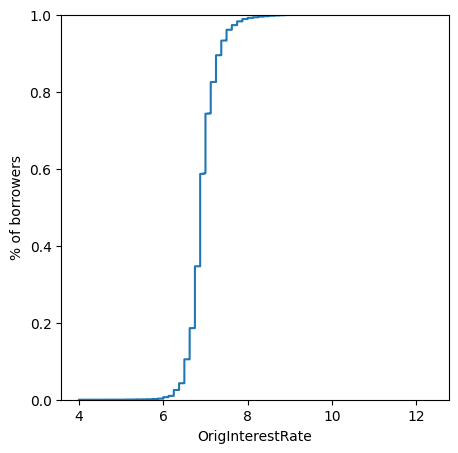

In [ ]:
plt.figure(figsize=(5,5))
sns.ecdfplot(data=df,x='OrigInterestRate')
plt.ylabel('% of borrowers') ## plotting the cumulative distribution plot for interest rate

In [ ]:
# Observations:
# 57% of the borrowers are paying an interest of less than 7%

# 98% of the borrowers are paying an interest of less than 8%

Text(0, 0.5, '% of borrowers')

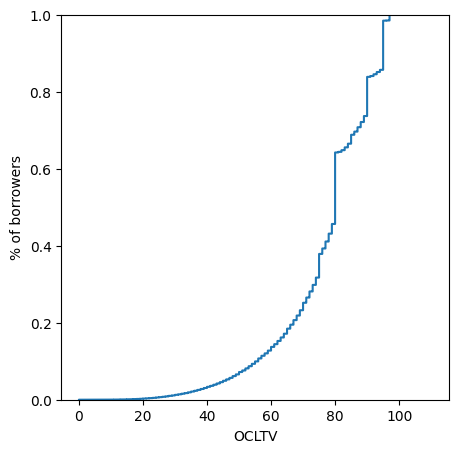

In [ ]:
plt.figure(figsize=(5,5))
sns.ecdfplot(data=df,x='OCLTV')
plt.ylabel('% of borrowers')

In [ ]:
# Observations:
# Approximately 3% of the borrowers have ocltv ratio less than 40

# Around 10% of the borrowers have an ocltv ratio less than 60

# Approximately 40% of the borrowers have an ocltv ratio less than 80

Text(0, 0.5, '% of borrowers')

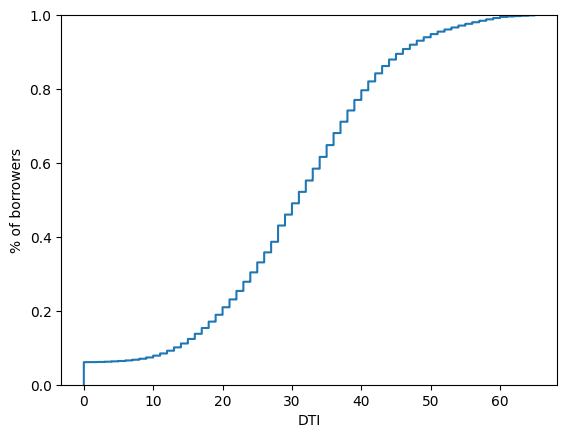

In [ ]:
sns.ecdfplot(data=df,x='DTI')
plt.ylabel('% of borrowers')

In [ ]:
# Observations:
# Approx 40% of the borrowers have DTI ratio less than 30

# Approx 70% of the borrowers have DTI ratio less than 40

# Approx 90% of the borrowers have DTI ratio less than 50

<ipython-input-24-ac5f50a9d9ad>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='LoanPurpose',data=df,palette='husl')


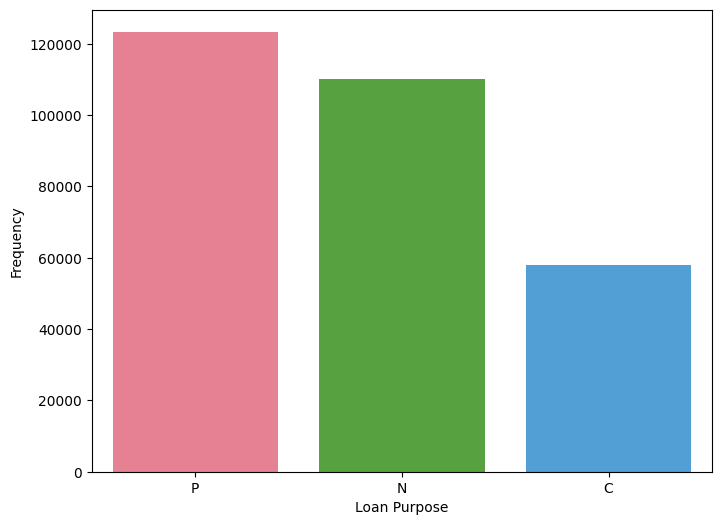

In [ ]:
plt.figure(figsize=(8,6))
sns.countplot(x='LoanPurpose',data=df,palette='husl')
plt.xlabel('Loan Purpose')
plt.ylabel('Frequency')
plt.show() ## Plotting the countplot for loan purpose

In [ ]:
# Observations:
# The borrowers are mostly taking loans for purpose P followed by N and then C

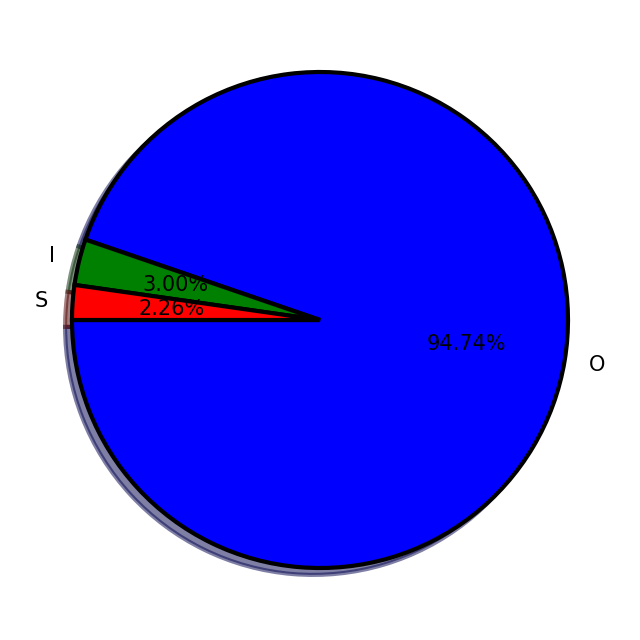

In [ ]:
plt.figure(figsize=(8,9))
plt.pie(df['Occupancy'].value_counts(),labels=['O','I','S'],autopct='%1.2f%%',
       colors=['b','g','r'],startangle=180,shadow=True,textprops={'fontsize':15},
       wedgeprops={'linewidth':3,'width':1,'edgecolor':'k'},explode=[0,0,0])
plt.show()

In [ ]:
# Observations:
# 94.74% of the observations are owner occupied
# 3% of the observations are for investment incentive
# 2.26% of the observations are for second home

<ipython-input-28-424ab1296d63>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='PPM',data=df,palette='Set2')


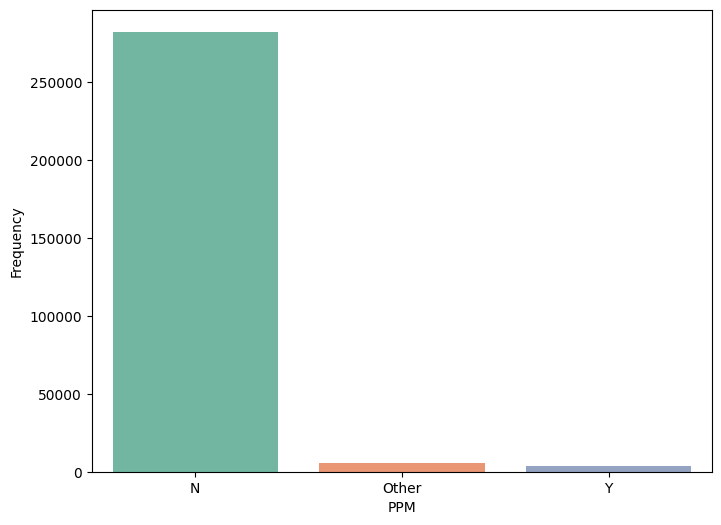

In [ ]:
plt.figure(figsize=(8,6))
sns.countplot(x='PPM',data=df,palette='Set2')
plt.xlabel('PPM')
plt.ylabel('Frequency')
plt.show()

In [ ]:
# Observations:
# In most of the transactions there is no PPM. That means the borrowers are not paying penalty on their loans

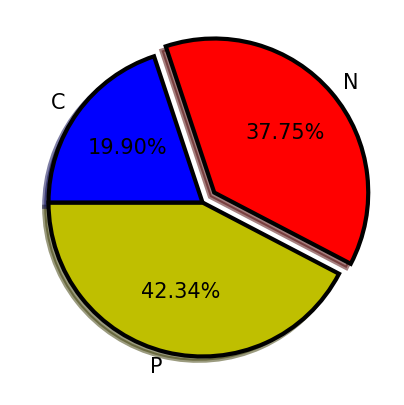

In [ ]:
plt.figure(figsize=(5,5))
plt.pie(df['LoanPurpose'].value_counts(),labels=df['LoanPurpose'].unique(),autopct='%1.2f%%',
       colors=['y','r','b'],startangle=180,shadow=True,textprops={'fontsize':15},
       wedgeprops={'linewidth':3,'width':1,'edgecolor':'k'},explode=[0,0.1,0])
plt.show()

In [ ]:
# Observations:
# 42.34% of the loans are for purpose P
# 37.75% of the loans are for purpose N
# 19.9% of the loans are for purpose C

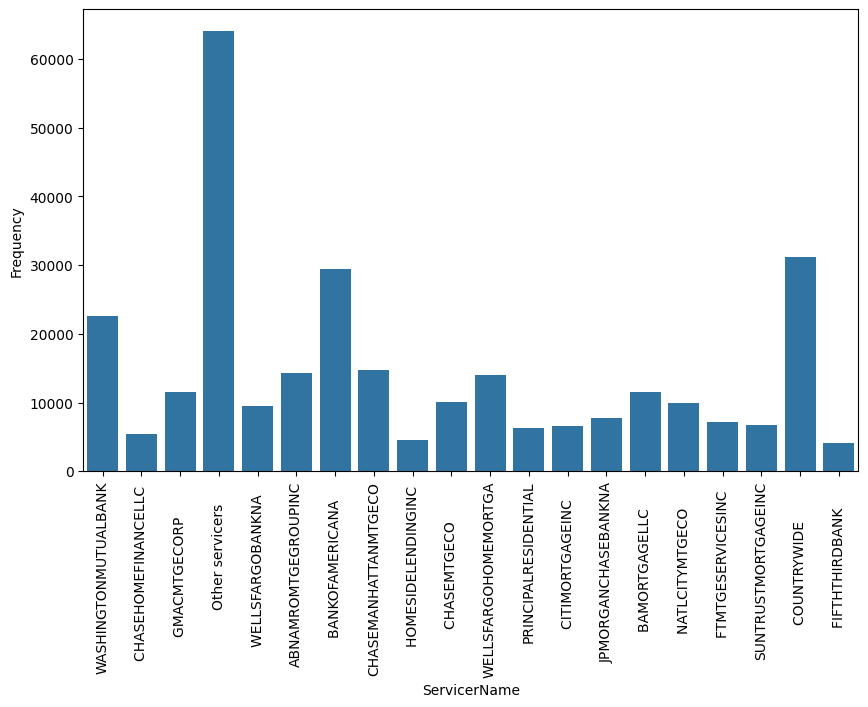

In [ ]:
plt.figure(figsize=(10,6))
sns.countplot(x='ServicerName',data=df)
plt.xlabel('ServicerName')
plt.xticks(rotation=90)
plt.ylabel('Frequency')
plt.show()

In [ ]:
# Observations:
# Other servicers are giving maximum loans The Servicers who are reluctant to give loans means that there are more cases of prepayment in that banks or financial institutions.

<ipython-input-34-31bbd1edd2af>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='NumBorrowers',data=df,palette='viridis')


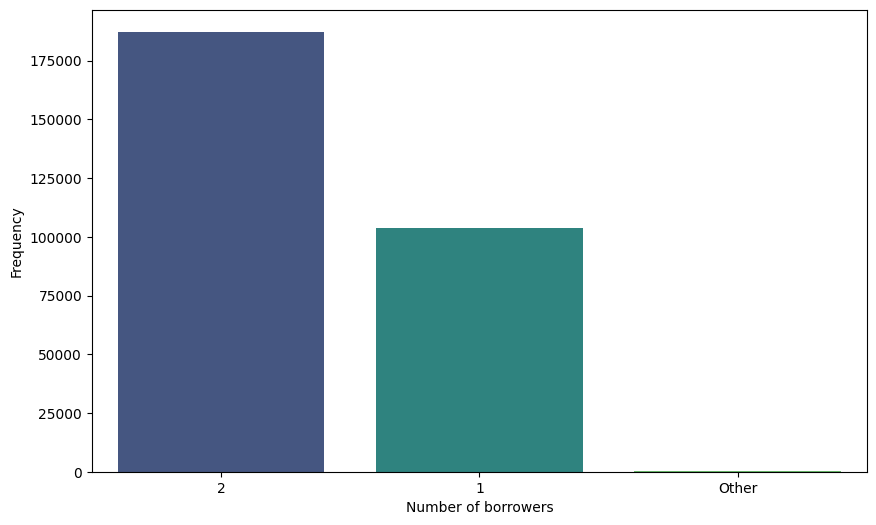

In [ ]:
plt.figure(figsize=(10,6))
sns.countplot(x='NumBorrowers',data=df,palette='viridis')
plt.xlabel('Number of borrowers')
plt.ylabel('Frequency')
plt.show()

In [ ]:
# Observations:
# We can see that the number of borrowers who are taking maximum loans are 2. That means delinquency rate may vary as in most cases there are mix of borrowers who are taking loans

<Axes: xlabel='PropertyType'>

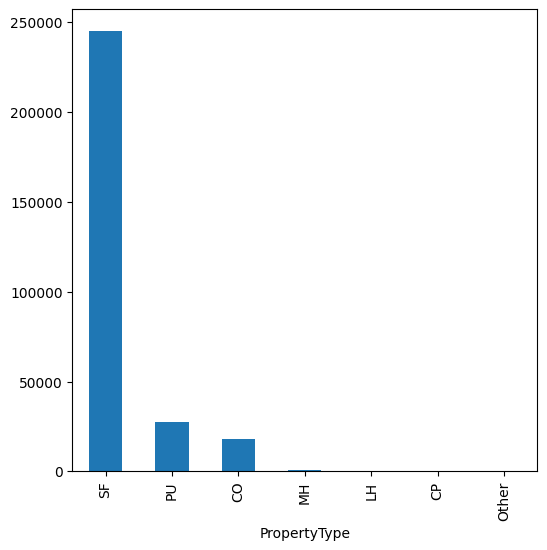

In [ ]:
plt.figure(figsize=(6,6))
df['PropertyType'].value_counts().plot.bar()

In [ ]:
# Observations:
# Highest number of observations are from property type SF. This means that the loan is taken mostly for the property type SF

In [ ]:
## Creating a function which plots histogram and q-q plot for the variables to check normality
import scipy.stats as stats
def distribution_plot(df,variable):
    plt.figure(figsize=(6,6)) ## figure size is 6,6

    plt.subplot(1,2,1) ## 1st row, 2 columns, 1st chart
    df[variable].hist(bins=30)
    plt.title('Histogram of {}'.format(variable))

    plt.subplot(1,2,2) ## 1st row,2 columns, 2nd chart
    stats.probplot(df[variable],dist='norm',plot=plt) ## probability plot or q-q plot with distribution as normal
    plt.title('Q-Q Plot of {}'.format(variable))

    plt.show() ## plotting histogram and q-q plot of the variables before handling outliers

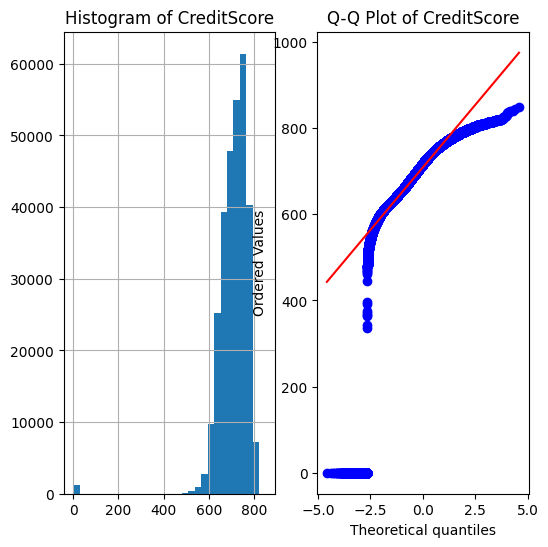

In [ ]:
distribution_plot(df,'CreditScore')

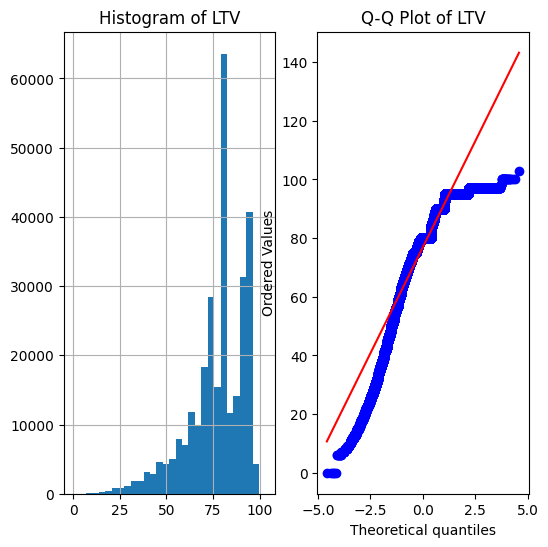

In [ ]:
distribution_plot(df,'LTV')

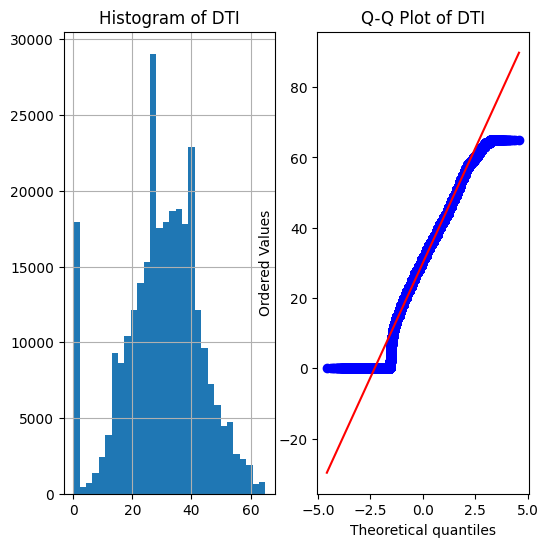

In [ ]:
distribution_plot(df,'DTI')

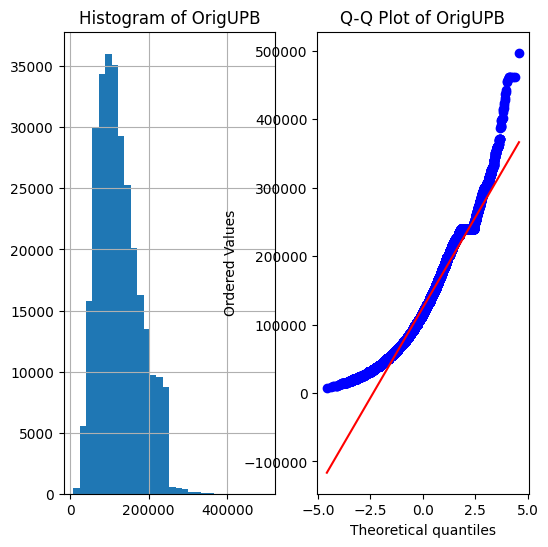

In [ ]:
distribution_plot(df,'OrigUPB')

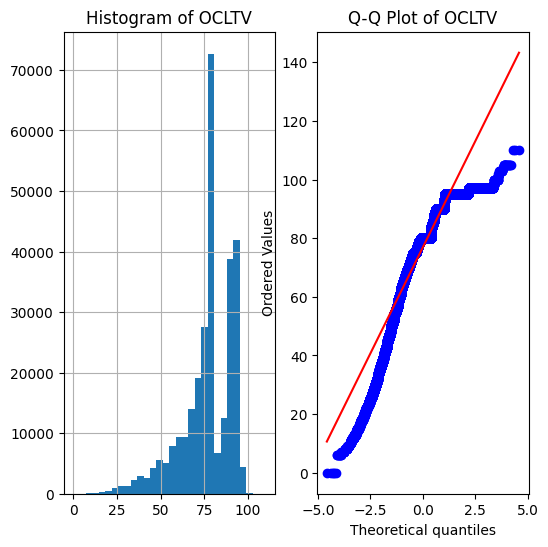

In [ ]:
distribution_plot(df,'OCLTV')

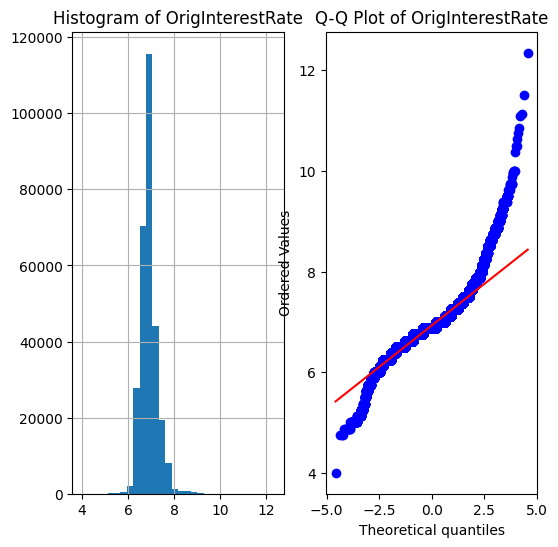

In [ ]:
distribution_plot(df,'OrigInterestRate')

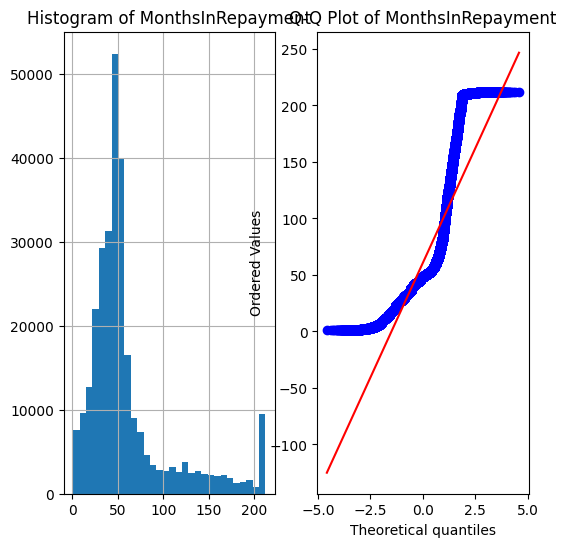

In [ ]:
distribution_plot(df,'MonthsInRepayment')

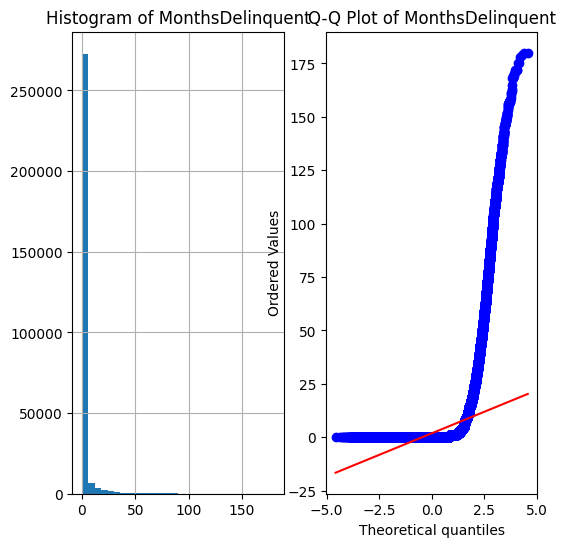

In [ ]:
distribution_plot(df,'MonthsDelinquent')

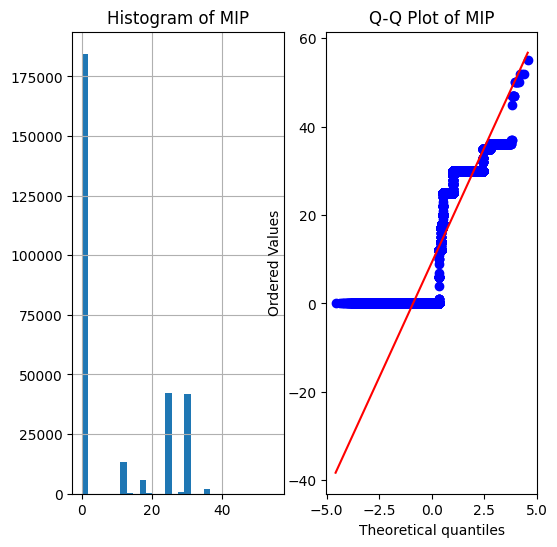

In [ ]:
distribution_plot(df,'MIP')

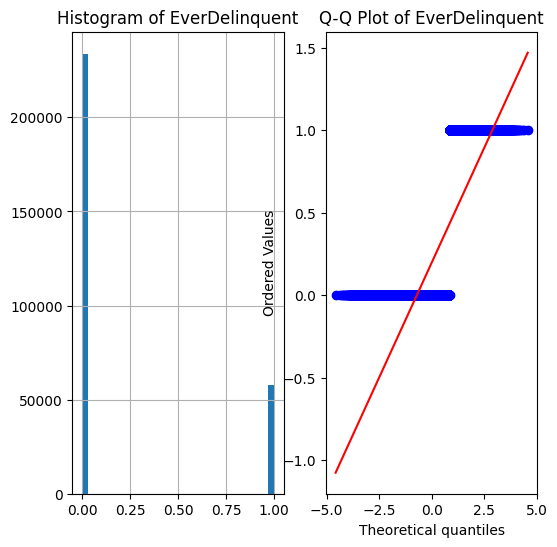

In [ ]:
distribution_plot(df,'EverDelinquent')

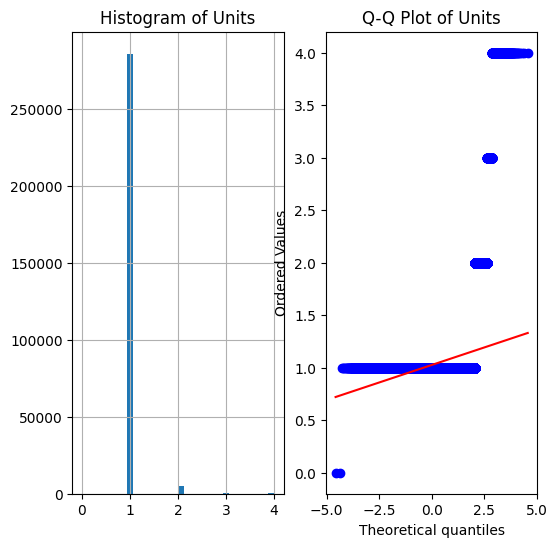

In [ ]:
distribution_plot(df,'Units')

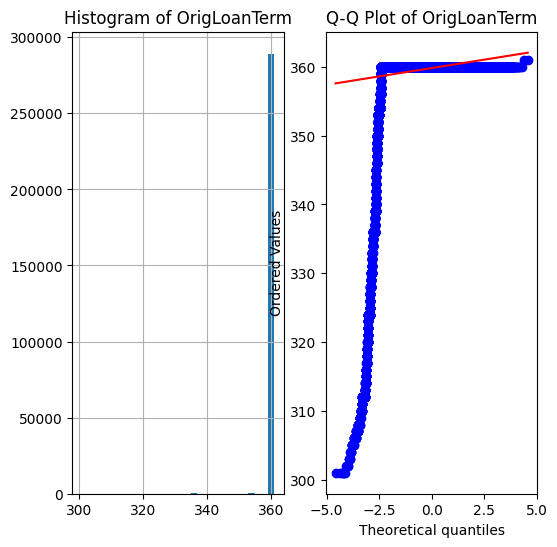

In [ ]:

distribution_plot(df,'OrigLoanTerm')

In [ ]:
# Observations:
# We can see that there are some variables which follows a skewed distribution and some follow gaussian distribution. We can transform the variables which are skewed to the normal distribution by applying appropriate transformation

In [ ]:
# Bivariate Analysis/Multivariate Analysis
# Numerical vs Numerical
# Numerical vs Categorical
# Categorical vs Categorical

In [ ]:
df.columns

Index(['CreditScore', 'FirstPaymentDate', 'FirstTimeHomebuyer', 'MaturityDate',
       'MSA', 'MIP', 'Units', 'Occupancy', 'OCLTV', 'DTI', 'OrigUPB', 'LTV',
       'OrigInterestRate', 'Channel', 'PPM', 'ProductType', 'PropertyState',
       'PropertyType', 'PostalCode', 'LoanSeqNum', 'LoanPurpose',
       'OrigLoanTerm', 'NumBorrowers', 'SellerName', 'ServicerName',
       'EverDelinquent', 'MonthsDelinquent', 'MonthsInRepayment'],
      dtype='object')

<Axes: xlabel='DTI', ylabel='CreditScore'>

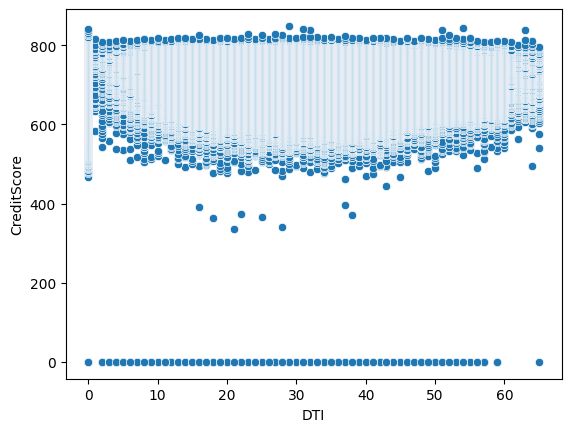

In [ ]:
sns.scatterplot(x=df['DTI'],y=df['CreditScore'])

In [ ]:
# Observations:
# There is a negative relationship between DTI and Credit Score. As DTI increases, Creditscore tends to fall which means that the delinquency rate rises

<Axes: xlabel='LTV', ylabel='DTI'>

/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


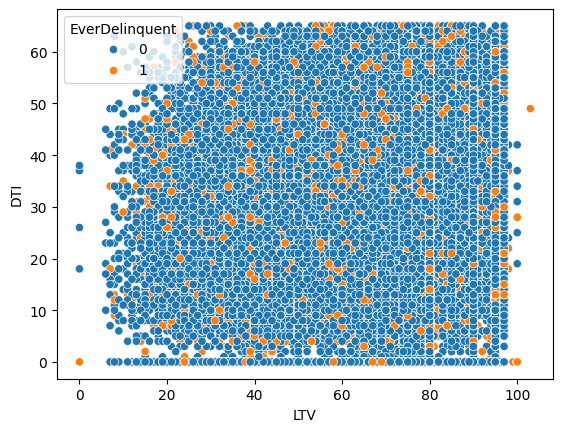

In [ ]:
sns.scatterplot(x=df['LTV'],y=df['DTI'],hue=df['EverDelinquent'])

In [ ]:
# Observations:
# There is a positive relation between LTV and DTI. AS LTV rises, DTI also rises and with an increase in DTI most of the buyers are non-delinquent i.e. they are not behind their payments. Here with an increase in DTI the buyers are still making their payments on time

<Axes: xlabel='OrigInterestRate', ylabel='CreditScore'>

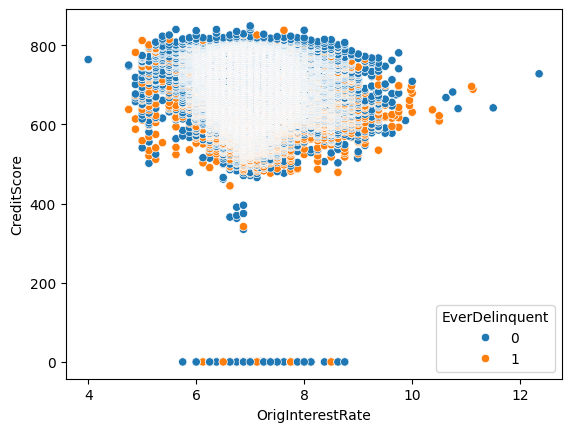

In [ ]:
sns.scatterplot(x=df['OrigInterestRate'],y=df['CreditScore'],hue=df['EverDelinquent'])

In [ ]:
# Observations:
# There is an inverse relation between interest rate and credit score. Again the borrowers are non-delinquent with a fall in credit score due to rise in interest rates. Delinquency rates are lower

<Axes: xlabel='OCLTV', ylabel='OrigInterestRate'>

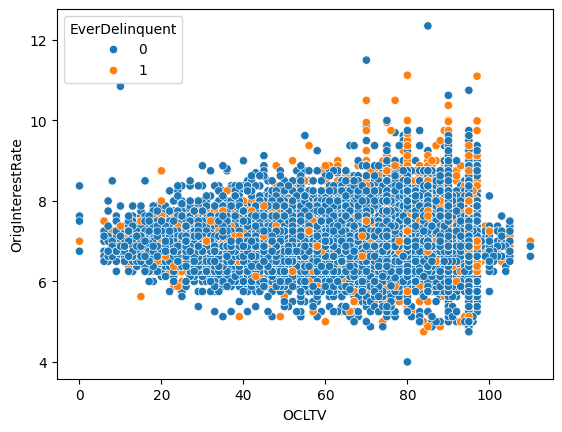

In [ ]:
sns.scatterplot(x=df['OCLTV'],y=df['OrigInterestRate'],hue=df['EverDelinquent'])

In [ ]:
# Observations:
# There is a positive relation between OCLTV and OrigInterestRate. As ocltv rises the interest rates are rising but most of the borrowers are non-delinquent so the delinquency rate is lower

<Axes: xlabel='LTV', ylabel='MIP'>

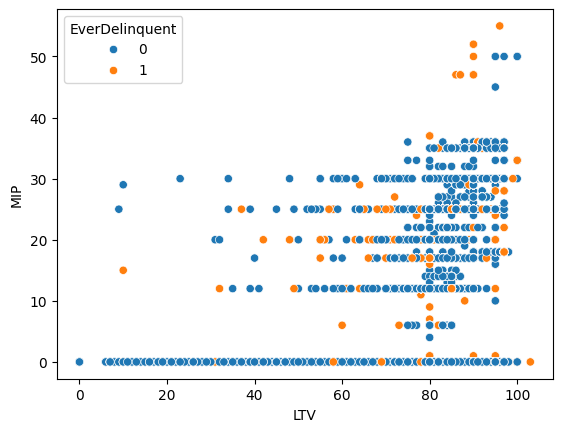

In [ ]:
sns.scatterplot(x=df['LTV'],y=df['MIP'],hue=df['EverDelinquent'])

In [ ]:
object_columns = df.select_dtypes(include=['object']).columns
object_columns

Index(['FirstTimeHomebuyer', 'MSA', 'Occupancy', 'Channel', 'PPM',
       'ProductType', 'PropertyState', 'PropertyType', 'PostalCode',
       'LoanSeqNum', 'LoanPurpose', 'NumBorrowers', 'SellerName',
       'ServicerName'],
      dtype='object')

In [ ]:
numerical_columns = df.select_dtypes(include=['number']).columns
object_columns = df.select_dtypes(include=['object']).columns

In [ ]:
df_numerical = df[numerical_columns]

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df_numerical_scaled = pd.DataFrame(scaler.fit_transform(df_numerical), columns=numerical_columns)


In [ ]:
df_scaled = pd.concat([df_numerical_scaled, df[object_columns]], axis=1)

In [ ]:
print("Scaled DataFrame:")
print(df_scaled.head())

Scaled DataFrame:
   CreditScore  FirstPaymentDate  MaturityDate       MIP     Units     OCLTV  \
0   -10.363262         -0.199733      -0.08496  1.247865 -0.128194  0.790192   
1   -10.363262         -0.199733      -0.08496 -0.728692 -0.128194 -0.259943   
2   -10.363262         -0.199733      -0.08496 -0.728692 -0.128194 -0.128676   
3   -10.363262         -0.199733      -0.08496 -0.728692 -0.128194 -0.063043   
4   -10.363262         -0.199733      -0.08496 -0.728692 -0.128194  0.068224   

        DTI   OrigUPB       LTV  OrigInterestRate  ...  PPM  ProductType  \
0 -0.229738 -0.147983  0.792236         -0.513905  ...    N        FRM     
1 -0.987087 -0.297077 -0.258648         -1.241622  ...    N        FRM     
2 -1.062822 -0.688450 -0.127287         -0.150047  ...    N        FRM     
3 -1.214292  0.653398 -0.061607         -0.150047  ...    N        FRM     
4 -0.911352 -0.297077  0.069753          0.577670  ...    N        FRM     

   PropertyState  PropertyType PostalCode   

In [ ]:
print("Scaled DataFrame:")
print(df_scaled.shape)

Scaled DataFrame:
(291451, 28)


In [ ]:
df_scaled.isnull().any()

CreditScore           False
FirstPaymentDate      False
MaturityDate          False
MIP                   False
Units                 False
OCLTV                 False
DTI                   False
OrigUPB               False
LTV                   False
OrigInterestRate      False
OrigLoanTerm          False
EverDelinquent        False
MonthsDelinquent      False
MonthsInRepayment     False
FirstTimeHomebuyer    False
MSA                   False
Occupancy             False
Channel               False
PPM                   False
ProductType           False
PropertyState         False
PropertyType          False
PostalCode            False
LoanSeqNum            False
LoanPurpose           False
NumBorrowers          False
SellerName            False
ServicerName          False
dtype: bool

In [ ]:
df_object_columns=df[object_columns]
df_object_columns.head()

,FirstTimeHomebuyer,MSA,Occupancy,Channel,PPM,ProductType,PropertyState,PropertyType,PostalCode,LoanSeqNum,LoanPurpose,NumBorrowers,SellerName,ServicerName
0,N,16974,O,T,N,FRM,IL,SF,60400,F199Q1268030,P,2,FL,WASHINGTONMUTUALBANK
1,N,19740,O,R,N,FRM,CO,SF,80200,F199Q1015092,N,1,FL,CHASEHOMEFINANCELLC
2,N,29940,O,T,N,FRM,KS,SF,66000,F199Q1266886,N,2,FL,WASHINGTONMUTUALBANK
3,N,31084,O,R,N,FRM,CA,SF,90700,F199Q1178167,N,2,FL,GMACMTGECORP
4,N,35644,O,R,N,FRM,NJ,SF,7600,F199Q1178517,N,2,FL,GMACMTGECORP


In [ ]:
columns_to_encode = ['FirstTimeHomebuyer', 'MSA', 'Occupancy', 'Channel', 'PPM',
       'ProductType', 'PropertyState', 'PropertyType', 'PostalCode',
       'LoanSeqNum', 'LoanPurpose', 'NumBorrowers', 'SellerName',
       'ServicerName']

In [ ]:

df_object_columns.dtypes

FirstTimeHomebuyer    object
MSA                   object
Occupancy             object
Channel               object
PPM                   object
ProductType           object
PropertyState         object
PropertyType          object
PostalCode            object
LoanSeqNum            object
LoanPurpose           object
NumBorrowers          object
SellerName            object
ServicerName          object
dtype: object

In [ ]:
df_object_columns['MSA']=pd.to_numeric(df_object_columns['MSA'], errors='coerce')
df_object_columns['PostalCode']=pd.to_numeric(df_object_columns['PostalCode'], errors='coerce')
df_object_columns['NumBorrowers']=pd.to_numeric(df_object_columns['NumBorrowers'], errors='coerce')

<ipython-input-14-ad38736e2994>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_object_columns['MSA']=pd.to_numeric(df_object_columns['MSA'], errors='coerce')
<ipython-input-14-ad38736e2994>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_object_columns['PostalCode']=pd.to_numeric(df_object_columns['PostalCode'], errors='coerce')
<ipython-input-14-ad38736e2994>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = val

In [ ]:
df_object_columns.dtypes

,0
FirstTimeHomebuyer,object
MSA,float64
Occupancy,object
Channel,object
PPM,object
ProductType,object
PropertyState,object
PropertyType,object
PostalCode,float64
LoanSeqNum,object


In [ ]:

print(df_object_columns['NumBorrowers'])

0         2.0
1         1.0
2         2.0
3         2.0
4         2.0
         ... 
291446    2.0
291447    2.0
291448    1.0
291449    2.0
291450    2.0
Name: NumBorrowers, Length: 291451, dtype: float64


In [ ]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
for col in columns_to_encode:
    df[col] = le.fit_transform(df_object_columns[col])

print(df)

        CreditScore  FirstPaymentDate  FirstTimeHomebuyer  MaturityDate  MSA  \
0                 0            199902                   0        202901   68   
1                 0            199902                   0        202901   95   
2                 0            199902                   0        202901  198   
3                 0            199902                   0        202901  210   
4                 0            199902                   0        202901  250   
...             ...               ...                 ...           ...  ...   
291446          839            199903                   0        202902  274   
291447          840            200210                   0        202904  250   
291448          840            200304                   0        202904  323   
291449          845            199904                   0        202903  274   
291450          849            199903                   0        202902  274   

        MIP  Units  Occupancy  OCLTV  D

In [ ]:
df.head()

,CreditScore,FirstPaymentDate,FirstTimeHomebuyer,MaturityDate,MSA,MIP,Units,Occupancy,OCLTV,DTI,...,PostalCode,LoanSeqNum,LoanPurpose,OrigLoanTerm,NumBorrowers,SellerName,ServicerName,EverDelinquent,MonthsDelinquent,MonthsInRepayment
0,0,199902,0,202901,68,25,1,1,89,27,...,552,177680,2,360,1,0,17,0,0,52
1,0,199902,0,202901,95,0,1,1,73,17,...,728,7145,1,360,0,0,3,0,0,144
2,0,199902,0,202901,198,0,1,1,75,16,...,602,176597,1,360,1,0,17,0,0,67
3,0,199902,0,202901,210,0,1,1,76,14,...,807,116959,1,360,1,0,10,0,0,35
4,0,199902,0,202901,250,0,1,1,78,18,...,68,117300,1,360,1,0,10,0,0,54


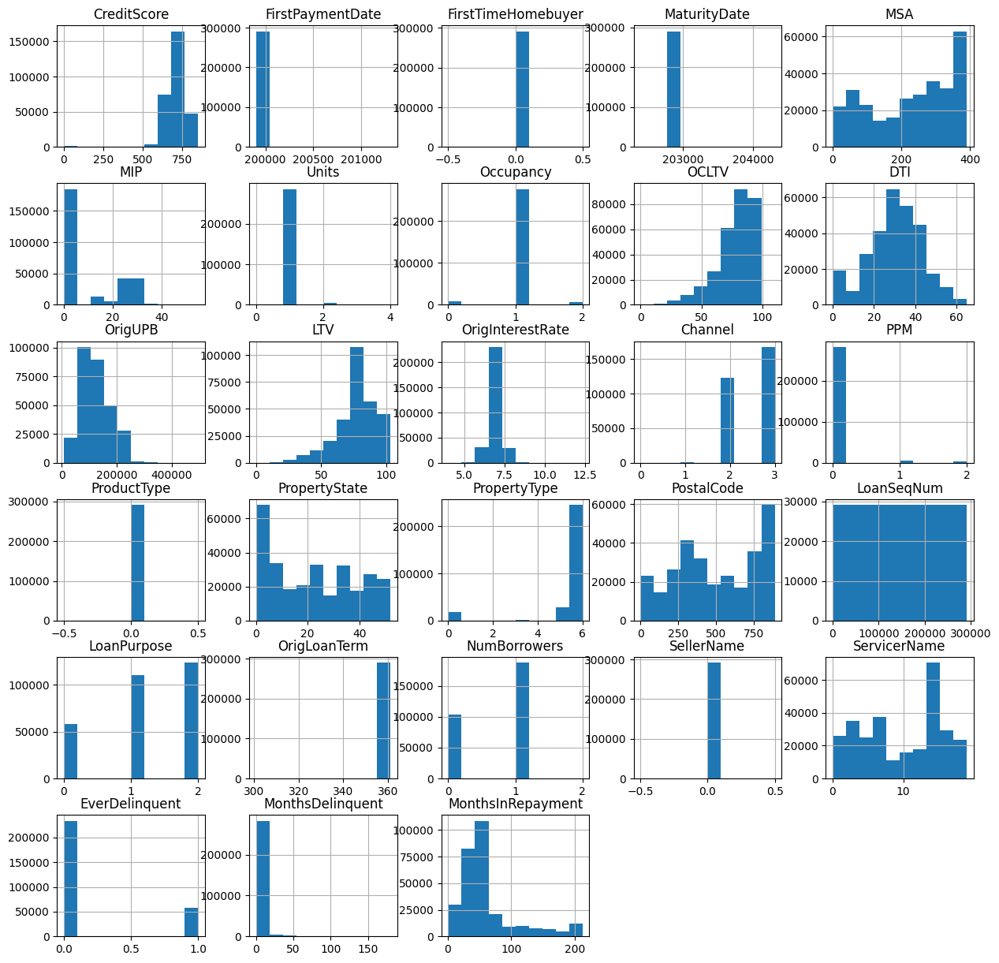

In [ ]:
import matplotlib.pyplot as plt
df.hist(figsize=(15,15),bins=10)
plt.show()

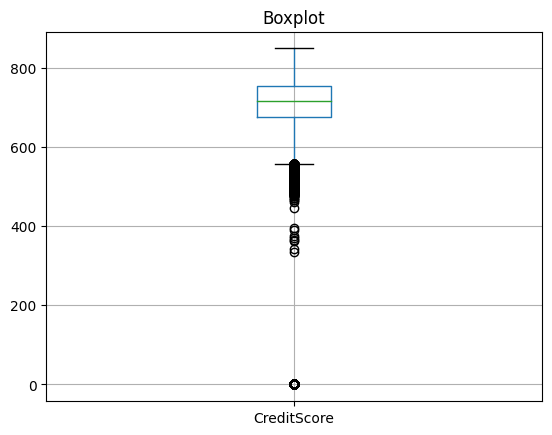

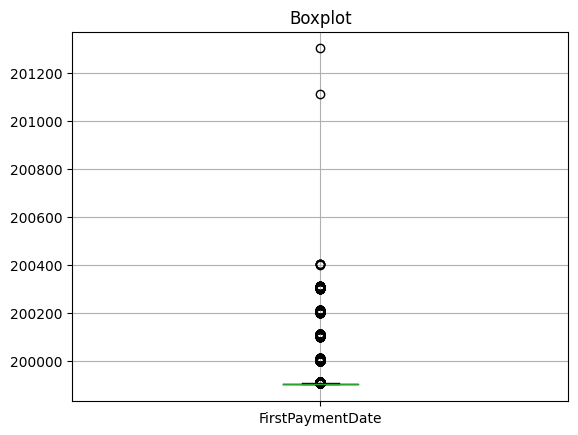

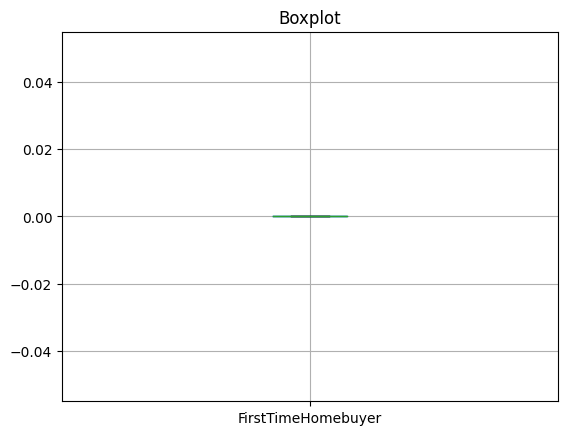

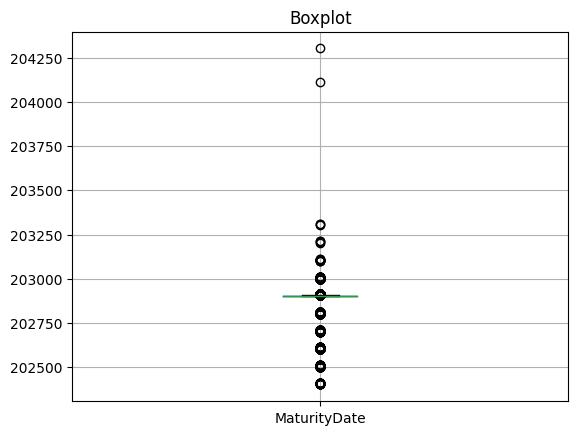

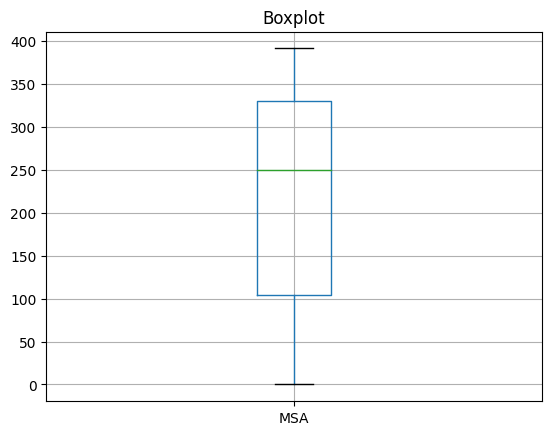

...

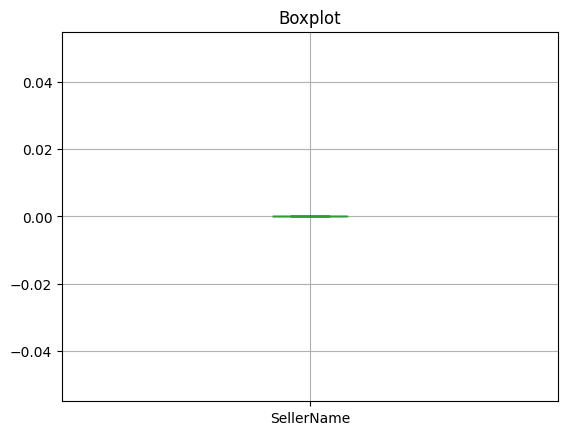

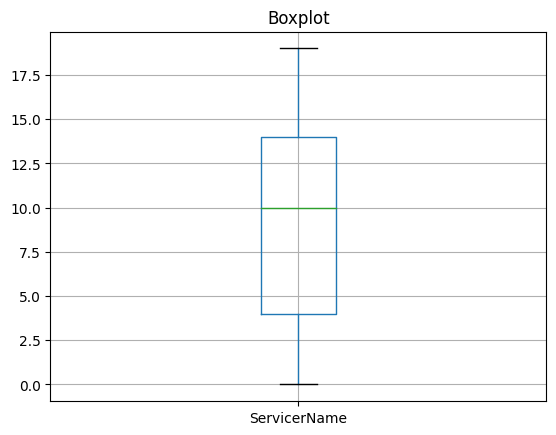

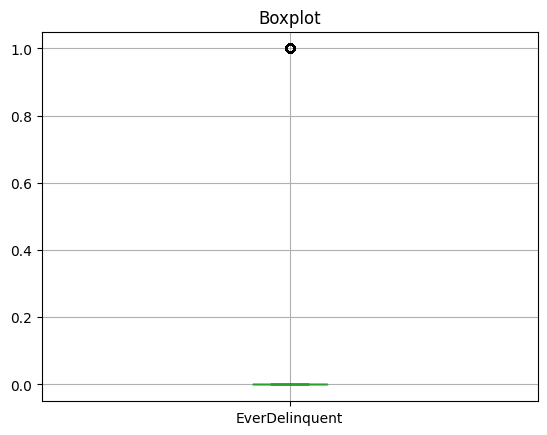

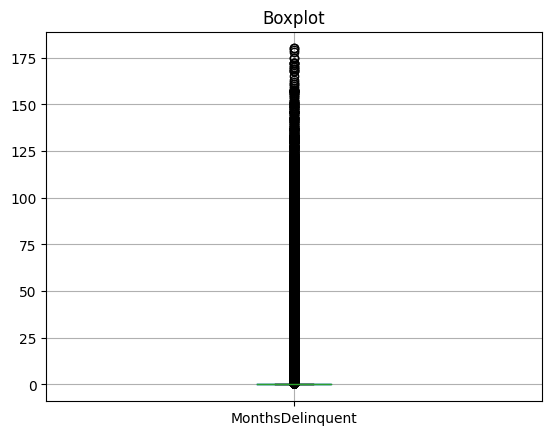

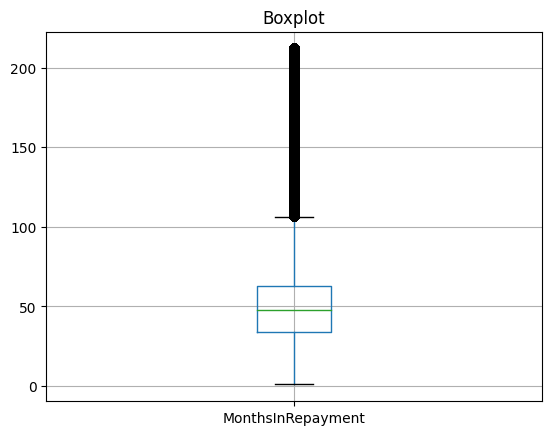

In [ ]:
for var in df.select_dtypes(exclude='O'): ## Loop which contains only numerical variables
    df.boxplot(var)
    plt.title('Boxplot')
    plt.show()

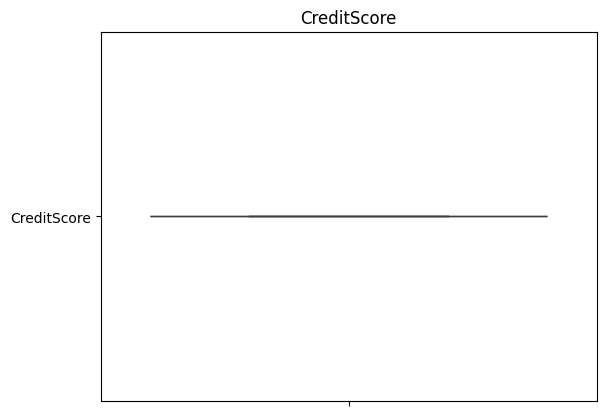

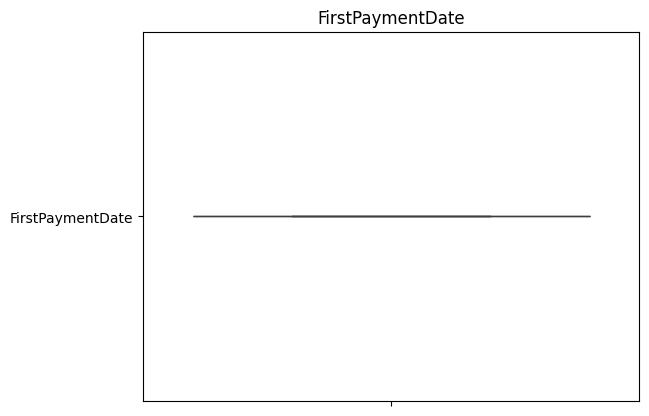

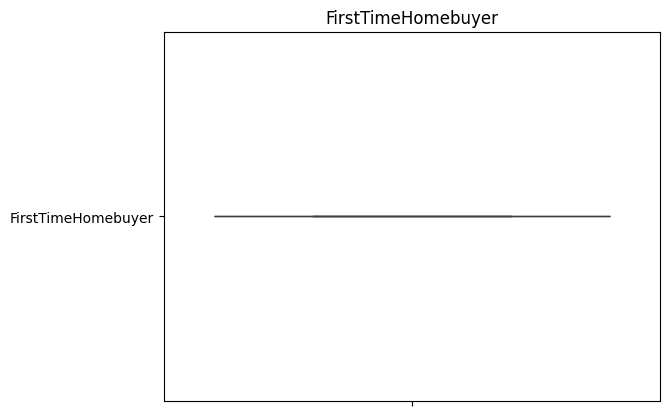

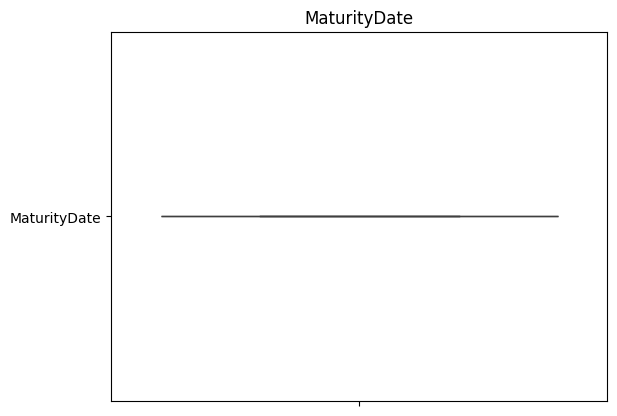

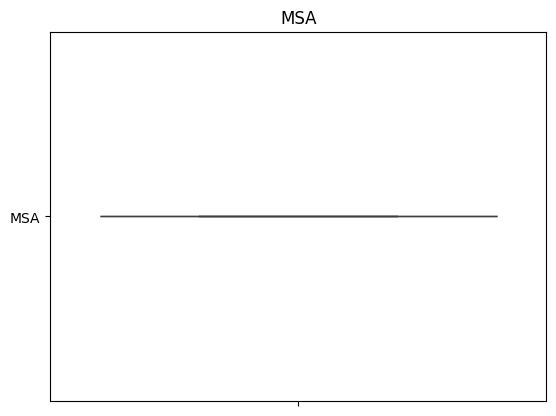

...

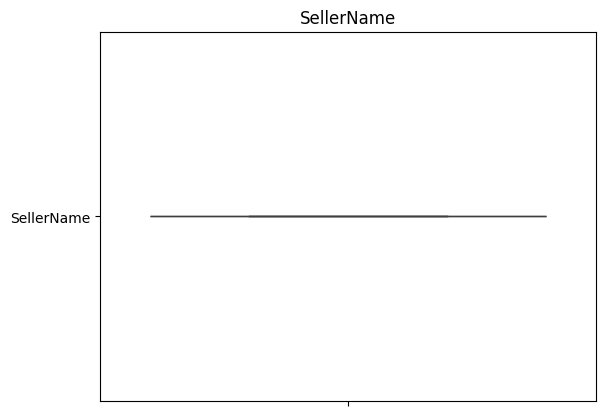

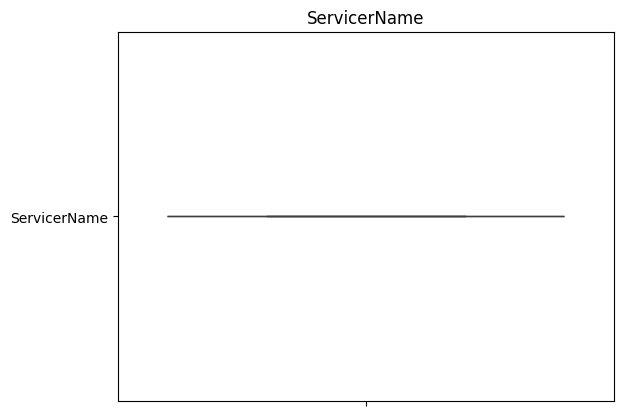

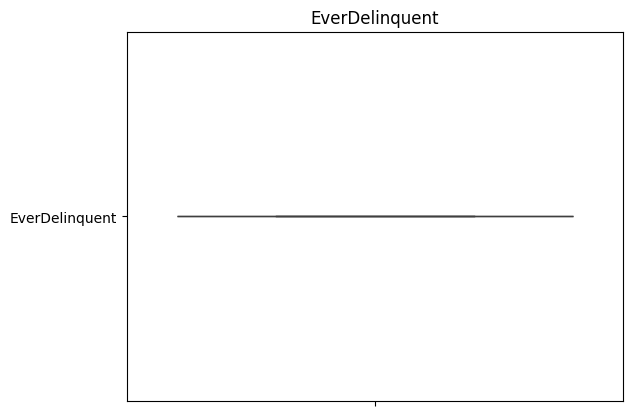

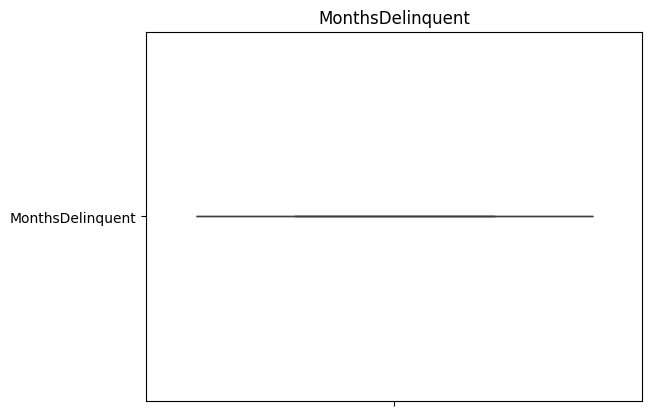

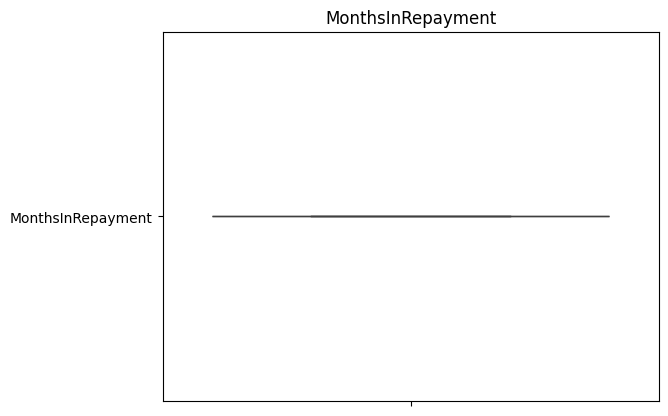

In [ ]:
import seaborn as sns
for data in df:
  sns.boxplot(data)
  plt.title(data)
  plt.show()

<Axes: xlabel='EverDelinquent', ylabel='Density'>

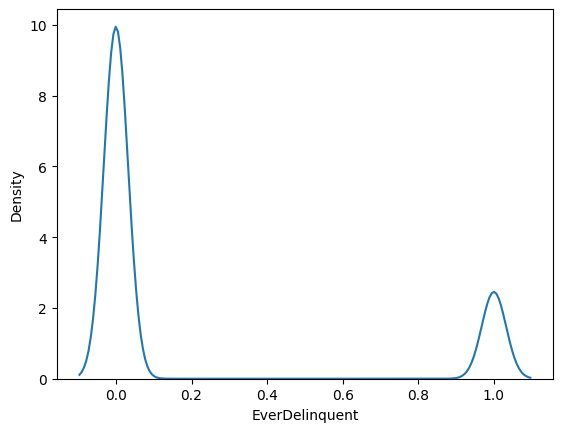

In [ ]:
sns.kdeplot(data=df,x='EverDelinquent',gridsize=200) ## Plotiing the kde plot for everdelinquent

In [ ]:
def distplot(df): ## Creating a function which will plot the kde plot of the variables
    plt.figure(figsize=(8,8))
    sns.kdeplot(df)
    plt.title('Density Plot')
    plt.show()


<ipython-input-84-1d92ca6947be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


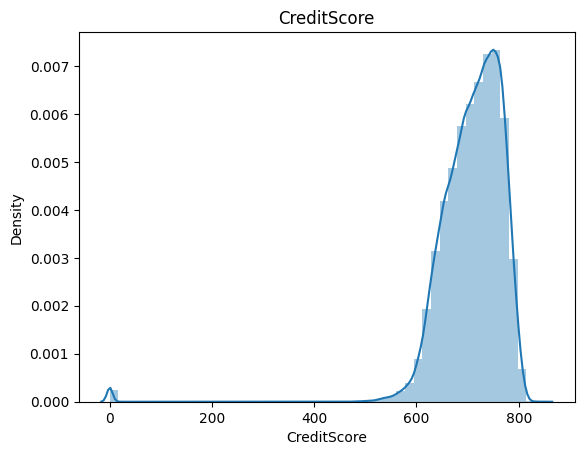

<ipython-input-84-1d92ca6947be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


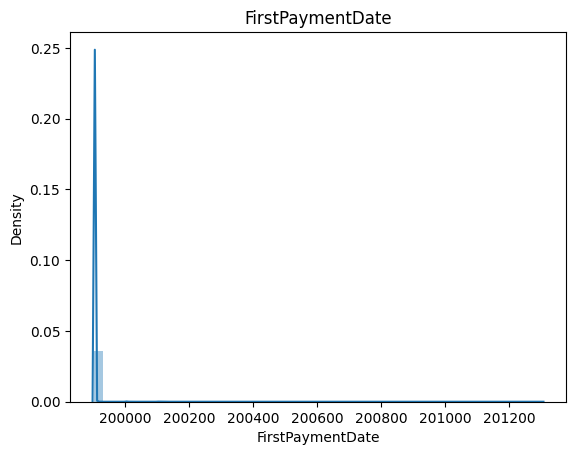

<ipython-input-84-1d92ca6947be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])
/usr/local/lib/python3.10/dist-packages/seaborn/distributions.py:2496: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)


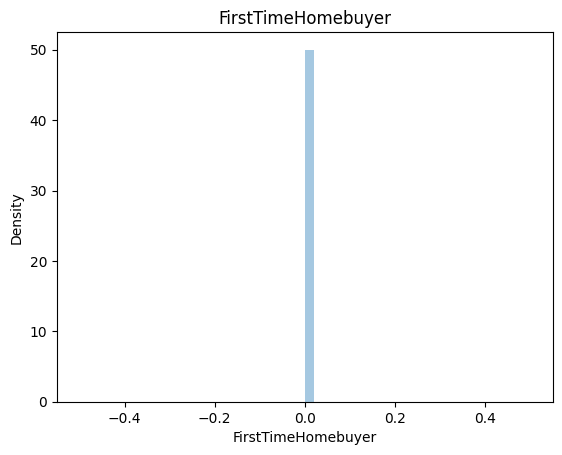

<ipython-input-84-1d92ca6947be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


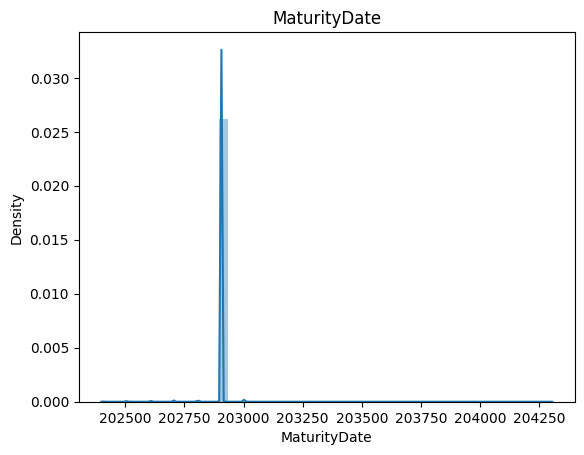

<ipython-input-84-1d92ca6947be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


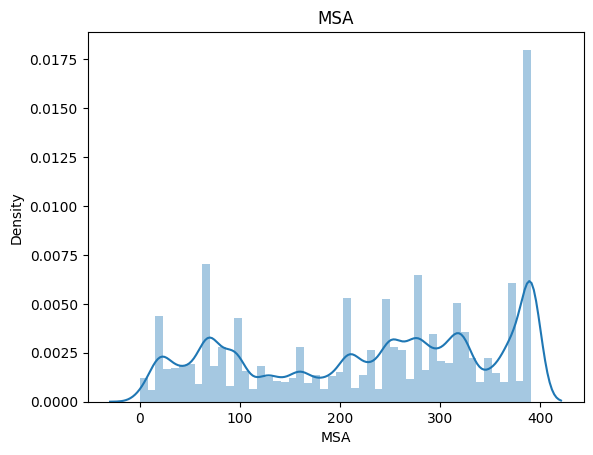

<ipython-input-84-1d92ca6947be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


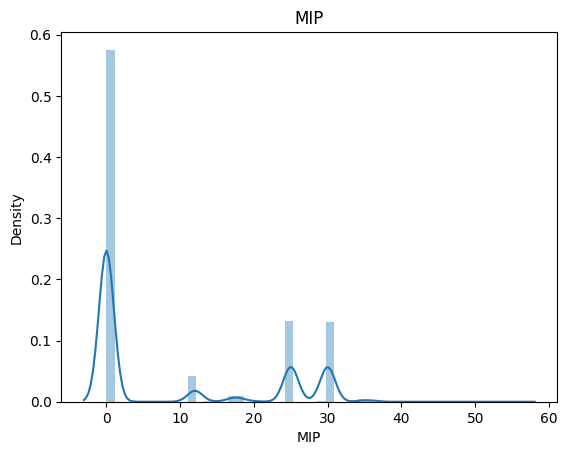

<ipython-input-84-1d92ca6947be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


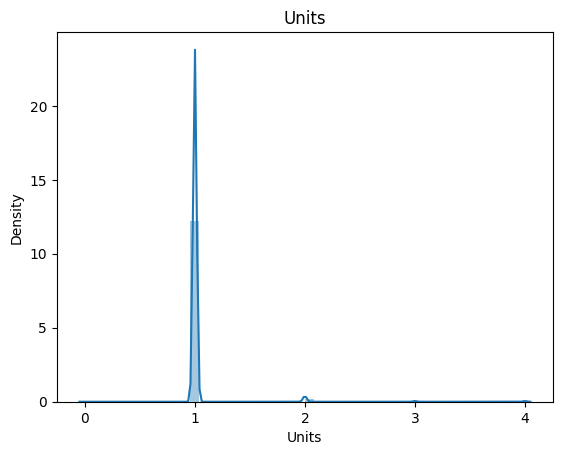

<ipython-input-84-1d92ca6947be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


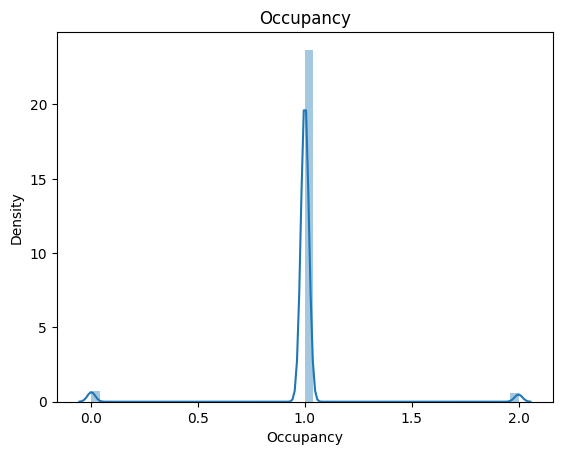

<ipython-input-84-1d92ca6947be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


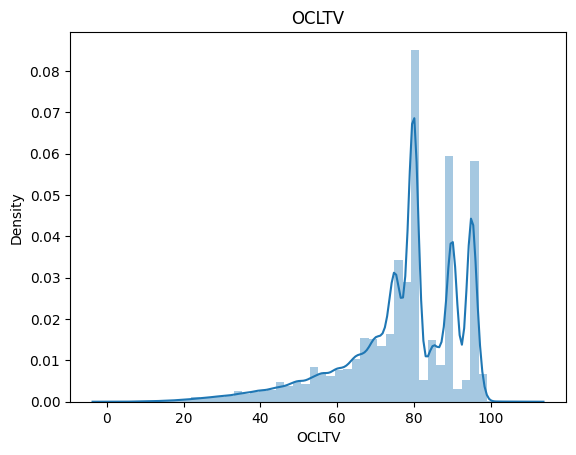

<ipython-input-84-1d92ca6947be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


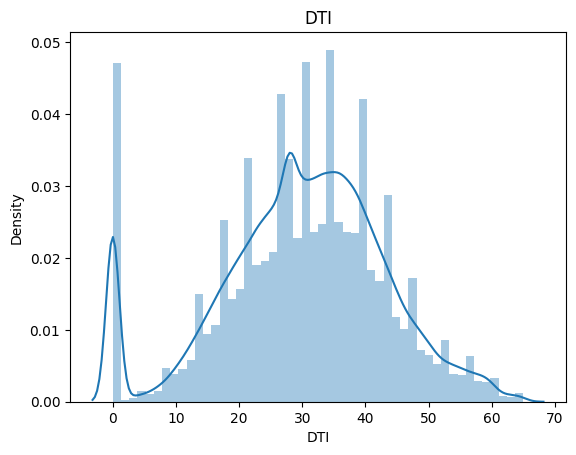

<ipython-input-84-1d92ca6947be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


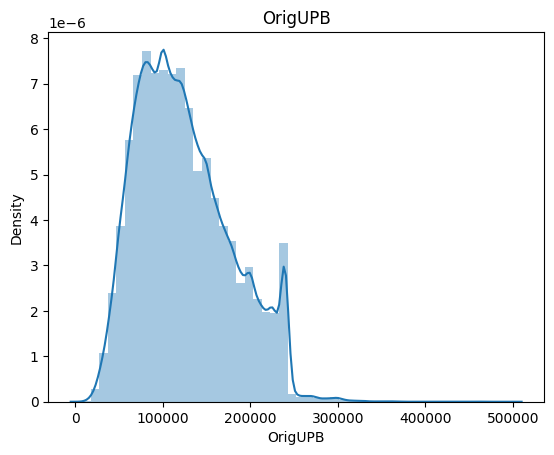

<ipython-input-84-1d92ca6947be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


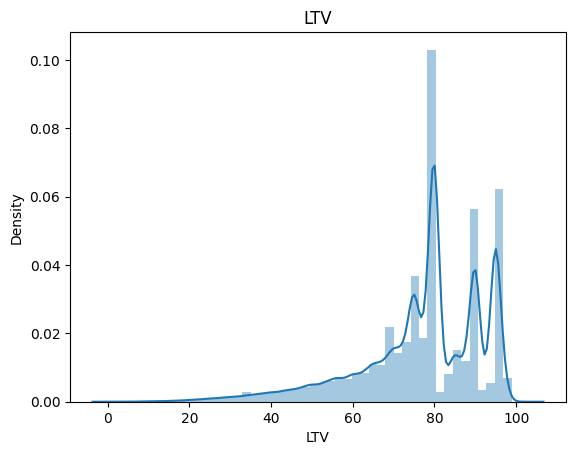

<ipython-input-84-1d92ca6947be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


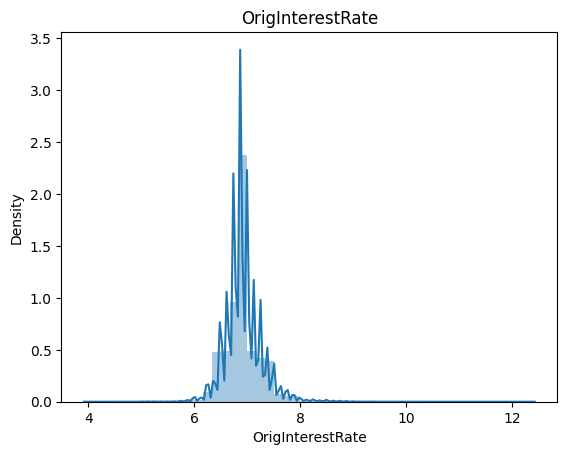

<ipython-input-84-1d92ca6947be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


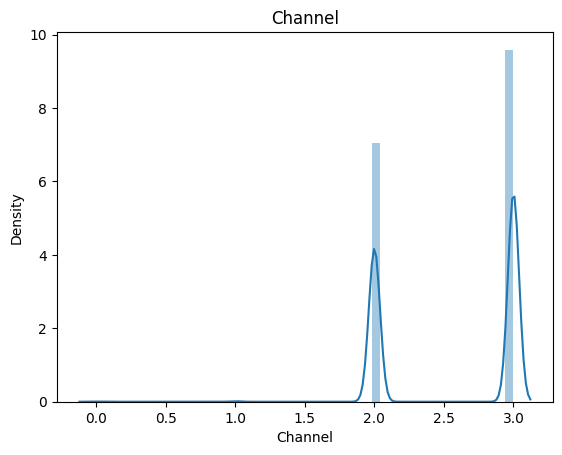

<ipython-input-84-1d92ca6947be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


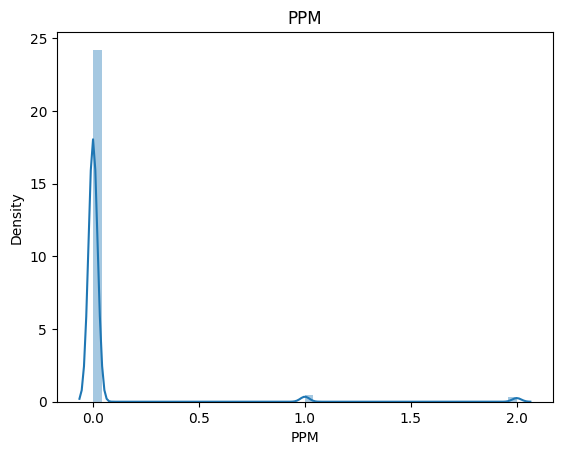

<ipython-input-84-1d92ca6947be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])
/usr/local/lib/python3.10/dist-packages/seaborn/distributions.py:2496: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)


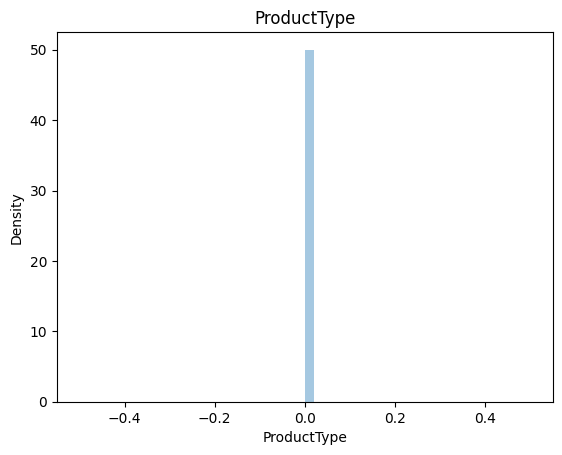

<ipython-input-84-1d92ca6947be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


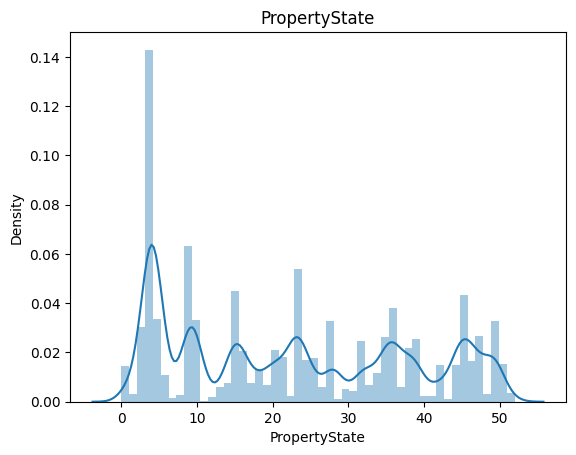

<ipython-input-84-1d92ca6947be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


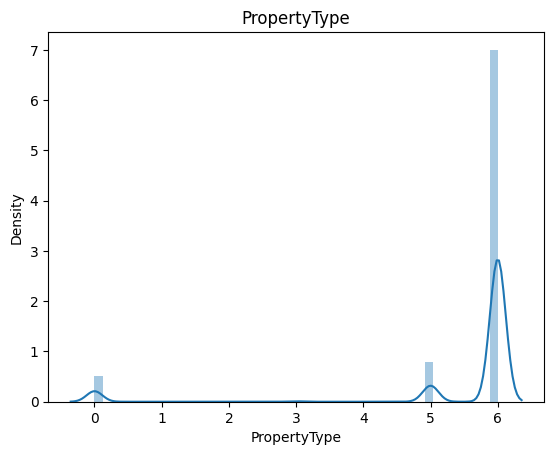

<ipython-input-84-1d92ca6947be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


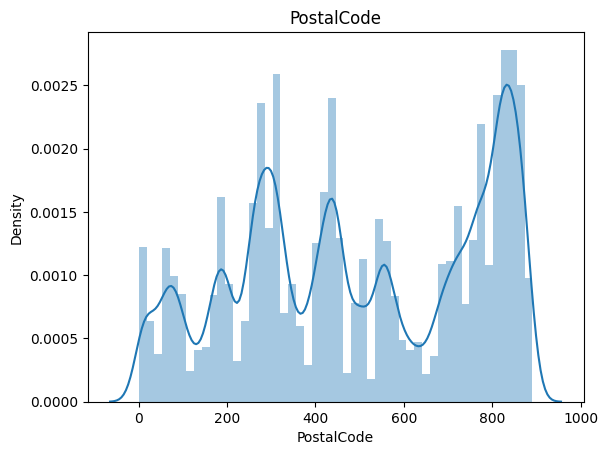

<ipython-input-84-1d92ca6947be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


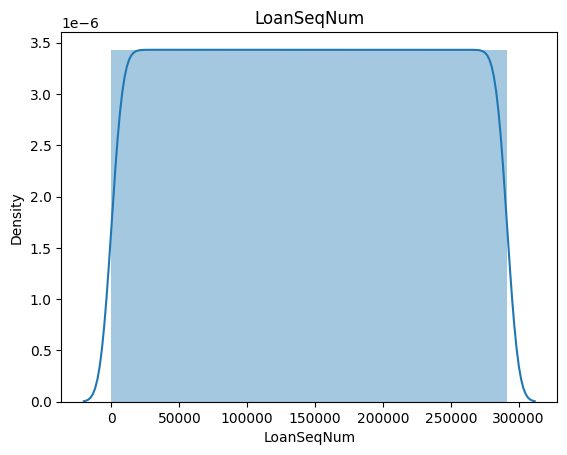

<ipython-input-84-1d92ca6947be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


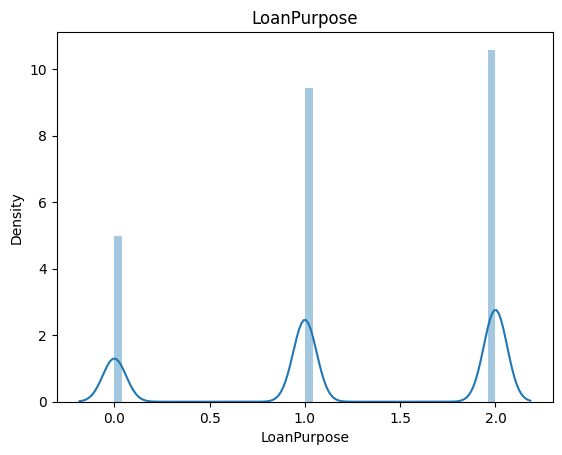

<ipython-input-84-1d92ca6947be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


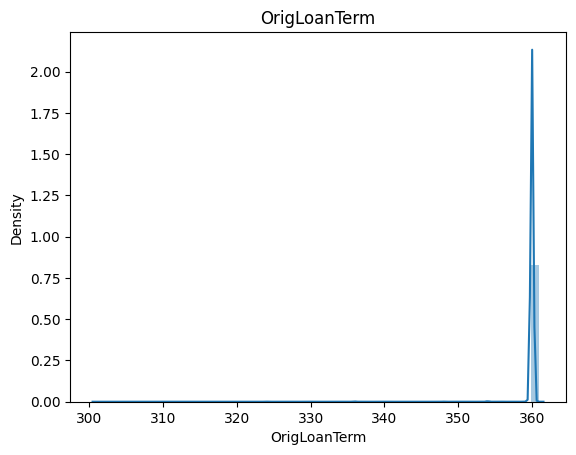

<ipython-input-84-1d92ca6947be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


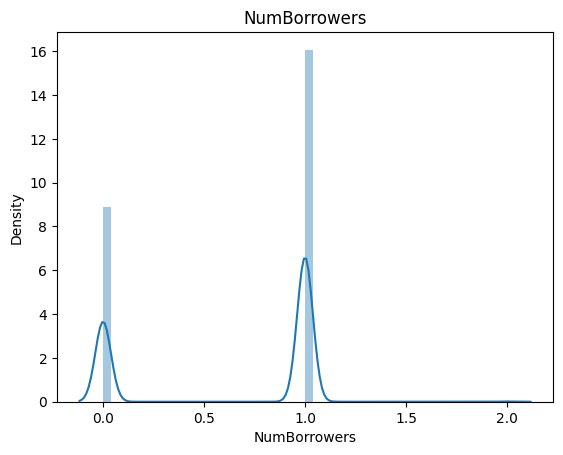

<ipython-input-84-1d92ca6947be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])
/usr/local/lib/python3.10/dist-packages/seaborn/distributions.py:2496: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)


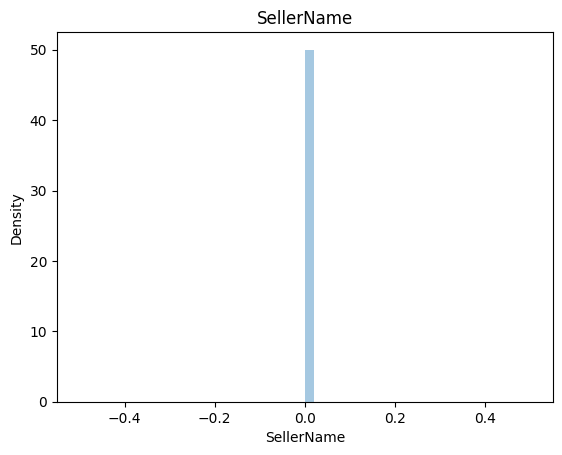

<ipython-input-84-1d92ca6947be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


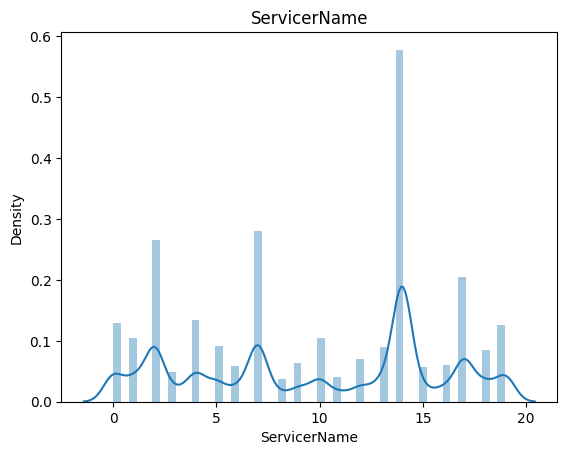

<ipython-input-84-1d92ca6947be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


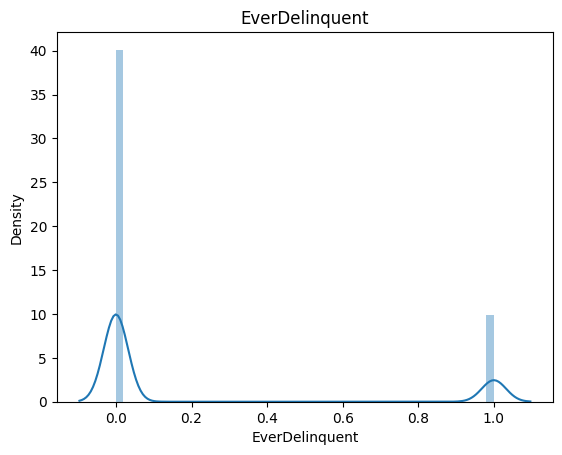

<ipython-input-84-1d92ca6947be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


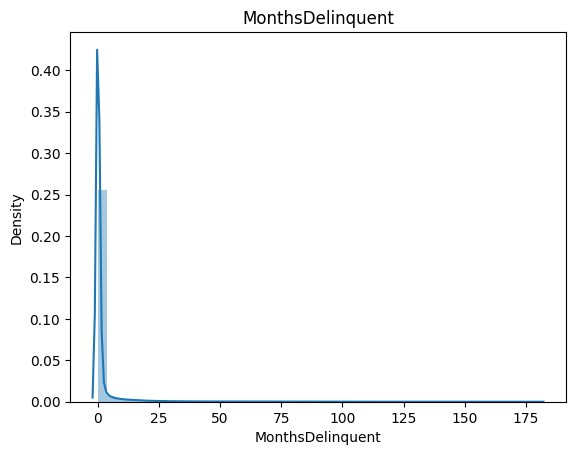

<ipython-input-84-1d92ca6947be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


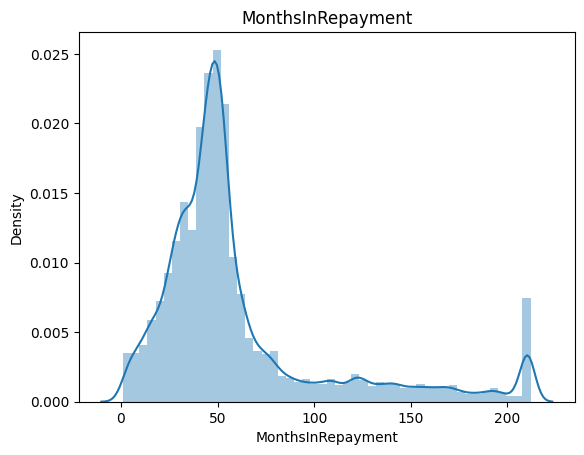

In [ ]:
# var=['CreditScore','OCLTV','LTV','OrigInterestRate','DTI','OrigUPB',
    # 'MonthsDelinquent','MonthsInRepayment']
for variable in df:
  sns.distplot(df[variable])
  plt.title(variable)
  plt.show()
     ## Loop which creates the density plot for all the variables mentioned in the list

Text(0, 0.5, 'probability')

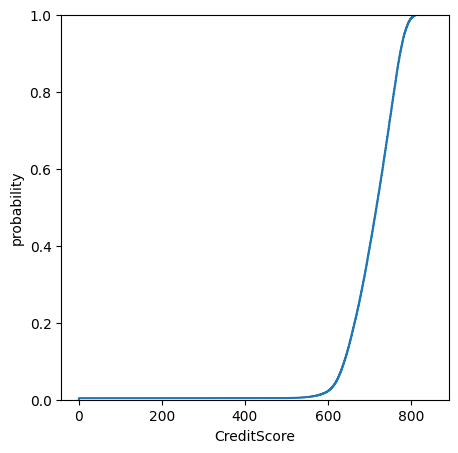

In [ ]:
plt.figure(figsize=(5,5))
sns.ecdfplot(data=df,x='CreditScore')
plt.ylabel('probability')

Text(0, 0.5, '% of borrowers')

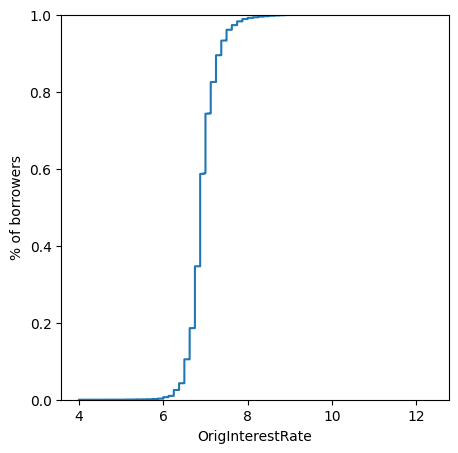

In [ ]:
plt.figure(figsize=(5,5))
sns.ecdfplot(data=df,x='OrigInterestRate')
plt.ylabel('% of borrowers')

In [ ]:
# Observations:
# Approximately 3% of the borrowers have ocltv ratio less than 40

# Around 10% of the borrowers have an ocltv ratio less than 60

# Approximately 40% of the borrowers have an ocltv ratio less than 80

Text(0, 0.5, '% of borrowers')

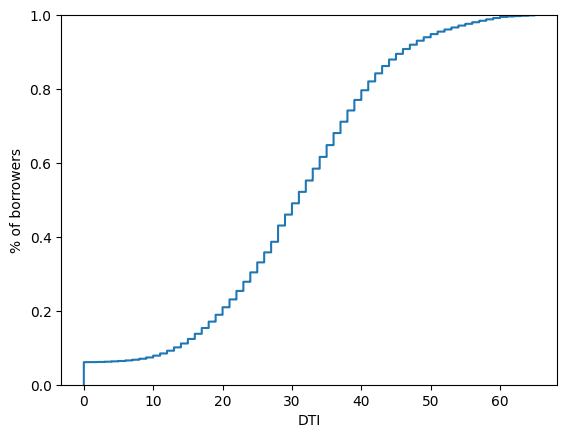

In [ ]:
sns.ecdfplot(data=df,x='DTI')
plt.ylabel('% of borrowers')

In [ ]:
# Observations:
# Approx 40% of the borrowers have DTI ratio less than 30

# Approx 70% of the borrowers have DTI ratio less than 40

# Approx 90% of the borrowers have DTI ratio less than 50

<ipython-input-90-32b6b765b4b3>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='LoanPurpose',data=df,palette='husl')


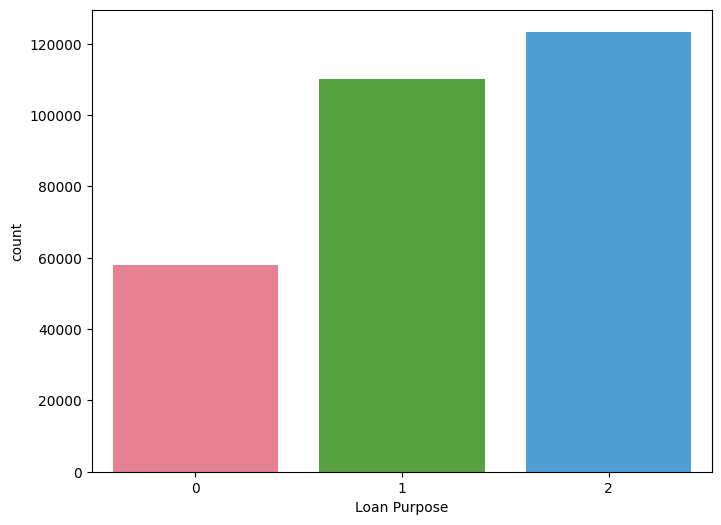

In [ ]:
plt.figure(figsize=(8,6))
sns.countplot(x='LoanPurpose',data=df,palette='husl')
plt.xlabel('Loan Purpose')
# plt.ylabel('Frequency')
plt.show() ## Plotting the countplot for loan purpose

In [ ]:
# Observations:
# The borrowers are mostly taking loans for purpose 2 followed by 0 and then 1

In [ ]:
df['Occupancy'].value_counts()

,count
Occupancy,
1,276131
0,8734
2,6586


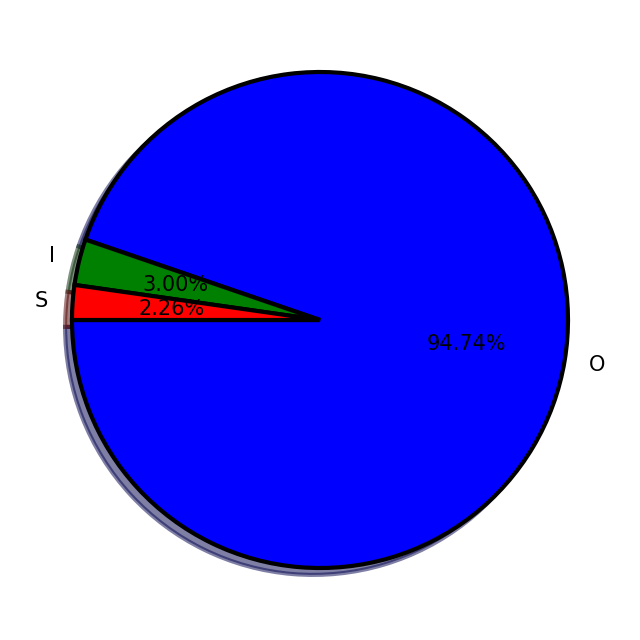

In [ ]:
plt.figure(figsize=(8,9))
plt.pie(df['Occupancy'].value_counts(),labels=['O','I','S'],autopct='%1.2f%%',
       colors=['b','g','r'],startangle=180,shadow=True,textprops={'fontsize':15},
       wedgeprops={'linewidth':3,'width':1,'edgecolor':'k'},explode=[0,0,0])
plt.show()

In [ ]:
# Observations:
# 94.74% of the observations are owner occupied
# 3% of the observations are for investment incentive
# 2.26% of the observations are for second home

<ipython-input-95-424ab1296d63>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='PPM',data=df,palette='Set2')


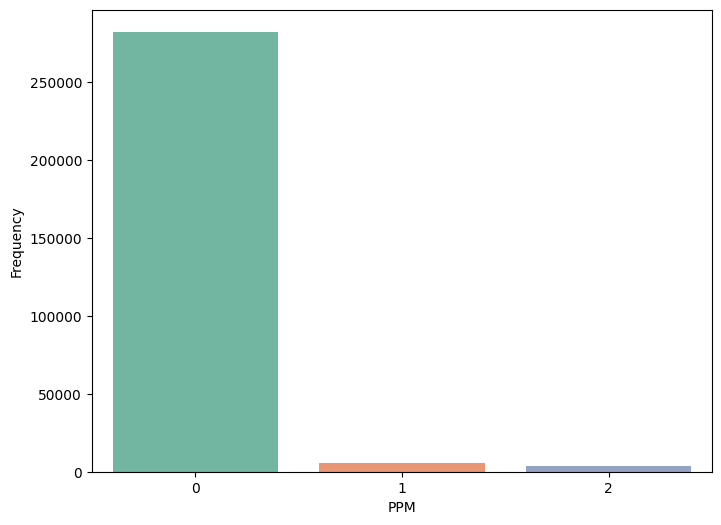

In [ ]:
plt.figure(figsize=(8,6))
sns.countplot(x='PPM',data=df,palette='Set2')
plt.xlabel('PPM')
plt.ylabel('Frequency')
plt.show()

In [ ]:
# Observations:
# In most of the transactions there is no PPM. That means the borrowers are not paying penalty on their loans

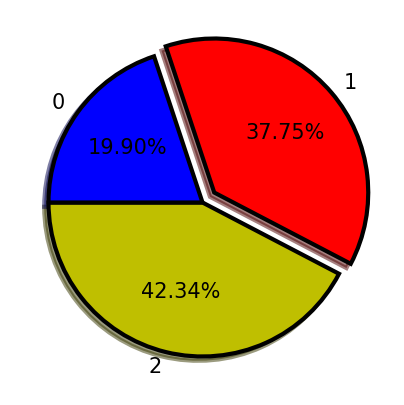

In [ ]:
plt.figure(figsize=(5,5))
plt.pie(df['LoanPurpose'].value_counts(),labels=df['LoanPurpose'].unique(),autopct='%1.2f%%',
       colors=['y','r','b'],startangle=180,shadow=True,textprops={'fontsize':15},
       wedgeprops={'linewidth':3,'width':1,'edgecolor':'k'},explode=[0,0.1,0])
plt.show()

In [ ]:
# Observations:
# 42.34% of the loans are for purpose 2 As P
# 37.75% of the loans are for purpose 1 as N
# 19.9% of the loans are for purpose 0 as  C

<ipython-input-99-b0664ca32dbd>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='ServicerName',data=df,palette='husl')


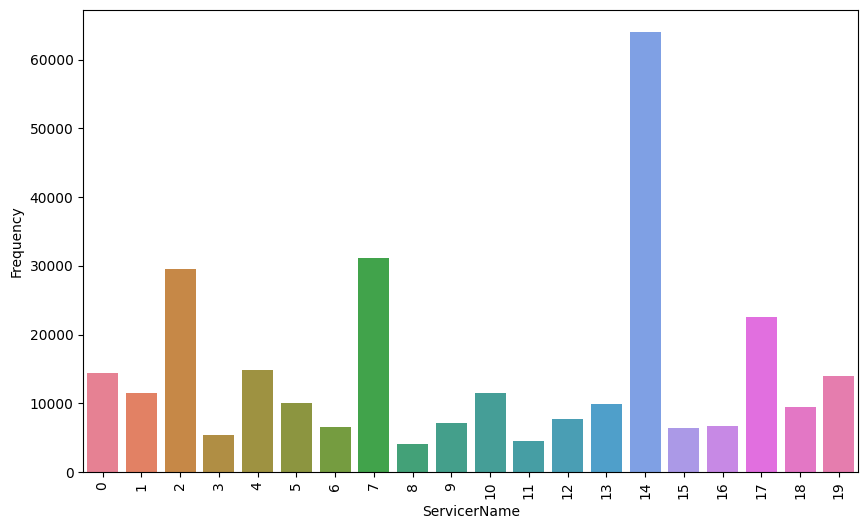

In [ ]:
plt.figure(figsize=(10,6))
sns.countplot(x='ServicerName',data=df,palette='husl')
plt.xlabel('ServicerName')
plt.xticks(rotation=90)
plt.ylabel('Frequency')
plt.show()

In [ ]:
# Observations:
# Other servicers are giving maximum loans The Servicers who are reluctant to give loans means that there are more cases of prepayment in that banks or financial institutions.

<ipython-input-101-31bbd1edd2af>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='NumBorrowers',data=df,palette='viridis')


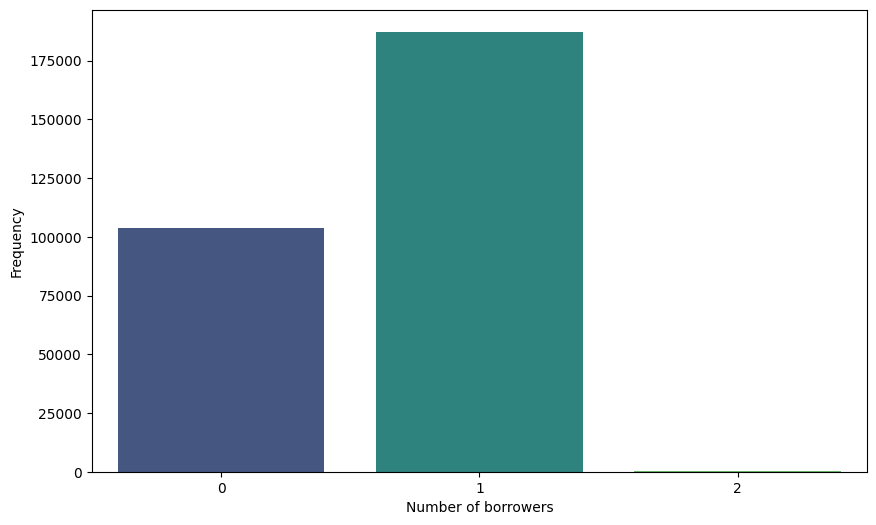

In [ ]:
plt.figure(figsize=(10,6))
sns.countplot(x='NumBorrowers',data=df,palette='viridis')
plt.xlabel('Number of borrowers')
plt.ylabel('Frequency')
plt.show()

In [ ]:
# Observations:
# We can see that the number of borrowers who are taking maximum loans are 2. That means delinquency rate may vary as in most cases there are mix of borrowers who are taking loans


<Axes: xlabel='PropertyType'>

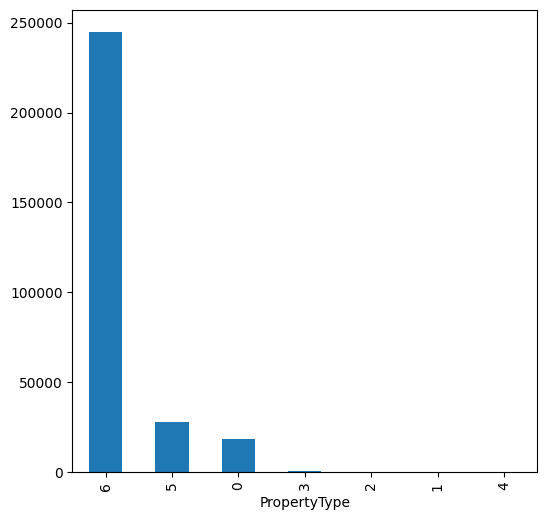

In [ ]:

plt.figure(figsize=(6,6))
df['PropertyType'].value_counts().plot.bar()

In [ ]:
# Observations:
# Highest number of observations are from property type SF as 5. This means that the loan is taken mostly for the property type SF

In [ ]:
## Creating a function which plots histogram and q-q plot for the variables to check normality
import scipy.stats as stats
def distribution_plot(df,variable):
    plt.figure(figsize=(6,6)) ## figure size is 6,6

    plt.subplot(1,2,1) ## 1st row, 2 columns, 1st chart
    df[variable].hist(bins=30)
    plt.title('Histogram of {}'.format(variable))

    plt.subplot(1,2,2) ## 1st row,2 columns, 2nd chart
    stats.probplot(df[variable],dist='norm',plot=plt) ## probability plot or q-q plot with distribution as normal
    plt.title('Q-Q Plot of {}'.format(variable))

    plt.show() ## plotting histogram and q-q plot of the variables before handling outliers

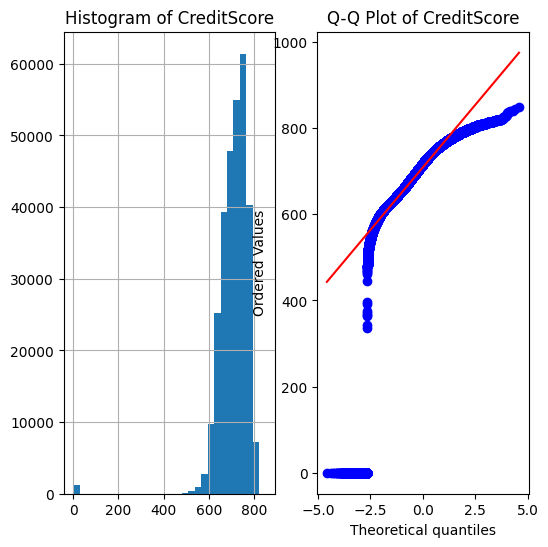

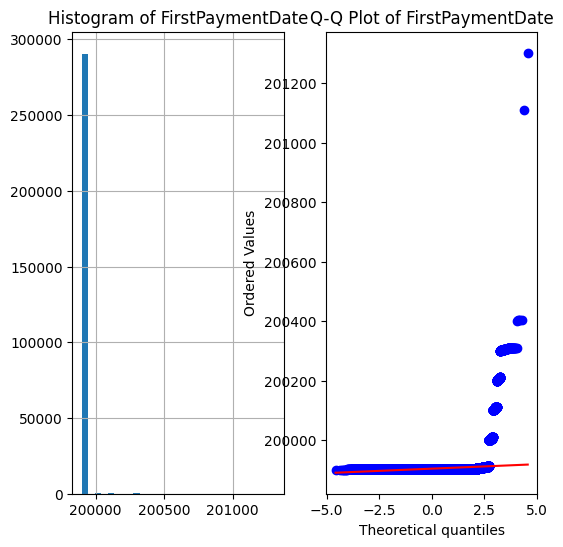

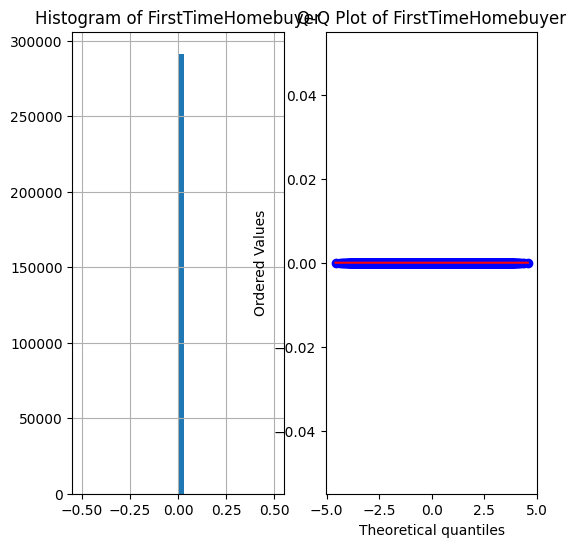

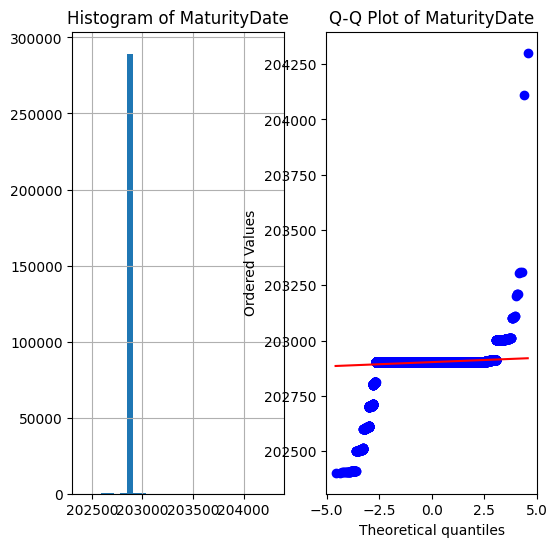

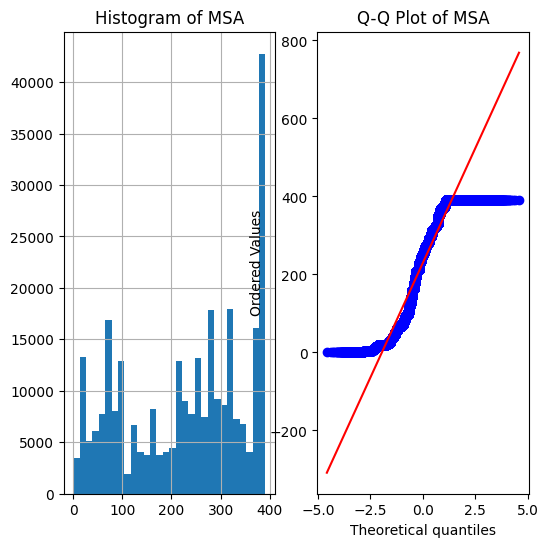

...

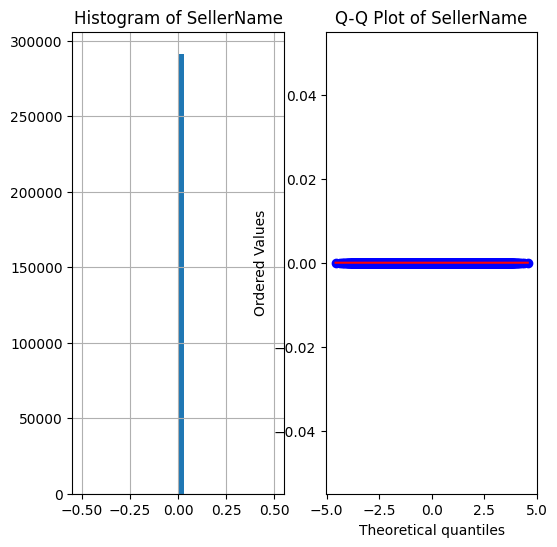

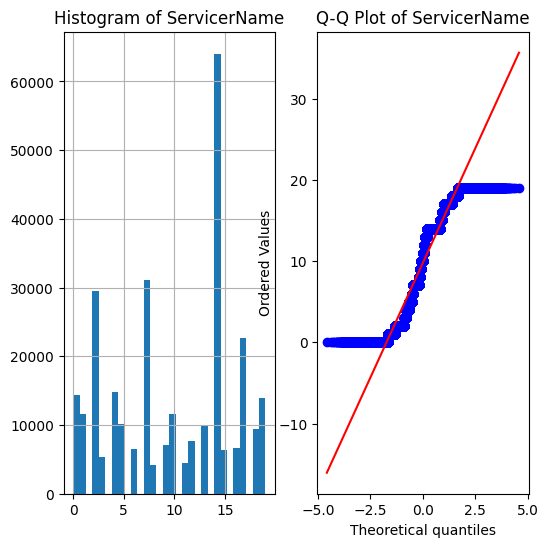

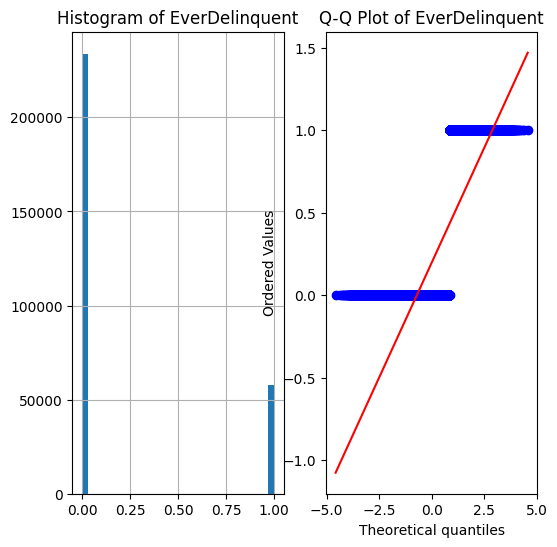

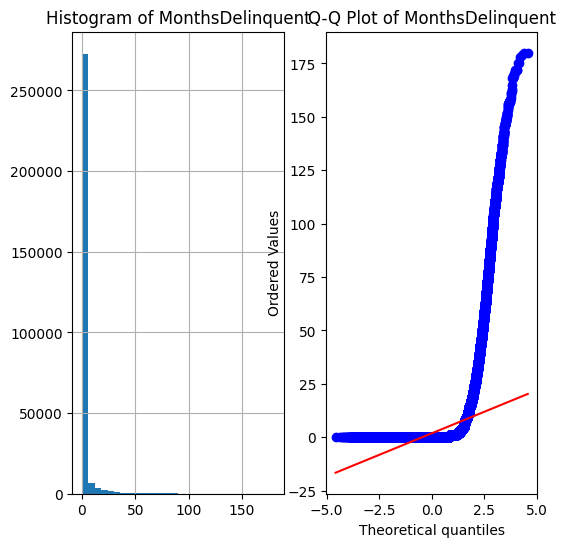

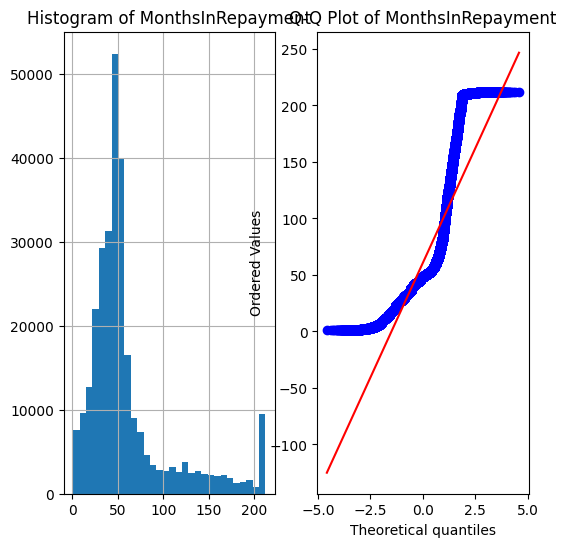

In [ ]:
for i in df:
  distribution_plot(df,variable=i)

In [ ]:
# Observations:
# We can see that there are some variables which follows a skewed distribution and some follow gaussian distribution. We can transform the variables which are skewed to the normal distribution by applying appropriate transformation

In [ ]:
# Bivariate Analysis/Multivariate Analysis
# Numerical vs Numerical
# Numerical vs Categorical
# Categorical vs Categorical

In [ ]:
df.columns

Index(['CreditScore', 'FirstPaymentDate', 'FirstTimeHomebuyer', 'MaturityDate',
       'MSA', 'MIP', 'Units', 'Occupancy', 'OCLTV', 'DTI', 'OrigUPB', 'LTV',
       'OrigInterestRate', 'Channel', 'PPM', 'ProductType', 'PropertyState',
       'PropertyType', 'PostalCode', 'LoanSeqNum', 'LoanPurpose',
       'OrigLoanTerm', 'NumBorrowers', 'SellerName', 'ServicerName',
       'EverDelinquent', 'MonthsDelinquent', 'MonthsInRepayment'],
      dtype='object')

<Axes: xlabel='DTI', ylabel='CreditScore'>

/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


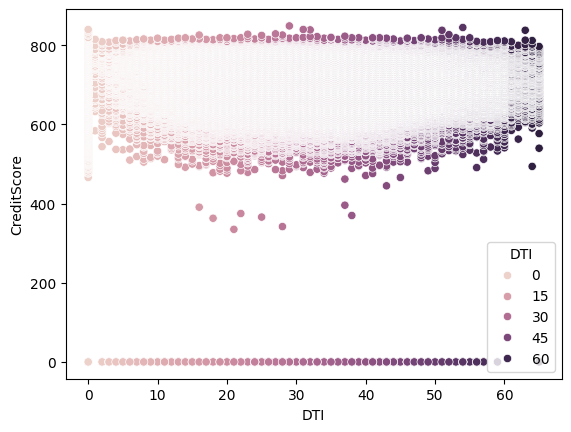

In [ ]:
sns.scatterplot(x=df['DTI'],y=df['CreditScore'],hue=df['DTI'])

In [ ]:
# Observations:
# There is a negative relationship between DTI and Credit Score. As DTI increases, Creditscore tends to fall which means that the delinquency rate rises

<Axes: xlabel='LTV', ylabel='DTI'>

/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


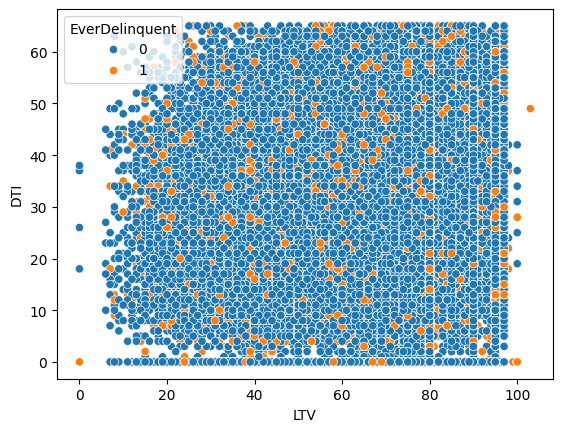

In [ ]:
sns.scatterplot(x=df['LTV'],y=df['DTI'],hue=df['EverDelinquent'])

In [ ]:
# Observations:
# There is a positive relation between LTV and DTI. AS LTV rises, DTI also rises and with an increase in DTI most of the buyers are non-delinquent i.e. they are not behind their payments. Here with an increase in DTI the buyers are still making their payments on time

<Axes: xlabel='OrigInterestRate', ylabel='CreditScore'>

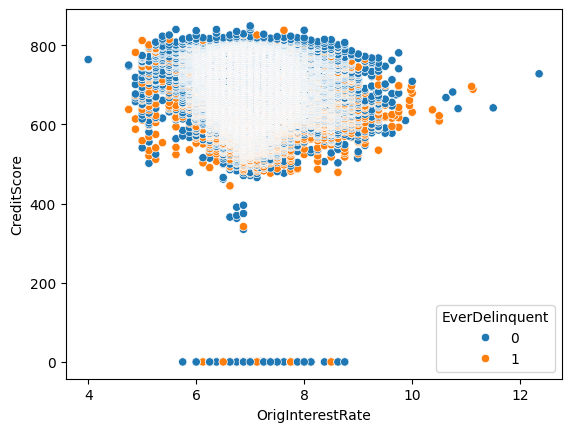

In [ ]:

sns.scatterplot(x=df['OrigInterestRate'],y=df['CreditScore'],hue=df['EverDelinquent'])

In [ ]:
# Observations:
# There is an inverse relation between interest rate and credit score. Again the borrowers are non-delinquent with a fall in credit score due to rise in interest rates. Delinquency rates are lower

<Axes: xlabel='OCLTV', ylabel='OrigInterestRate'>

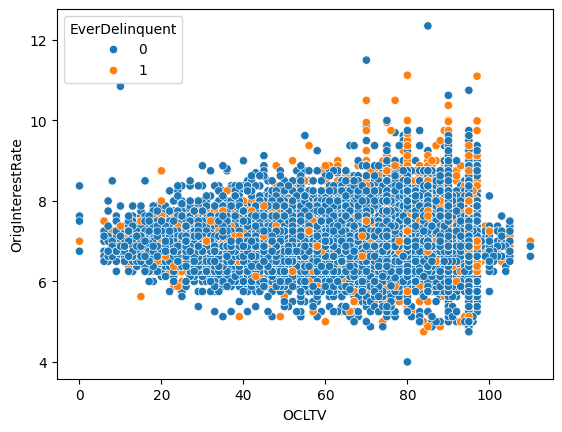

In [ ]:
sns.scatterplot(x=df['OCLTV'],y=df['OrigInterestRate'],hue=df['EverDelinquent'])

In [ ]:
# Observations:
# There is a positive relation between OCLTV and OrigInterestRate. As ocltv rises the interest rates are rising but most of the borrowers are non-delinquent so the delinquency rate is lower

<Axes: xlabel='LTV', ylabel='MIP'>

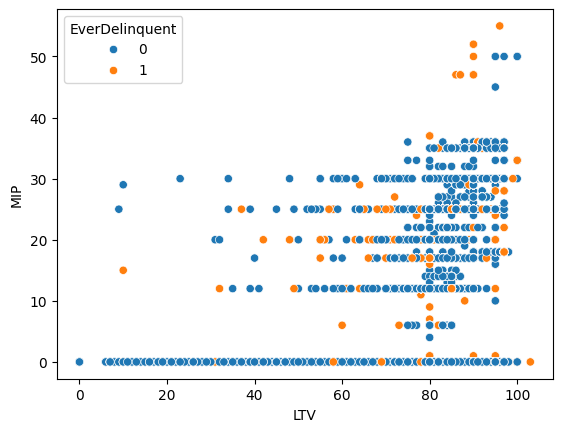

In [ ]:
sns.scatterplot(x=df['LTV'],y=df['MIP'],hue=df['EverDelinquent'])

In [ ]:
# Observations:
# There is a positive relationship between LTV and MIP. With an increase in MIP there are still more non-delinquent borrowers

<Axes: xlabel='Occupancy', ylabel='CreditScore'>

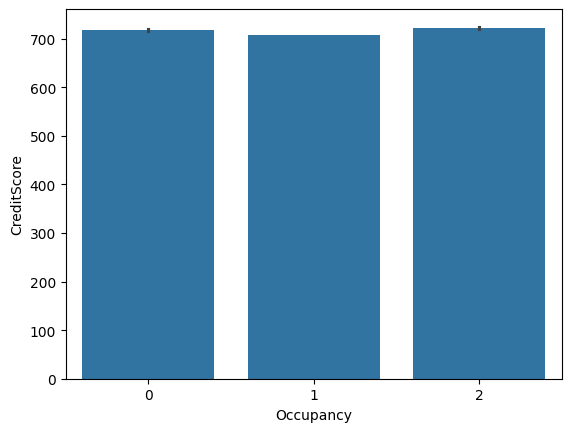

In [ ]:
sns.barplot(data=df,x='Occupancy',y='CreditScore')

In [ ]:
# Observations:
# Highest Credit score is in Occupancy S i.e. Second home. This means that when the borrower is keeping the house as a seasonal residence rather than his primary residence then the delinquency rates are lower because of high credit score

<Axes: xlabel='LoanPurpose', ylabel='DTI'>

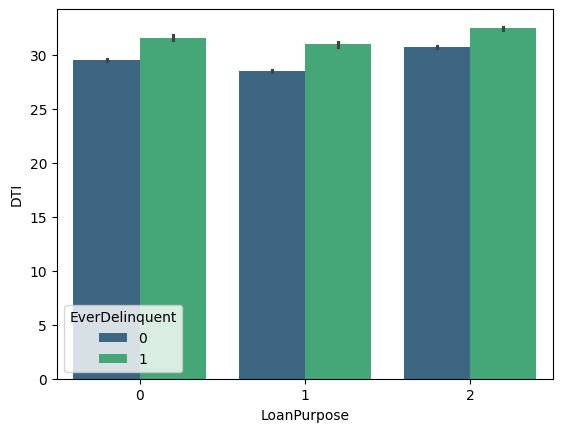

In [ ]:
sns.barplot(x=df['LoanPurpose'],y=df['DTI'],hue=df['EverDelinquent'],palette='viridis')

In [ ]:
# Observations:
# When the loan is taken for purchasing a property i.e. a home purchase then the DTI ratio is the highest for delinquent borrowers borrowers,this means that in case of purchase the delinquency rates are highest. When the mortgage loan is taken for the purpose of refinancing an existing mortgage then the DTI ratio is the lowest for delinquent borrowers, therefore in case of refinancing an existing mortgage the delinquency rates are comparatively lower

<ipython-input-124-909bc374c53d>:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=df['NumBorrowers'],y=df['MIP'],palette='Set2')


<Axes: xlabel='NumBorrowers', ylabel='MIP'>

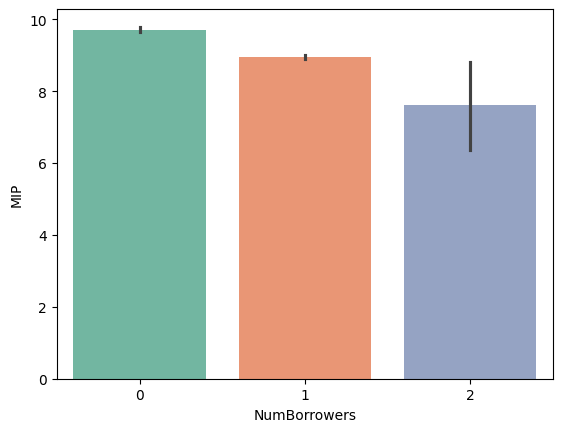

In [ ]:
sns.barplot(x=df['NumBorrowers'],y=df['MIP'],palette='Set2')

In [ ]:
# Observations:
# MIP for 1 borrower is higher than MIP for 2 borrowers, therefore it would be better if the mortgage is purchased by a mix of borrowers so that the premimum is reduced

<Axes: xlabel='EverDelinquent', ylabel='LTV'>

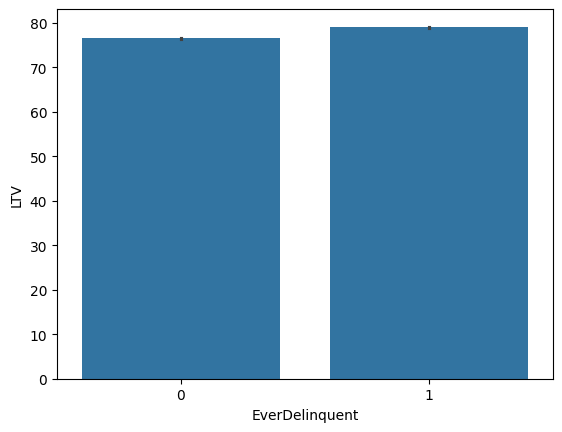

In [ ]:
sns.barplot(x=df['EverDelinquent'],y=df['LTV'])

In [ ]:
# Observations:
# LTV is higher for delinquent borrowers than non-delinquent borrowers. This means that delinquent borrowers have high financial risk and it may affect the prepayment likelihood

<Axes: xlabel='LoanPurpose', ylabel='CreditScore'>

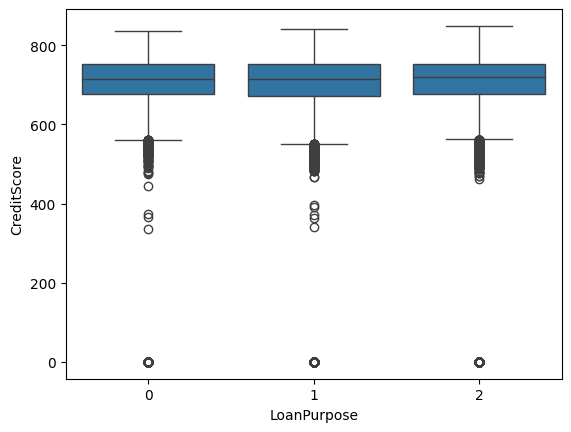

In [ ]:
sns.boxplot(x=df['LoanPurpose'],y=df['CreditScore'])

In [ ]:
# Observations:
# The median credit score is around 700 when the loan is taken for purchasing a home property
# The median credit score is less than 700 when the loan is taken for refinancing a mortgage
# The median credit score is less than 700 when the loan is taken for cash refinancing
# When loan is taken for purchasing a property then there lowest number of outliers

<Axes: xlabel='Channel', ylabel='DTI'>

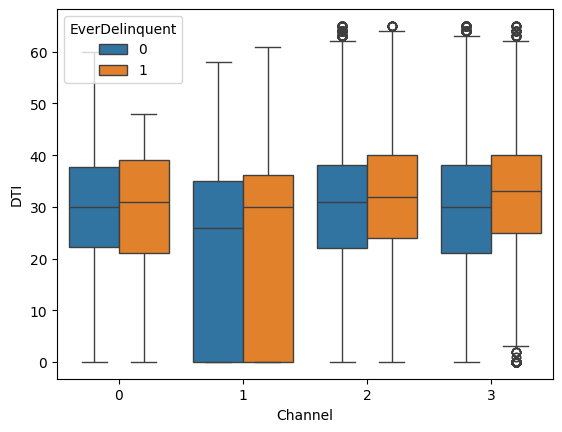

In [ ]:
sns.boxplot(x=df['Channel'],y=df['DTI'],hue=df['EverDelinquent'])

In [ ]:
# Observations:
# The median DTI ratio for Delinquent borrowers in channel T is 35 and that of non-delinquent borrowers is 30

# The median DTI ratio for Delinquent borrowers in channel R is approximately more than 30 and same is that for non-delinquent borrowers

# The median DTI ratio for delinquent borrowers in channel C is higher than that of Non-delinquent borrowers

# The median DTI ratio for delinquent borrowers in channel B is same as that of non-delinquent borrowers

# For delinquent borrowers outliers are more in channel T

# For non-delinquent borrowers outliers are more in channel R

# There are no outliers present in channel C and B

<Axes: xlabel='Occupancy', ylabel='OrigInterestRate'>

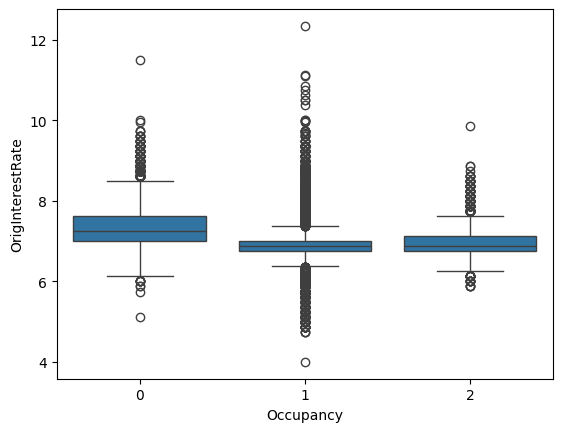

In [ ]:
sns.boxplot(x=df['Occupancy'],y=df['OrigInterestRate'])

In [ ]:
# Observations:
# The median interest rate in investment property is around 7%

# The median interest rate in second home is less than 7% i.e. approx 6.3

# The median interest rate in owner occupied is around 6.5%

<Axes: xlabel='EverDelinquent', ylabel='OCLTV'>

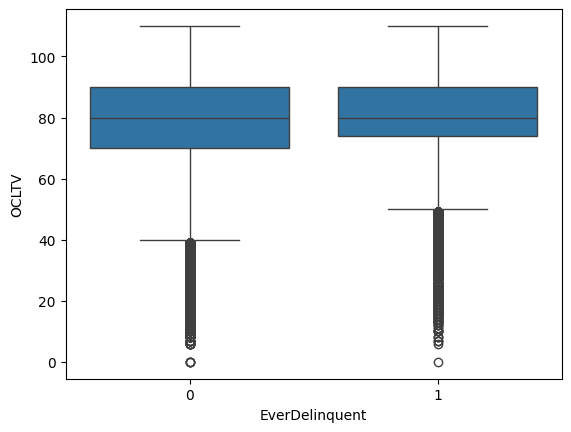

In [ ]:
sns.boxplot(x=df['EverDelinquent'],y=df['OCLTV'])

<Axes: xlabel='EverDelinquent', ylabel='CreditScore'>

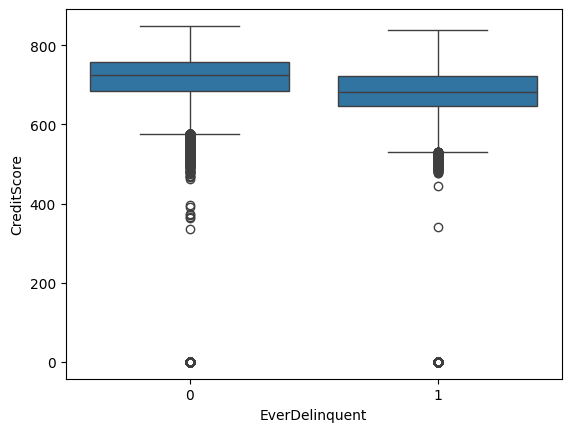

In [ ]:
sns.boxplot(x=df['EverDelinquent'],y=df['CreditScore'])

In [ ]:
# Observations:
# The median creditscore for non-delinquent borrowers is around 760 points

# The median creditscore for delinquent borrowers is around 640 points

# There are more outliers in non-delinquency than in delinquency

<Axes: xlabel='EverDelinquent', ylabel='OrigUPB'>

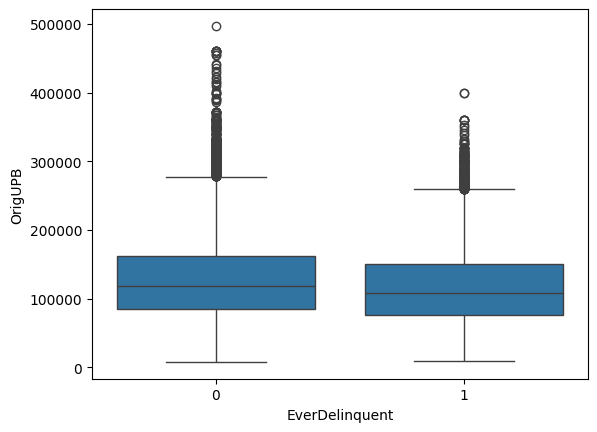

In [ ]:
sns.boxplot(x=df['EverDelinquent'],y=df['OrigUPB'])

In [ ]:
# Observations:
# The median OrigUPB for non-delinquent borrowers is 1,10,000

# The median OrigUPB for delinquent borrowers is less than 1,10,000

<Axes: xlabel='PPM', ylabel='OrigInterestRate'>

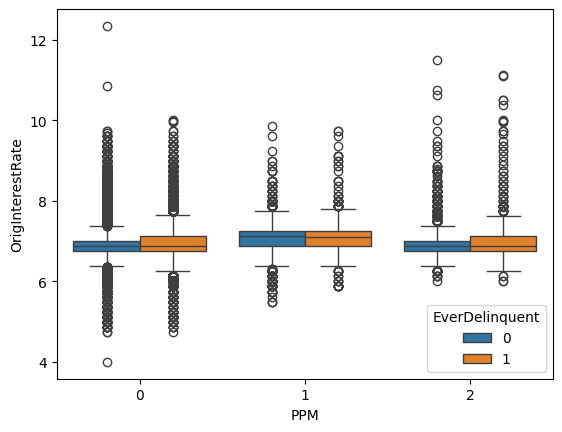

In [ ]:
sns.boxplot(x=df['PPM'],y=df['OrigInterestRate'],hue=df['EverDelinquent'])

In [ ]:
# Observations:
# The median interest rate for non-delinquent borrowers when there is no penalty is equal to that of when there is penalty

# The median interest rate for delinquent borrowers when there is no penalty is equal to that of when there is penalty

<ipython-input-141-064e09cfc7d5>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[df['EverDelinquent']==0]['DTI'],hist=False)
<ipython-input-141-064e09cfc7d5>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[df['EverDelinquent']==1]['DTI'],hist=False)


<Axes: xlabel='DTI', ylabel='Density'>

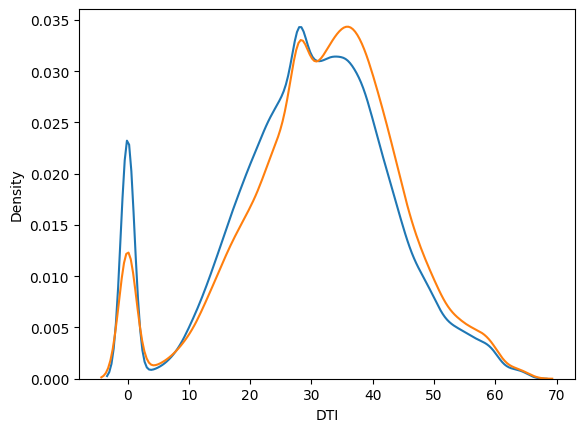

In [ ]:
sns.distplot(df[df['EverDelinquent']==0]['DTI'],hist=False)
sns.distplot(df[df['EverDelinquent']==1]['DTI'],hist=False)

In [ ]:
# Observations:
# When DTI is between 0-10, probability of delinquency rates are higher, this implies that prepayment risk is low

# When DTI is between 10-30, probability of delinquency rates are lower, this implies that prepayment risk is high

# When DTI is between 30-70, probability of delinquency rates are higher, this implies that prepayment risk is low

<ipython-input-143-8f6b018bfbeb>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[df['EverDelinquent']==0]['LTV'],hist=False)
<ipython-input-143-8f6b018bfbeb>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[df['EverDelinquent']==1]['LTV'],hist=False)


<Axes: xlabel='LTV', ylabel='Density'>

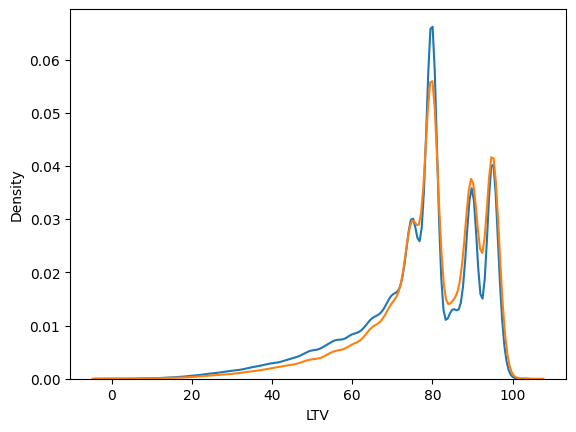

In [ ]:
sns.distplot(df[df['EverDelinquent']==0]['LTV'],hist=False)
sns.distplot(df[df['EverDelinquent']==1]['LTV'],hist=False)

In [ ]:
# Observations:
# When LTV is between 0-80, probability for non-delinquent rates are high

# When LTV is between 80-100, probability for delinquent rates are high

<ipython-input-145-20c041caf800>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[df['EverDelinquent']==0]['MIP'],hist=False)
<ipython-input-145-20c041caf800>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[df['EverDelinquent']==1]['MIP'],hist=False)


<Axes: xlabel='MIP', ylabel='Density'>

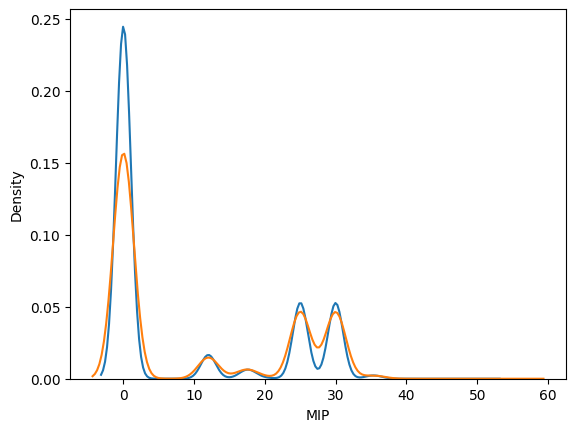

In [ ]:
sns.distplot(df[df['EverDelinquent']==0]['MIP'],hist=False)
sns.distplot(df[df['EverDelinquent']==1]['MIP'],hist=False)

In [ ]:
# Observations:
# When MIP is between 0-10 and 10-20, probability for delinquent rates are high

# When MIP is 20-30, probability for non-delinquent rates are high

<ipython-input-147-9487213745b0>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[df['EverDelinquent']==0]['OrigInterestRate'],hist=False)
<ipython-input-147-9487213745b0>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[df['EverDelinquent']==1]['OrigInterestRate'],hist=F

<Axes: xlabel='OrigInterestRate', ylabel='Density'>

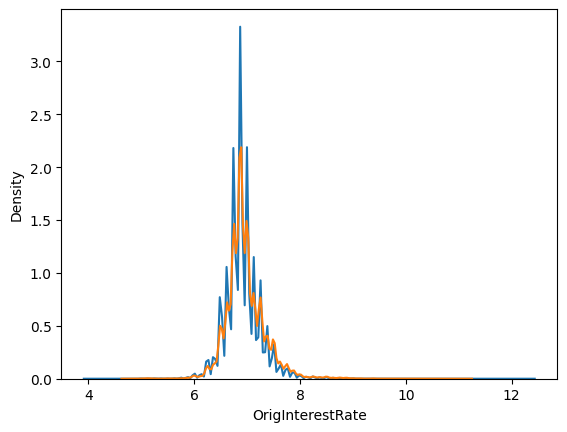

In [ ]:
sns.distplot(df[df['EverDelinquent']==0]['OrigInterestRate'],hist=False)
sns.distplot(df[df['EverDelinquent']==1]['OrigInterestRate'],hist=False)

In [ ]:
# Observations:
# When interest rates are between 6%-8%, probability for non-delinquent rates are high

<ipython-input-149-2cea90e3dca3>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[df['EverDelinquent']==0]['CreditScore'],hist=False)
<ipython-input-149-2cea90e3dca3>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[df['EverDelinquent']==1]['CreditScore'],hist=False)


<Axes: xlabel='CreditScore', ylabel='Density'>

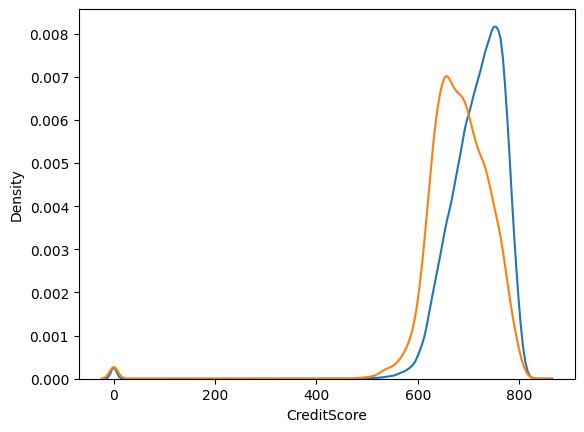

In [ ]:

sns.distplot(df[df['EverDelinquent']==0]['CreditScore'],hist=False)
sns.distplot(df[df['EverDelinquent']==1]['CreditScore'],hist=False)

In [ ]:
# Observations:
# When credit score is between 400-700 points, probability for delinquent rates are high

# When credit score is between 700-800 points, probability for non-delinquent rates are high

In [ ]:

pd.crosstab(df['EverDelinquent'],df['LoanPurpose'])

LoanPurpose,0,1,2
EverDelinquent,,,
0,45710,88008,100070
1,12301,22028,23334


In [ ]:
# Observations:
# The delinquency rates are lowest in cash refinancing and highest in purchasing a property

In [ ]:
pd.crosstab(df['EverDelinquent'],df['Occupancy'])

Occupancy,0,1,2
EverDelinquent,,,
0,6714,221756,5318
1,2020,54375,1268


In [ ]:
# Observations:
# Delinquency rates are lowest in Second home and highest in Owner Occupied

<Axes: xlabel='Channel', ylabel='EverDelinquent'>

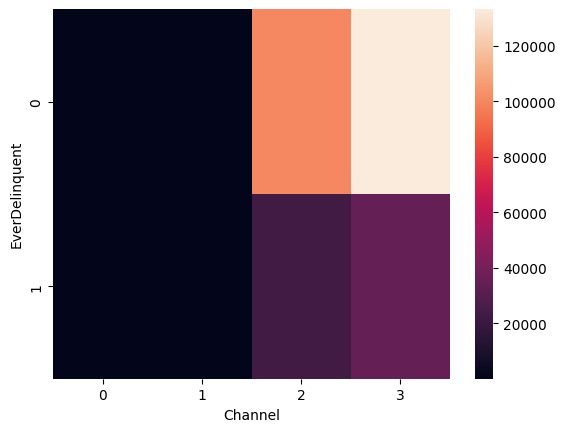

In [ ]:
sns.heatmap(pd.crosstab(df['EverDelinquent'],df['Channel']))

In [ ]:
# Observations:
# The delinquency rates are low in channel B and C, moderately high in channel R and highest in channel T

In [ ]:
pd.crosstab(df['EverDelinquent'],df['PPM'])

PPM,0,1,2
EverDelinquent,,,
0,226091,4389,3308
1,56034,1016,613


In [ ]:
# Observations:
# When there is no penalty the number of non-delinquent borrowers are more than the delinquent ones

# When there is penalty the number of non-delinquent borrowers are more than the delinquent ones

In [ ]:
pd.crosstab(df['EverDelinquent'],df['NumBorrowers'])

NumBorrowers,0,1,2
EverDelinquent,,,
0,79235,154264,289
1,24542,33071,50


In [ ]:
# Observations:
# Number of non-delinquent borrowers are more when there are 2 borrowers Number of delinquent borrowers are also more when there are 2 borrowers

Text(0.5, 0, 'Percentage of delinquent borrowers')

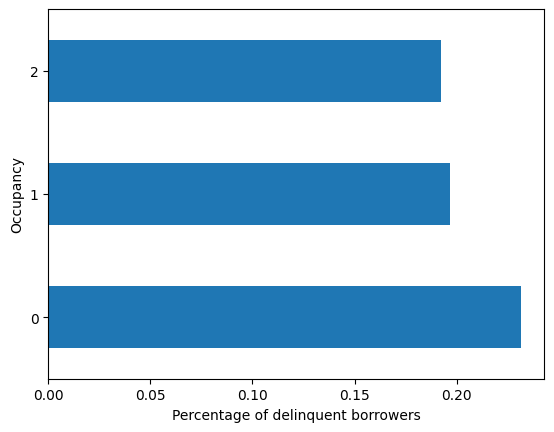

In [ ]:
df.groupby('Occupancy')['EverDelinquent'].mean().plot(kind='barh')
plt.xlabel('Percentage of delinquent borrowers')

In [ ]:
# Observations:
# On an average the percentage of delinquent borrowers is the highest in Investment property followed by Owner occupied and lowest in Second home

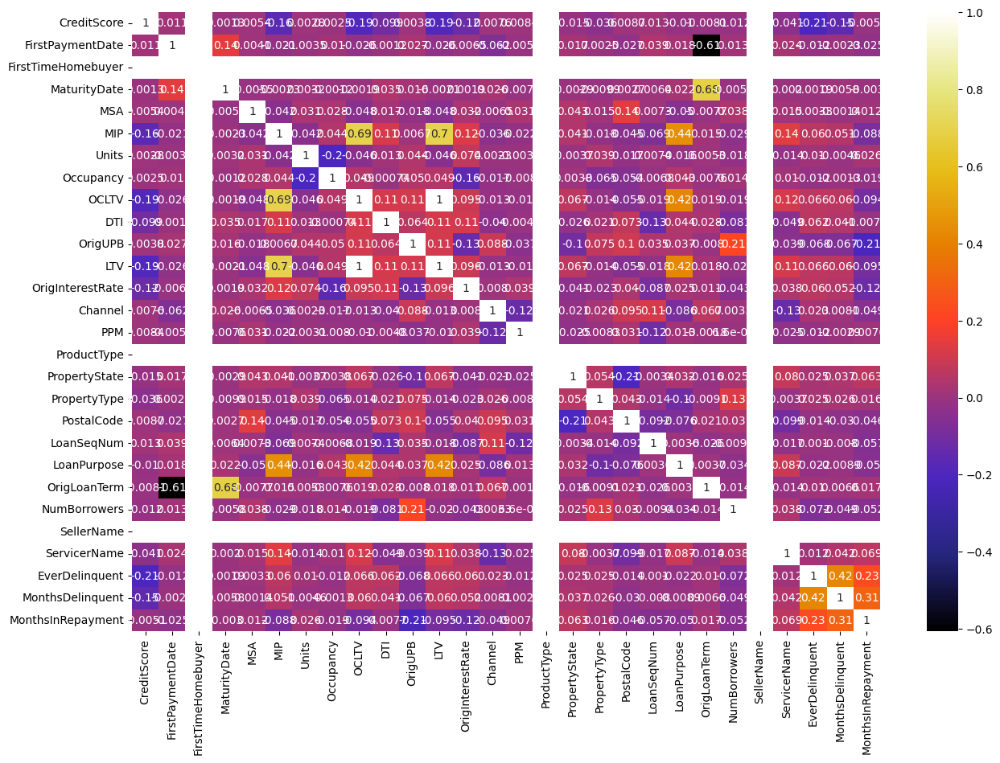

In [ ]:
plt.figure(figsize=(15,10))
corr=df.corr()
sns.heatmap(corr,annot=True,cmap=plt.cm.CMRmap)
plt.show()

In [ ]:
# numeric=df.select_dtypes(include=['number'])
# numeric.head()

In [ ]:
df['FirstTimeHomebuyer']=df['FirstTimeHomebuyer'].astype('category')


In [ ]:
numeric=df.select_dtypes(include=['number'])
numeric.head()

,CreditScore,FirstPaymentDate,MaturityDate,MSA,MIP,Units,Occupancy,OCLTV,DTI,OrigUPB,...,PostalCode,LoanSeqNum,LoanPurpose,OrigLoanTerm,NumBorrowers,SellerName,ServicerName,EverDelinquent,MonthsDelinquent,MonthsInRepayment
0,0,199902,202901,68,25,1,1,89,27,117000,...,552,177680,2,360,1,0,17,0,0,52
1,0,199902,202901,95,0,1,1,73,17,109000,...,728,7145,1,360,0,0,3,0,0,144
2,0,199902,202901,198,0,1,1,75,16,88000,...,602,176597,1,360,1,0,17,0,0,67
3,0,199902,202901,210,0,1,1,76,14,160000,...,807,116959,1,360,1,0,10,0,0,35
4,0,199902,202901,250,0,1,1,78,18,109000,...,68,117300,1,360,1,0,10,0,0,54


In [ ]:
numeric.corr()

,CreditScore,FirstPaymentDate,MaturityDate,MSA,MIP,Units,Occupancy,OCLTV,DTI,OrigUPB,...,PostalCode,LoanSeqNum,LoanPurpose,OrigLoanTerm,NumBorrowers,SellerName,ServicerName,EverDelinquent,MonthsDelinquent,MonthsInRepayment
CreditScore,1.000000,0.011249,0.001346,0.005351,-0.164376,0.002808,0.002497,-0.190848,-0.098740,0.003770,...,0.008677,0.012672,-0.010079,-0.008075,-0.012390,NaN,-0.040554,-0.207204,-0.150266,-0.005127
FirstPaymentDate,0.011249,1.000000,0.142768,0.004095,-0.020830,-0.003539,0.009973,-0.025962,-0.001190,0.027332,...,-0.027188,0.038850,0.018071,-0.605893,0.013302,NaN,0.024243,-0.011898,-0.002257,-0.025434
MaturityDate,0.001346,0.142768,1.000000,-0.005490,-0.002338,0.003166,-0.001197,-0.001901,0.035039,0.015623,...,0.002661,0.006431,0.021782,0.682230,-0.005756,NaN,0.001967,0.001860,0.005761,-0.002989
MSA,0.005351,0.004095,-0.005490,1.000000,-0.042276,0.031436,0.027730,-0.048362,0.017170,-0.017823,...,0.138141,0.007304,-0.049519,-0.007729,0.037634,NaN,0.015388,0.003286,-0.001417,0.011718
MIP,-0.164376,-0.020830,-0.002338,-0.042276,1.000000,-0.042111,0.044397,0.694789,0.111603,0.006729,...,-0.045489,-0.069452,0.444857,0.014834,-0.029354,NaN,0.139727,0.059993,0.051204,-0.087802
Units,0.002808,-0.003539,0.003166,0.031436,-0.042111,1.000000,-0.204041,-0.046133,0.012887,0.043827,...,-0.016705,0.007369,-0.015747,0.005348,-0.017588,NaN,-0.013562,0.010163,-0.004573,0.025594
Occupancy,0.002497,0.009973,-0.001197,0.027730,0.044397,-0.204041,1.000000,0.049278,-0.000737,0.049724,...,-0.054153,-0.006819,0.043213,-0.007625,0.014187,NaN,0.010371,-0.012291,-0.001255,-0.018539
OCLTV,-0.190848,-0.025962,-0.001901,-0.048362,0.694789,-0.046133,0.049278,1.000000,0.114853,0.106273,...,-0.054791,-0.018769,0.419111,0.018560,-0.019495,NaN,0.115277,0.065528,0.059811,-0.094299
DTI,-0.098740,-0.001190,0.035039,0.017170,0.111603,0.012887,-0.000737,0.114853,1.000000,0.063640,...,0.072756,-0.129809,0.044237,0.028005,-0.081022,NaN,-0.048772,0.062109,0.040830,-0.007732
OrigUPB,0.003770,0.027332,0.015623,-0.017823,0.006729,0.043827,0.049724,0.106273,0.063640,1.000000,...,0.101370,0.035053,0.036861,-0.008008,0.210654,NaN,-0.038626,-0.067605,-0.067243,-0.211698


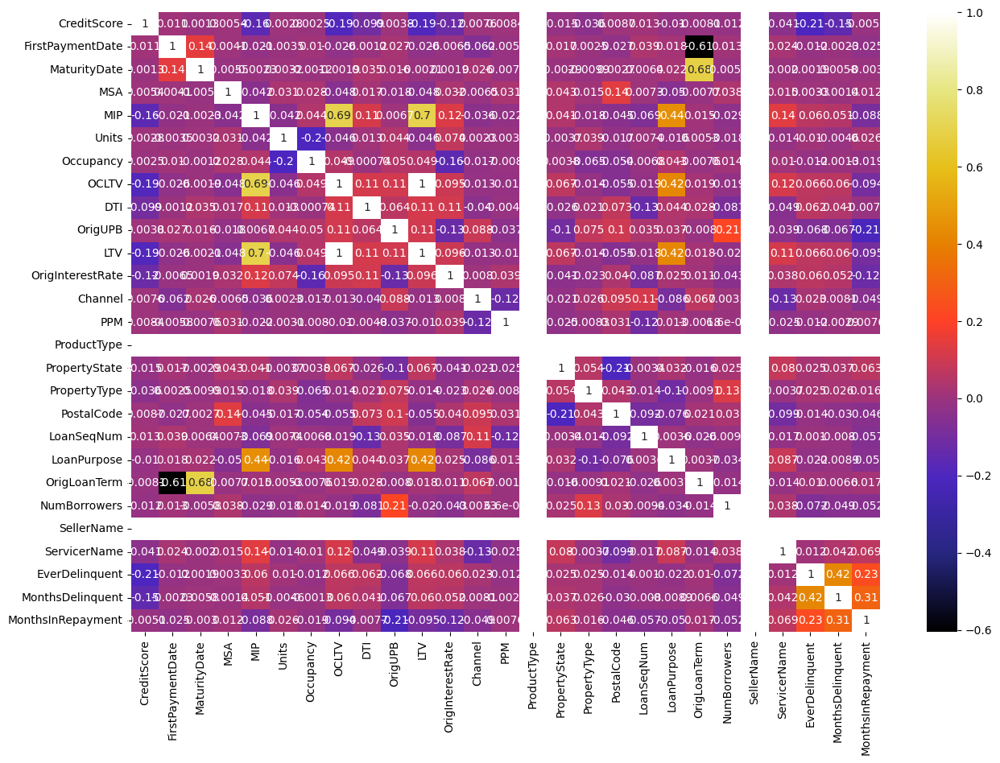

In [ ]:
plt.figure(figsize=(15,10))
corr=numeric.corr()
sns.heatmap(corr,annot=True,cmap=plt.cm.CMRmap)
plt.show()

In [ ]:

# Observations:
# There is very high correlation between MIP and LTV
# There is very high correlation between OrigLoanterm and maturity date
# There is very high correlation between OCLTV and MIP
# Highest correlated features with EverDelinquent are MonthsDelinquent and MonthsRepayment
# Correlation is moderately high between MonthsRepayment and MonthsDelinquent

In [ ]:
## Function for removing outliers with 85th percentile and 5th percentile
def remove_outliers(df,variable):

    upper_limit=df[variable].quantile(0.85)
    lower_limit=df[variable].quantile(0.15)
    df[variable]=np.where(df[variable]<=upper_limit,upper_limit,
                         np.where(df[variable]>=lower_limit,lower_limit,
                                 df[variable])) ## We want values lower than upper limit and larger than lower limit

In [ ]:
variables=['CreditScore','FirstPaymentDate','MaturityDate','LTV','OCLTV','OrigUPB','OrigInterestRate','OrigLoanTerm',
          'MonthsDelinquent','MonthsInRepayment']

for variable in variables:
    remove_outliers(df,variable) ## Loop to remove outliers for the variables in the list

In [ ]:
## Function to plot distribution after removing outliers
def distribution_plot(df,variable):
    plt.figure(figsize=(8,6))

    plt.subplot(1,2,1)
    df.boxplot(column=variable)
    plt.title('Boxplot after handling outliers')

    plt.subplot(1,2,2)
    sns.distplot(df[variable])
    plt.title('Distribution after handling outliers')

    plt.show()

<ipython-input-172-0461439a111a>:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


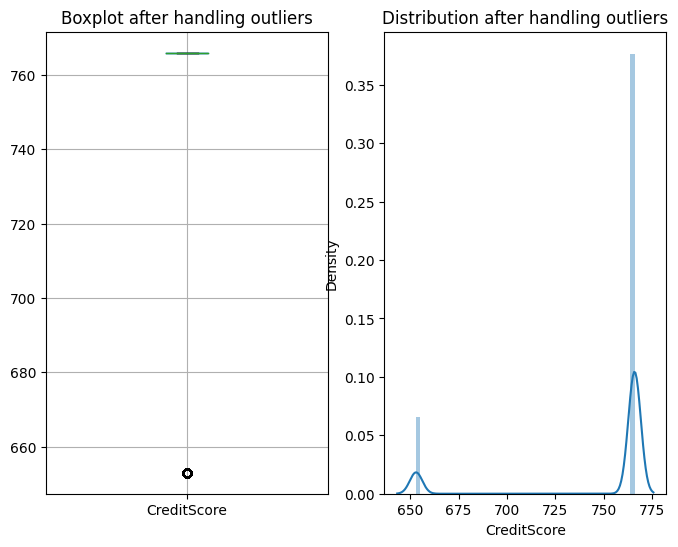

<ipython-input-172-0461439a111a>:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


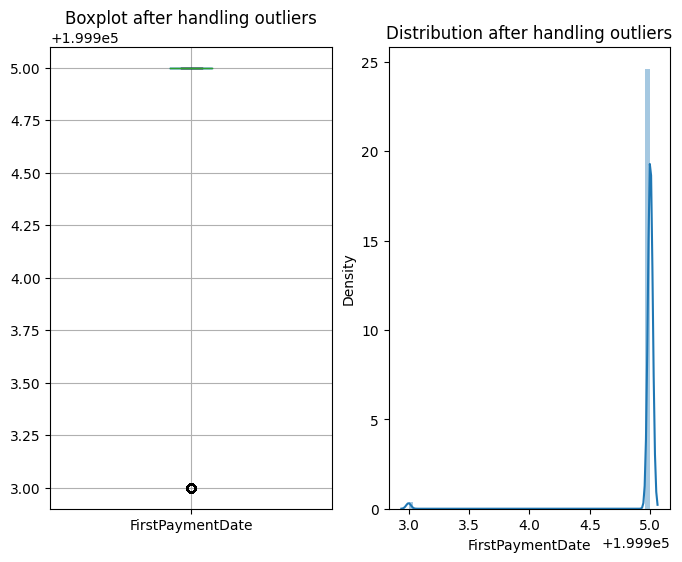

<ipython-input-172-0461439a111a>:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


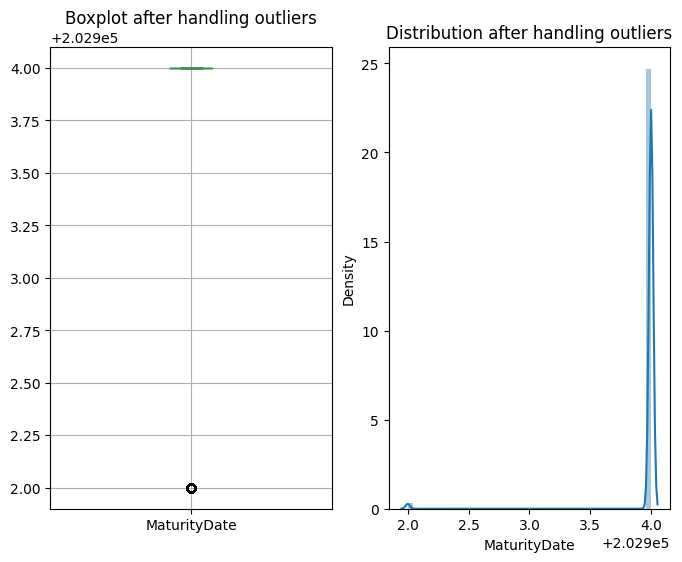

<ipython-input-172-0461439a111a>:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


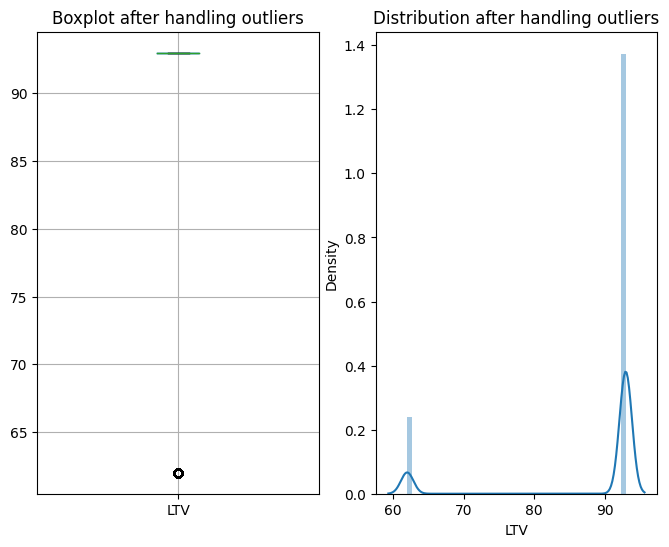

<ipython-input-172-0461439a111a>:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


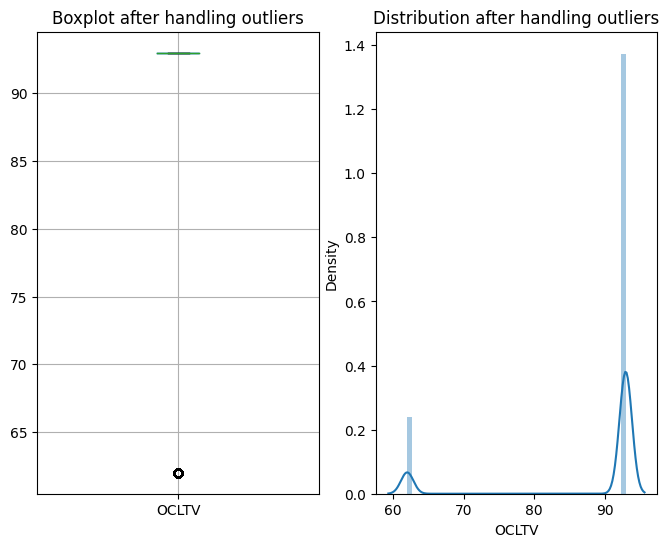

<ipython-input-172-0461439a111a>:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


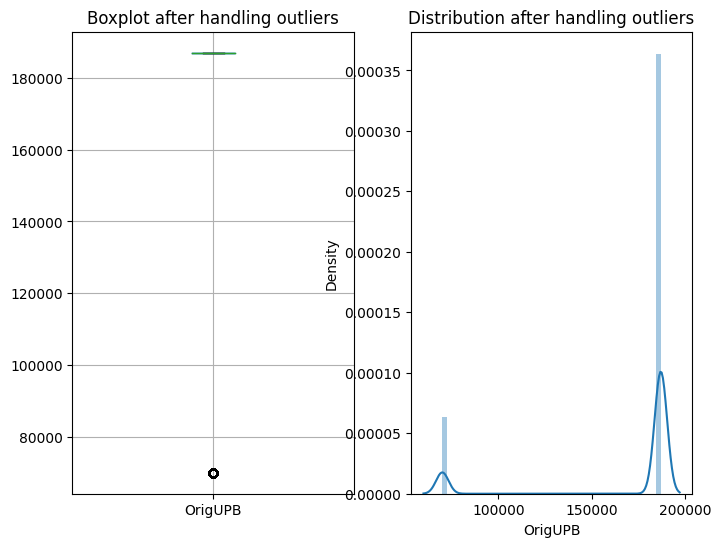

<ipython-input-172-0461439a111a>:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


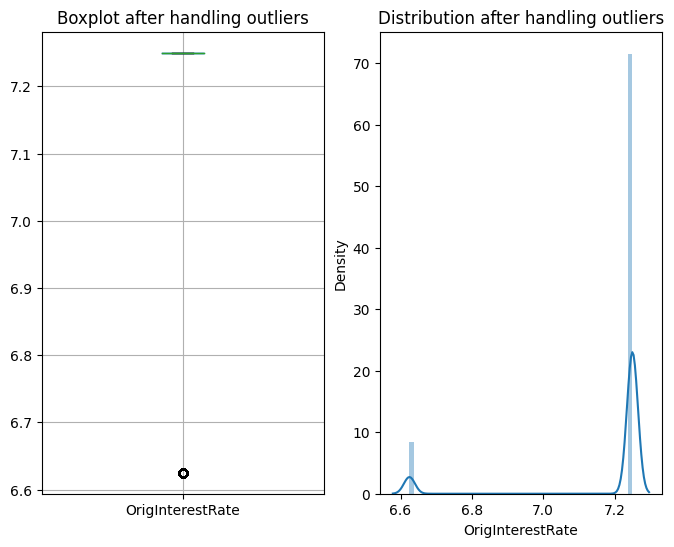

<ipython-input-172-0461439a111a>:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])
/usr/local/lib/python3.10/dist-packages/seaborn/distributions.py:2496: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)


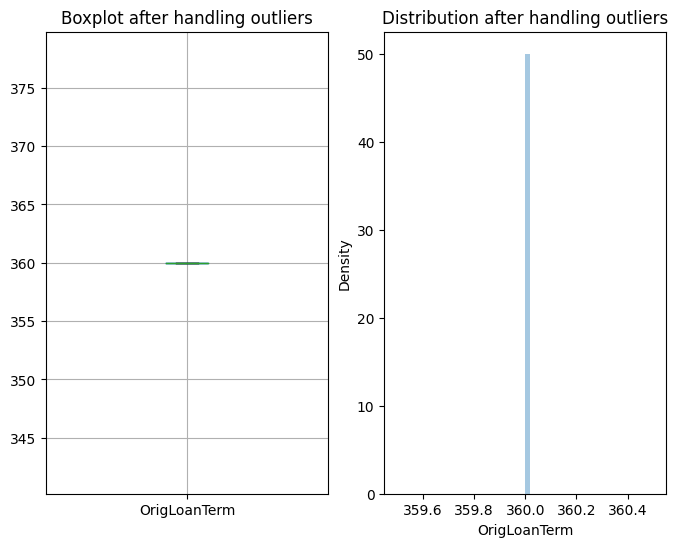

<ipython-input-172-0461439a111a>:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


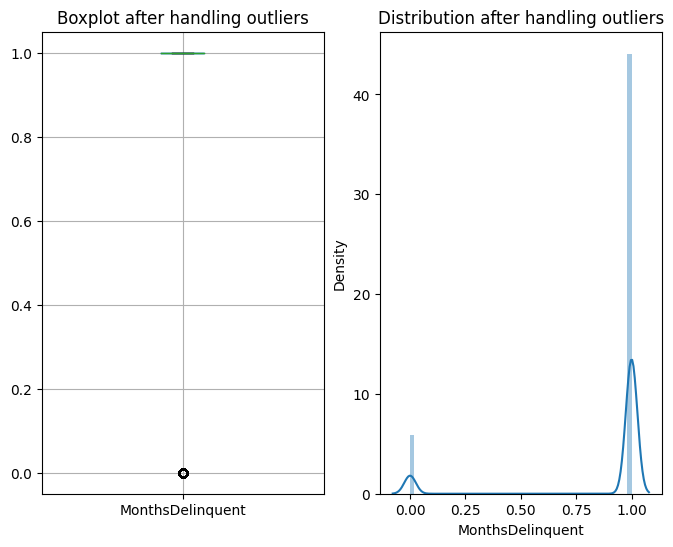

<ipython-input-172-0461439a111a>:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable])


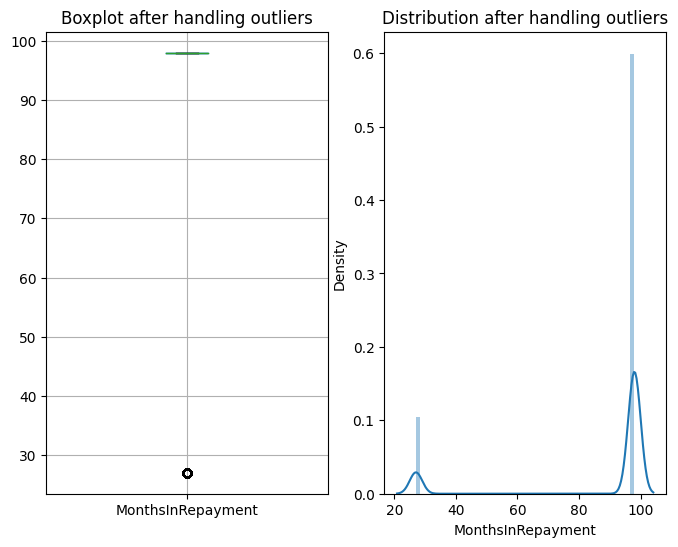

In [ ]:
variables=['CreditScore','FirstPaymentDate','MaturityDate','LTV','OCLTV','OrigUPB','OrigInterestRate','OrigLoanTerm',
          'MonthsDelinquent','MonthsInRepayment']

for variable in variables:
    distribution_plot(df,variable)

In [ ]:
# Observations:
# We can see that after capping outliers, the original distribution of the variables is preserved.

# In some variables the outliers are removed while in other the outliers are capped to store relevant information

In [ ]:
# Categorical Encoding
for var in ['Occupancy','Channel','PPM','LoanPurpose','NumBorrowers','FirstTimeHomebuyer']:
    ordinal_mapping={k:i for i,k in enumerate(df[var].unique(),0)} ## Assigning labels starting from 0
    df[var]=df[var].map(ordinal_mapping) ## Encoding the variables with the labels assigned through the loop written above

In [ ]:
for var in ['PostalCode','ServicerName','MSA']:
    frequency_map=(df[var].value_counts()/len(df)).to_dict() ## Calculating the frequency of the variables and convert them into
    ## a dictionary
    df[var]=df[var].map(frequency_map) ## Encoding with the frequency of the variables through loop

In [ ]:
for variable in ['PropertyState','PropertyType']:
    count_map=df[variable].value_counts().to_dict() ## Calculating the number of observations present in each feature
    df[variable]=df[variable].map(count_map) ## Encoding the variables with the count of their observations

In [ ]:

df.drop(['SellerName','ProductType','LoanSeqNum'],axis=1,inplace=True) ## Dropping the irrelevant features
df.head()

,CreditScore,FirstPaymentDate,FirstTimeHomebuyer,MaturityDate,MSA,MIP,Units,Occupancy,OCLTV,DTI,...,PropertyState,PropertyType,PostalCode,LoanPurpose,OrigLoanTerm,NumBorrowers,ServicerName,EverDelinquent,MonthsDelinquent,MonthsInRepayment
0,766.0,199905.0,0,202904.0,0.030094,25,1,0,93.0,27,...,13621,244923,0.005919,0,360.0,0,0.077632,0,1.0,98.0
1,766.0,199905.0,0,202904.0,0.018991,0,1,0,93.0,17,...,10127,244923,0.006622,1,360.0,1,0.018525,0,1.0,27.0
2,766.0,199905.0,0,202904.0,0.000261,0,1,0,93.0,16,...,2321,244923,0.001571,1,360.0,0,0.077632,0,1.0,98.0
3,766.0,199905.0,0,202904.0,0.032040,0,1,0,93.0,14,...,43327,244923,0.002570,1,360.0,0,0.039664,0,1.0,98.0
4,766.0,199905.0,0,202904.0,0.014253,0,1,0,93.0,18,...,7457,244923,0.001342,1,360.0,0,0.039664,0,1.0,98.0


In [ ]:
for var in ['CreditScore','FirstPaymentDate','MaturityDate','LTV','OCLTV','OrigUPB','OrigLoanTerm','MonthsInRepayment']:
    df[var]=df[var].round(1).astype(int) ## rounding off the values to 1 decimal point to simplify the process

In [ ]:

df['FirstPaymentDate']=df['FirstPaymentDate'].astype(str) ## converting the feature into string
df['FirstPaymentDate']=pd.to_datetime(df['FirstPaymentDate'],format="%Y%m") ## converting to appropriate date-time format
## using year and month

In [ ]:
df['MaturityDate']=df['MaturityDate'].astype(str)
df['MaturityDate']=pd.to_datetime(df['MaturityDate'],format="%Y%m")

In [ ]:

df.head()

,CreditScore,FirstPaymentDate,FirstTimeHomebuyer,MaturityDate,MSA,MIP,Units,Occupancy,OCLTV,DTI,...,PostalCode,LoanSeqNum,LoanPurpose,OrigLoanTerm,NumBorrowers,SellerName,ServicerName,EverDelinquent,MonthsDelinquent,MonthsInRepayment
0,766,1999-05-01,0,2029-04-01,0.030094,25,1,0,93,27,...,0.005919,177680,0,360,0,0,0.077632,0,1.0,98
1,766,1999-05-01,0,2029-04-01,0.018991,0,1,0,93,17,...,0.006622,7145,1,360,1,0,0.018525,0,1.0,27
2,766,1999-05-01,0,2029-04-01,0.000261,0,1,0,93,16,...,0.001571,176597,1,360,0,0,0.077632,0,1.0,98
3,766,1999-05-01,0,2029-04-01,0.032040,0,1,0,93,14,...,0.002570,116959,1,360,0,0,0.039664,0,1.0,98
4,766,1999-05-01,0,2029-04-01,0.014253,0,1,0,93,18,...,0.001342,117300,1,360,0,0,0.039664,0,1.0,98


In [ ]:
df['FirstPaymentYear']=df['FirstPaymentDate'].dt.year ## extracting year from firstpaymentdate
df['FirstPaymentMonth']=df['FirstPaymentDate'].dt.month ## extracting month from firstpaymentdate
df['MaturityYear']=df['MaturityDate'].dt.year ## extracting year from maturitydate
df['MaturityMonth']=df['MaturityDate'].dt.month ## extracting month from maturitydate
df.head()

,CreditScore,FirstPaymentDate,FirstTimeHomebuyer,MaturityDate,MSA,MIP,Units,Occupancy,OCLTV,DTI,...,NumBorrowers,SellerName,ServicerName,EverDelinquent,MonthsDelinquent,MonthsInRepayment,FirstPaymentYear,FirstPaymentMonth,MaturityYear,MaturityMonth
0,766,1999-05-01,0,2029-04-01,0.030094,25,1,0,93,27,...,0,0,0.077632,0,1.0,98,1999,5,2029,4
1,766,1999-05-01,0,2029-04-01,0.018991,0,1,0,93,17,...,1,0,0.018525,0,1.0,27,1999,5,2029,4
2,766,1999-05-01,0,2029-04-01,0.000261,0,1,0,93,16,...,0,0,0.077632,0,1.0,98,1999,5,2029,4
3,766,1999-05-01,0,2029-04-01,0.032040,0,1,0,93,14,...,0,0,0.039664,0,1.0,98,1999,5,2029,4
4,766,1999-05-01,0,2029-04-01,0.014253,0,1,0,93,18,...,0,0,0.039664,0,1.0,98,1999,5,2029,4


In [ ]:
df.drop(['FirstPaymentDate','MaturityDate'],axis=1,inplace=True) ## dropping the firstpaymentdate and maturitydate

In [ ]:
# Feature Transformation
## Function is to check the normality of the variables
import scipy.stats as stats
def transformation_plot(df,variable):
    plt.figure(figsize=(6,6)) ## figure size= 6,6

    plt.subplot(1,2,1) ## 1  row, 2 columns and 1st chart
    df[variable].hist(bins=30)
    plt.title('Histogram of {}'.format(variable))

    plt.subplot(1,2,2) ## 1 row, 2 columns and 2nd chart
    stats.probplot(df[variable],dist='norm',plot=plt) ## distribution is normal and plotting is matplotlib
    plt.title('Q-Q Plot of {}'.format(variable))

    plt.show() ## Function to plot the histogram and q-q plot after handling outliers

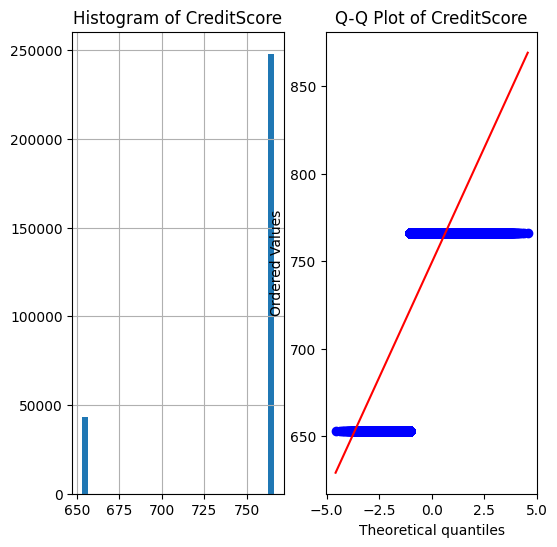

In [ ]:
transformation_plot(df,'CreditScore')

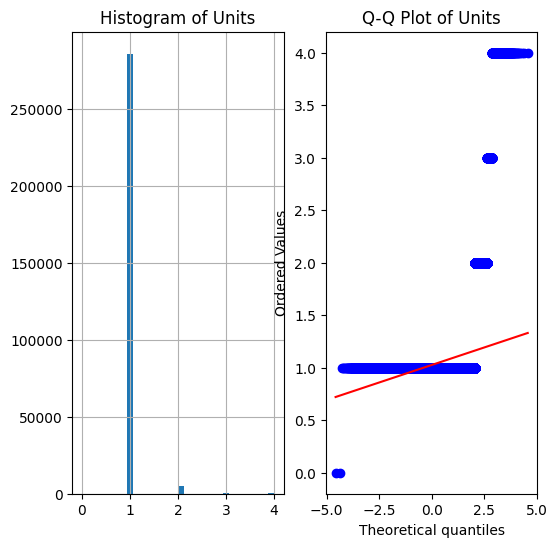

In [ ]:
transformation_plot(df,'Units')

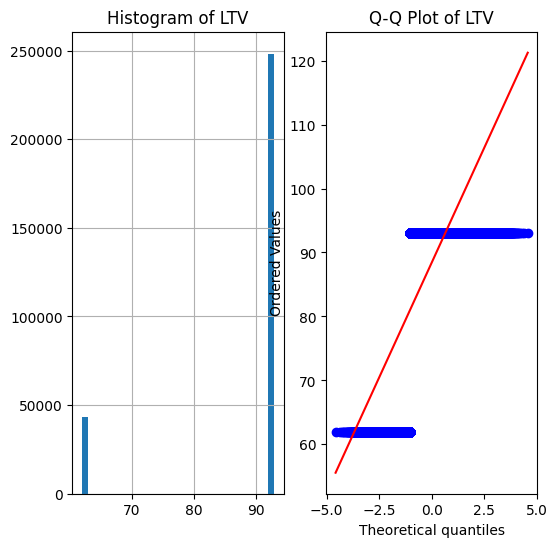

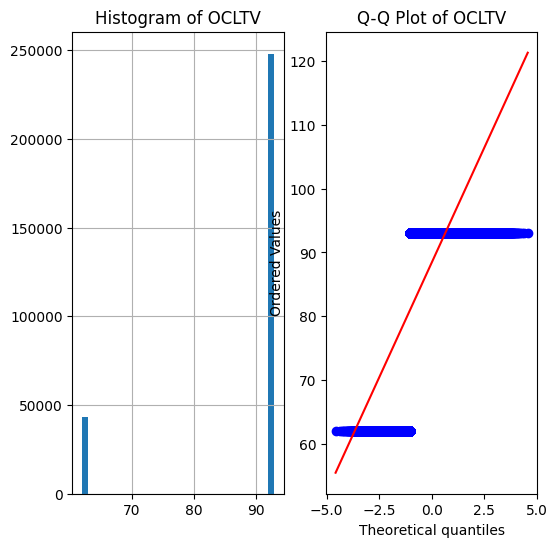

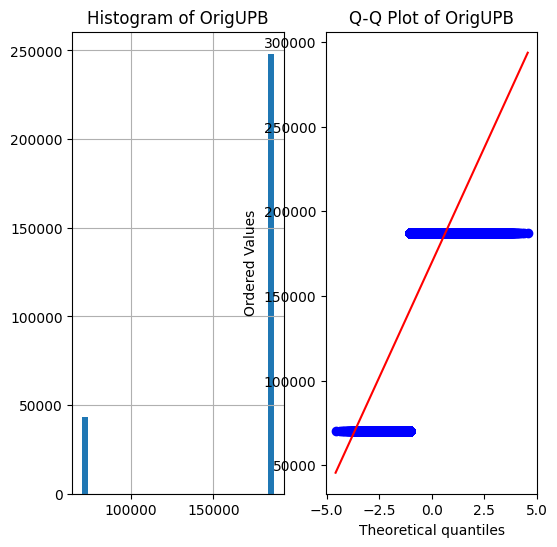

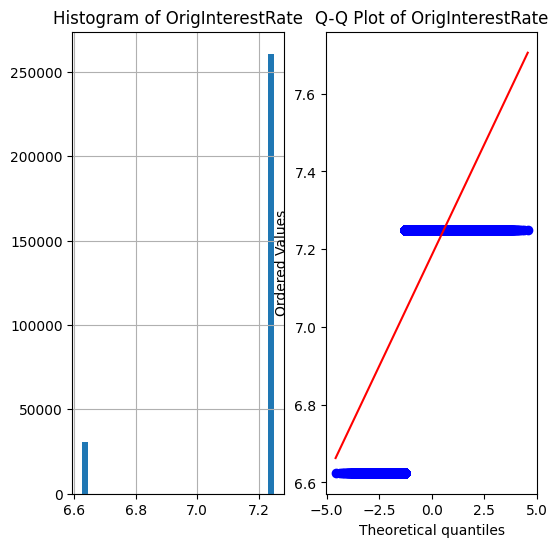

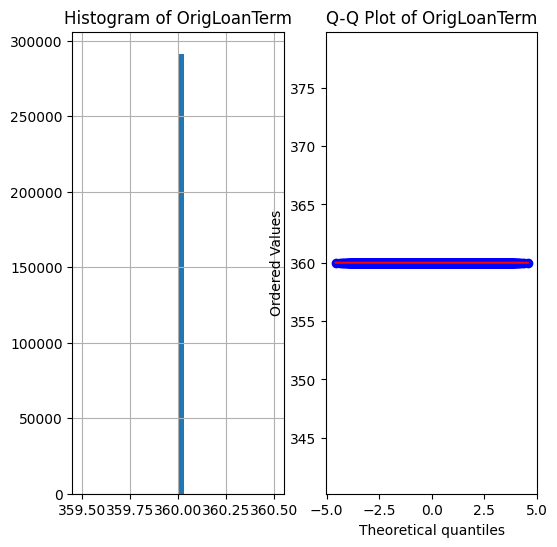

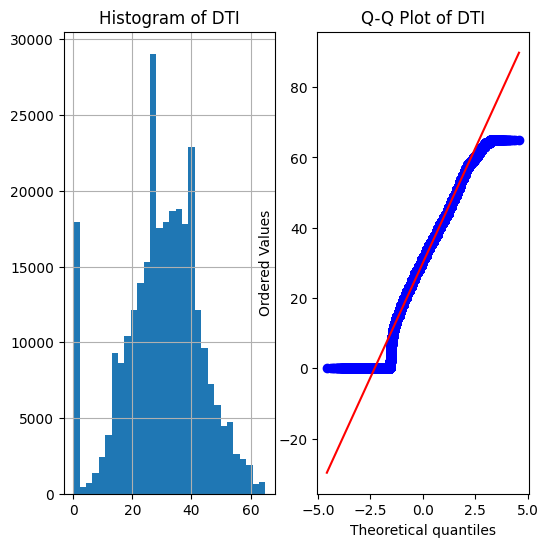

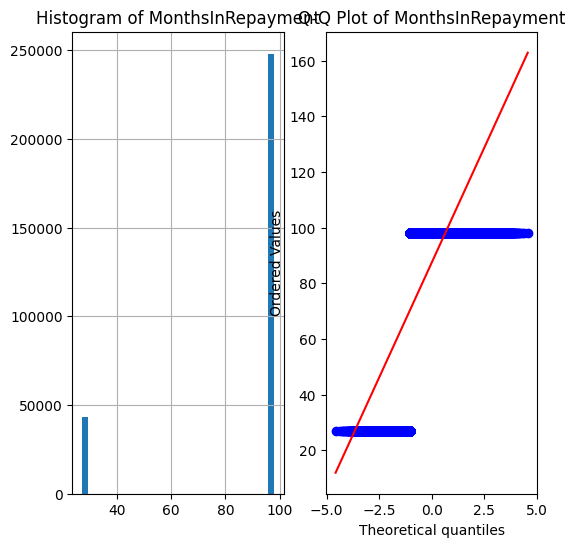

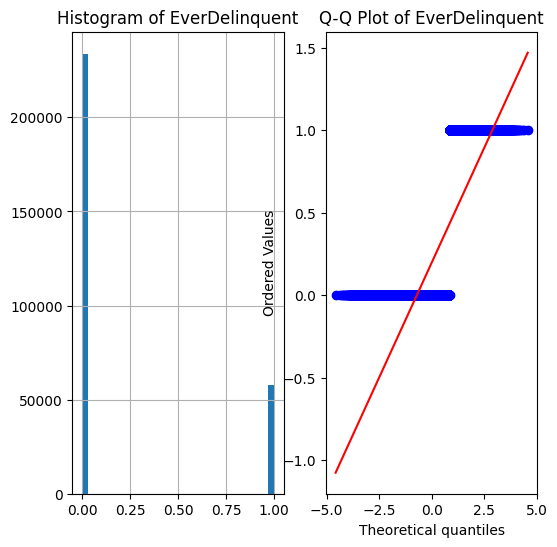

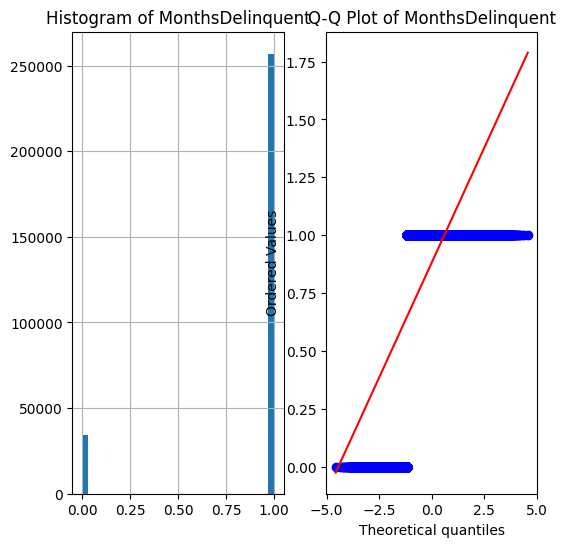

In [ ]:
for variable in ['LTV','OCLTV','OrigUPB','OrigInterestRate','OrigLoanTerm','DTI','MonthsInRepayment','EverDelinquent',
           'MonthsDelinquent']:
    transformation_plot(df,variable)

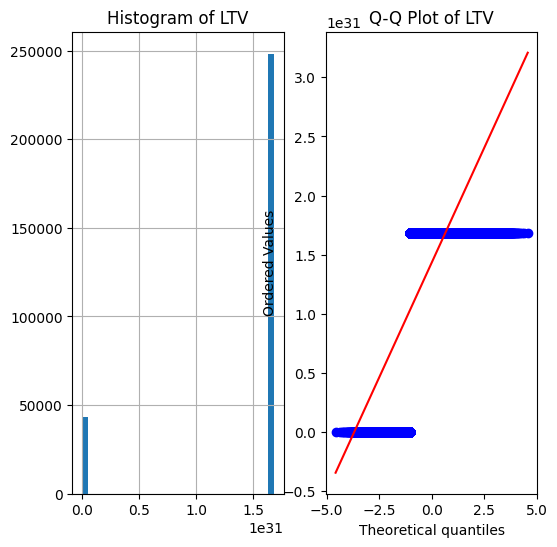

In [ ]:
df['LTV'],param=stats.boxcox(df['LTV']) ## box-cox transformation with the parameter
transformation_plot(df,'LTV')

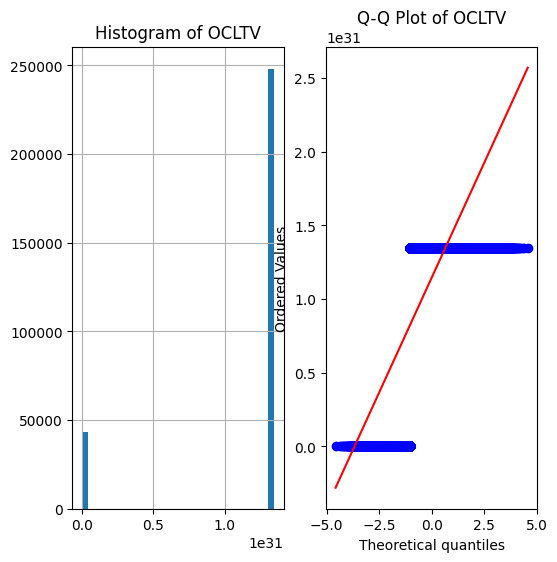

In [ ]:
df['OCLTV'],param=stats.boxcox(df['OCLTV'])
transformation_plot(df,'OCLTV')

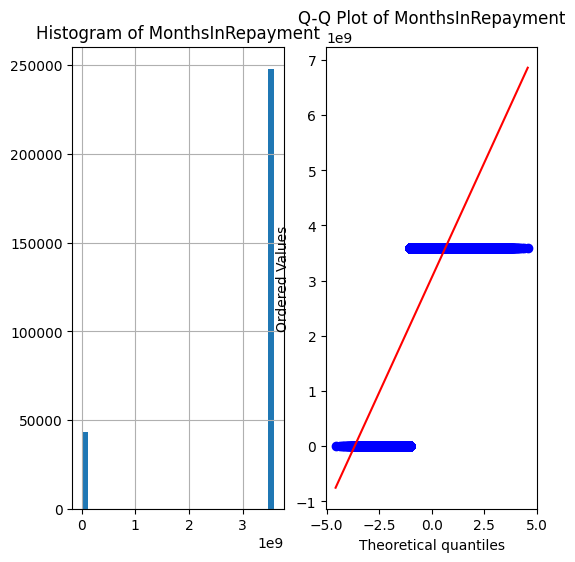

In [ ]:
df['MonthsInRepayment'],param=stats.boxcox(df['MonthsInRepayment'])
transformation_plot(df,'MonthsInRepayment')

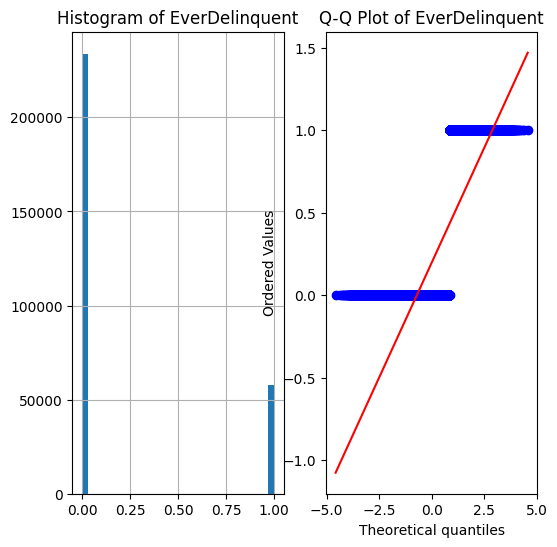

In [ ]:
df['EverDelinquent']=np.sqrt(df['EverDelinquent'])
transformation_plot(df,'EverDelinquent')

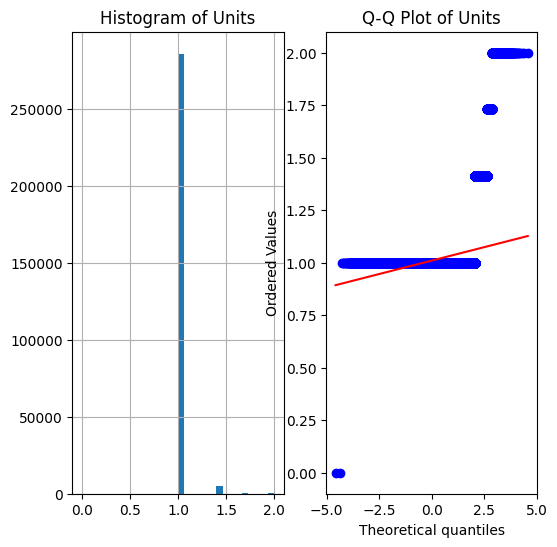

In [ ]:
df['Units']=np.sqrt(df['Units'])
transformation_plot(df,'Units')

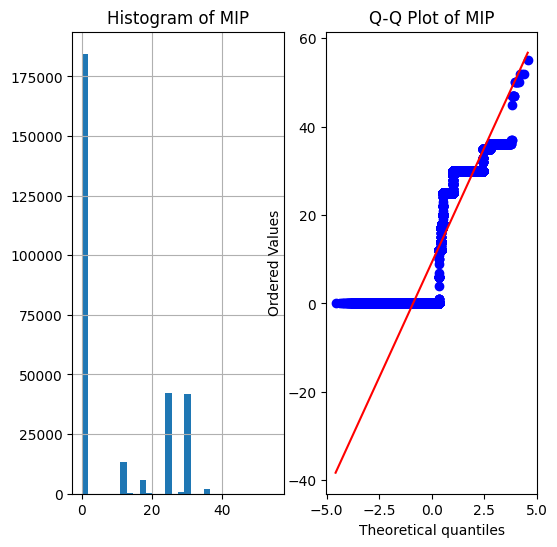

In [ ]:
transformation_plot(df,'MIP')

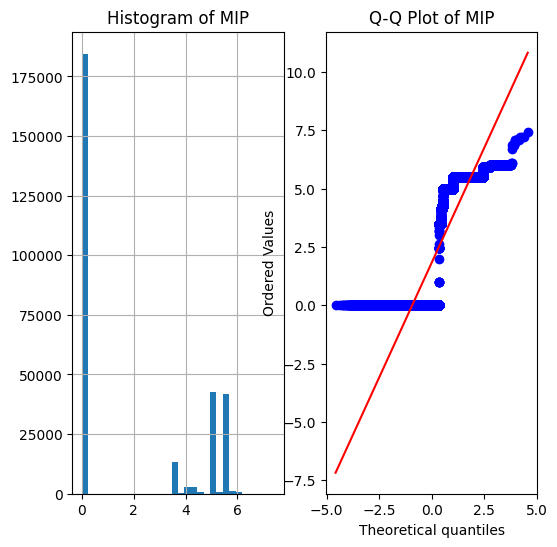

In [ ]:
df['MIP']=np.sqrt(df['MIP'])
transformation_plot(df,'MIP')

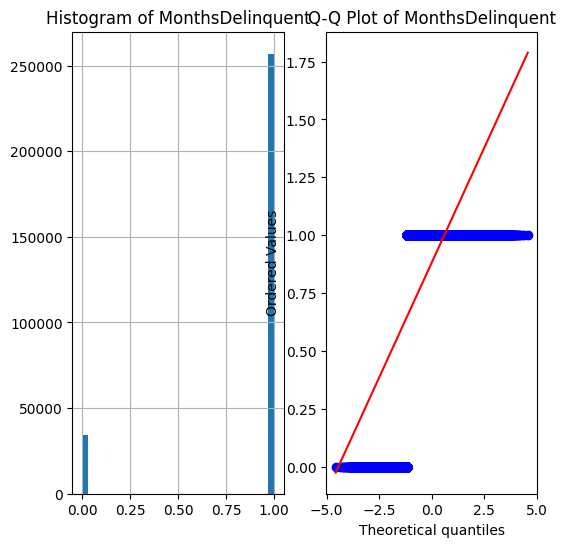

In [ ]:
transformation_plot(df,'MonthsDelinquent')

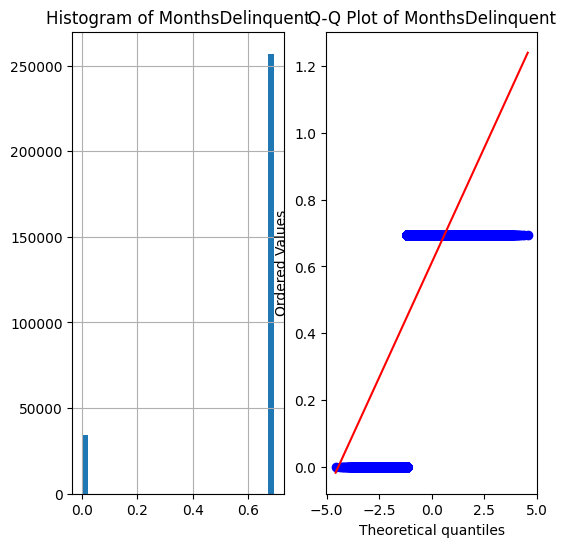

In [ ]:
df['MonthsDelinquent']=np.log(df['MonthsDelinquent']+1)
transformation_plot(df,'MonthsDelinquent')

In [ ]:
# Observations:
# We have transformed some variables into normal distribution using various techniques such as box-cox transformation, square root trnasformation and logarithmic transformation. We can see that the after transformation the distribution is distributed around mean

In [ ]:
# Feature Scaling
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

X=df.drop('EverDelinquent',axis=1) ## independent variables
y=df['EverDelinquent'] ## dependent variable

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=0) ## 20% data is for test and 80% goes to
## training
X_train.shape,X_test.shape

((233160, 29), (58291, 29))

In [ ]:
scaler=StandardScaler() ## object for standardscaler
X_train=scaler.fit_transform(X_train) ## fitting the standardscaler object in train set
X_test=scaler.transform(X_test) ## fitting the scaler object in test set

In [ ]:
# Feature Selection
# Principal Component Analysis to find the optimum number of components that explain maximum amount of variance in the data

In [ ]:
from sklearn.decomposition import PCA
pca=PCA(n_components=10) ## top 10 features that has most of the information
## fitting our data into the dimensional space
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)
pca.explained_variance_
## Eigenvalues( Information explained by each eigenvalue in the original dataset)

array([2.93960435, 1.91967297, 1.63642044, 1.36535707, 1.27476024,
       1.25349694, 1.20682241, 1.02388745, 1.00722311, 0.96726199])

In [ ]:
pca.components_
## Eigenvectors

array([[ 1.03558714e-01, -5.55111512e-17, -1.35459668e-02,
         4.78982897e-01, -4.36184999e-02, -4.36895771e-02,
        -5.41690287e-01,  9.19819569e-02,  5.28906675e-02,
        -5.41665657e-01, -6.99527184e-02,  5.11229730e-02,
         5.27271848e-03,  0.00000000e+00, -8.26226897e-02,
        -5.68368611e-02, -4.85535712e-02, -4.74923424e-02,
        -3.53829248e-01,  0.00000000e+00,  4.24903438e-02,
         0.00000000e+00, -3.32816875e-03, -4.68370035e-02,
         6.33686025e-02,  0.00000000e+00,  3.49164503e-02,
         0.00000000e+00,  3.35147496e-02],
       [ 7.09879145e-05, -1.11022302e-16,  7.44400564e-02,
         8.82634792e-03,  1.29064570e-02,  2.13995237e-02,
        -8.10483227e-03,  3.63867689e-02,  9.30532423e-03,
        -8.18216404e-03, -1.30950644e-01,  1.04035714e-01,
         2.35594662e-02, -0.00000000e+00, -3.01431955e-02,
         1.63110788e-02, -7.80359833e-02,  3.73668732e-03,
        -3.70939550e-02, -0.00000000e+00, -2.00735140e-02,
        -0.00

In [ ]:
pca.explained_variance_ratio_ ## percentage of information explained by each component in the data

array([0.12780834, 0.08346368, 0.07114841, 0.0593631 , 0.05542412,
       0.05449963, 0.05247031, 0.04451665, 0.04379212, 0.04205469])

In [ ]:
## Visualize PCA in 2-d
pca=PCA(n_components=2) ## top 2 features that have maximum information
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

In [ ]:
pca.explained_variance_

array([2.93960431, 1.91967058])

In [ ]:
pca.components_

array([[ 1.03574079e-01, -1.94391943e-20, -1.35611410e-02,
         4.78993765e-01, -4.35910948e-02, -4.36861416e-02,
        -5.41682189e-01,  9.19942119e-02,  5.29219357e-02,
        -5.41657565e-01, -6.99441284e-02,  5.11370821e-02,
         5.23563182e-03, -0.00000000e+00, -8.26393814e-02,
        -5.68466021e-02, -4.85457771e-02, -4.75044439e-02,
        -3.53818483e-01, -0.00000000e+00,  4.25097279e-02,
        -0.00000000e+00, -3.32240229e-03, -4.68189159e-02,
         6.34021751e-02, -0.00000000e+00,  3.49166662e-02,
        -0.00000000e+00,  3.35144993e-02],
       [ 1.80973117e-04, -7.50387970e-19,  7.39742562e-02,
         8.88938425e-03,  1.33443197e-02,  2.13419759e-02,
        -7.98086529e-03,  3.67353968e-02,  9.48149641e-03,
        -8.05804809e-03, -1.31003990e-01,  1.04003442e-01,
         2.31391962e-02,  0.00000000e+00, -3.05246112e-02,
         1.60624792e-02, -7.81067564e-02,  3.62807750e-03,
        -3.71116178e-02,  0.00000000e+00, -1.99211898e-02,
         0.00

In [ ]:
# plt.figure(figsize=(8,6))
# sns.scatterplot(X_train_trf[:,0],X_train_trf[:,1],hue=y_train)
# plt.xlabel('First Component')
# plt.ylabel('Second Component')

In [ ]:
## Finding the optimum number of components
pca=PCA(n_components=None) ## Principal components equal to the number of variables in the data
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)
pca.explained_variance_.shape

(29,)

In [ ]:
pca.components_.shape ## 27 vectors in 27 dimensional space

(29, 29)

In [ ]:
pca.explained_variance_ratio_

array([1.27808336e-01, 8.34636855e-02, 7.11484656e-02, 5.93635376e-02,
       5.54245248e-02, 5.45001254e-02, 5.24708282e-02, 4.45170661e-02,
       4.37941191e-02, 4.20549605e-02, 4.02181846e-02, 3.95464384e-02,
       3.80300540e-02, 3.76553628e-02, 3.55766887e-02, 3.30092011e-02,
       3.19407350e-02, 3.12274371e-02, 2.79949001e-02, 2.74733054e-02,
       1.76994860e-02, 5.00750746e-03, 7.50501146e-05, 7.73421671e-34,
       7.73421671e-34, 7.73421671e-34, 7.73421671e-34, 7.73421671e-34,
       7.73421668e-34])

In [ ]:
np.cumsum(pca.explained_variance_ratio_) ## cumulative percentages of eigenvectors

array([0.12780834, 0.21127202, 0.28242049, 0.34178403, 0.39720855,
       0.45170868, 0.5041795 , 0.54869657, 0.59249069, 0.63454565,
       0.67476383, 0.71431027, 0.75234033, 0.78999569, 0.82557238,
       0.85858158, 0.89052231, 0.92174975, 0.94974465, 0.97721796,
       0.99491744, 0.99992495, 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        ])

Text(0, 0.5, '% of variance explained')

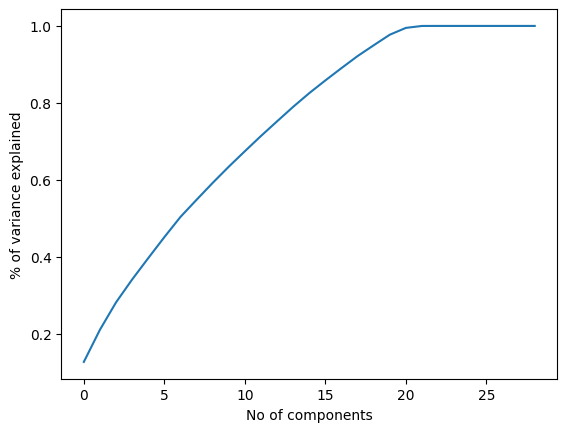

In [ ]:
plt.plot(np.cumsum(pca.explained_variance_ratio_)) ## plotting the cumulative distribution function
plt.xlabel('No of components')
plt.ylabel('% of variance explained')

In [ ]:
# SelectKBest algorithm for feature selection
from sklearn.feature_selection import SelectKBest ## Selectkbest algorithm for feature selection
from sklearn.feature_selection import f_classif ## F-score
ordered_rank_features=SelectKBest(score_func=f_classif,k=20) ## This will give the top 15 features according to their F-score
ordered_feature=ordered_rank_features.fit(X,y) ## Fitting the algorithm to the dataset. Higher the F-score, more relevant
## is the feature with the target

/usr/local/lib/python3.10/dist-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [ 1 13 19 21] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/feature_selection/_univariate_selection.py:113: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


In [ ]:
ordered_feature.scores_ ## p-values corresponding to each F-score. Lower the p-value, more relevant the feature is with the
## target

array([ 4.13482800e+03,             nan,  1.44284263e+02,  1.05276749e+03,
        3.01054659e+01,  9.28418315e+00,  3.03368776e+02,  1.12863054e+03,
        4.44657439e+02,  3.05342158e+02,  7.79444405e+02,  1.50731189e+02,
        4.41601389e+01,             nan,  4.09147347e+02,  2.65499372e+02,
        2.67434268e+02,  2.98652008e-01,  1.37182588e+02,             nan,
        1.47871719e+03,             nan,  2.74514068e+02,  3.48262088e+05,
        9.52421394e+03, -2.91449000e+05,  7.36917098e+01, -2.91449000e+05,
        3.09711886e+01])

In [ ]:
datascores=pd.DataFrame(ordered_feature.scores_) ## converting the F-scores numpy array to a dataframe
datacolumns=pd.DataFrame(X.columns) ## Converting the independent features array to a dataframe
features_rank=pd.concat([datacolumns,datascores],axis=1) ## merging the two dataframes
features_rank.columns=['Features','Scores'] ## naming the columns
features_rank

,Features,Scores
0,CreditScore,4134.828000
1,FirstTimeHomebuyer,NaN
2,MSA,144.284263
3,MIP,1052.767493
4,Units,30.105466
5,Occupancy,9.284183
6,OCLTV,303.368776
7,DTI,1128.630544
8,OrigUPB,444.657439
9,LTV,305.342158


In [ ]:
features_rank.nlargest(20,'Scores') ## We need only 20features to explain the maximum amount of variance in the data

,Features,Scores
23,MonthsDelinquent,348262.088179
24,MonthsInRepayment,9524.213938
0,CreditScore,4134.828000
20,NumBorrowers,1478.717191
7,DTI,1128.630544
3,MIP,1052.767493
10,OrigInterestRate,779.444405
8,OrigUPB,444.657439
14,PropertyState,409.147347
9,LTV,305.342158


In [ ]:
# Observations:
# We get the top 20 features which are required to explain the maximum amount of information in the data. This was achieved through principal component analysis. With this we can remove the other features which are not relevant with the target variable EverDelinquent in our further analysis

In [ ]:
# Correlation Analysis to find the best features
X=df.drop('EverDelinquent',axis=1) ## independent variables
y=df['EverDelinquent'] ## dependent variable

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=0) ## 20% data is for test and 80% goes to
## training
X_train.shape,X_test.shape

((233160, 29), (58291, 29))

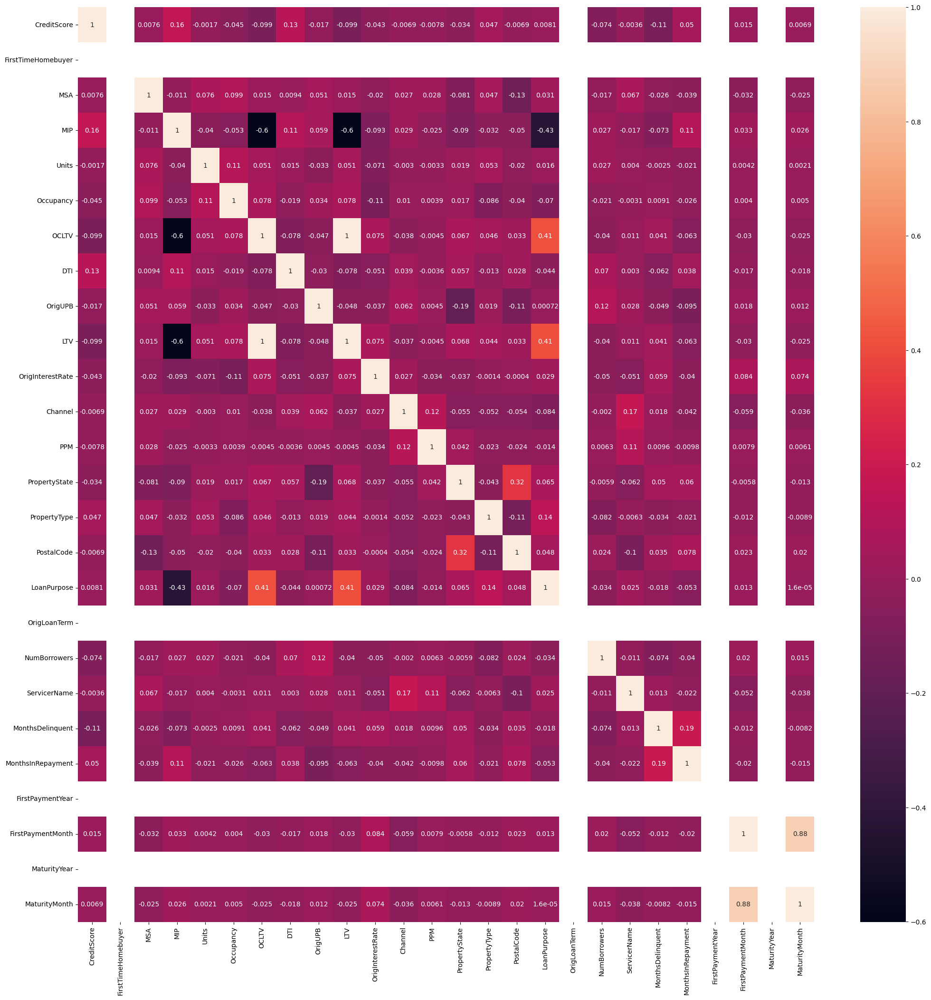

In [ ]:
plt.figure(figsize=(25,25))
cor=X_train.corr()
sns.heatmap(cor,annot=True)
plt.show()

In [ ]:
def correlation(data,threshold):
    corr_col=set()
    corr_matrix=data.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (corr_matrix.iloc[i,j])>threshold:
                colname=corr_matrix.columns[i]
                corr_col.add(colname)

    return corr_col

In [ ]:
corr_features=correlation(X_train,0.8)
len(set(corr_features))

2

In [ ]:
corr_features

{'LTV', 'MaturityMonth'}

<Axes: >

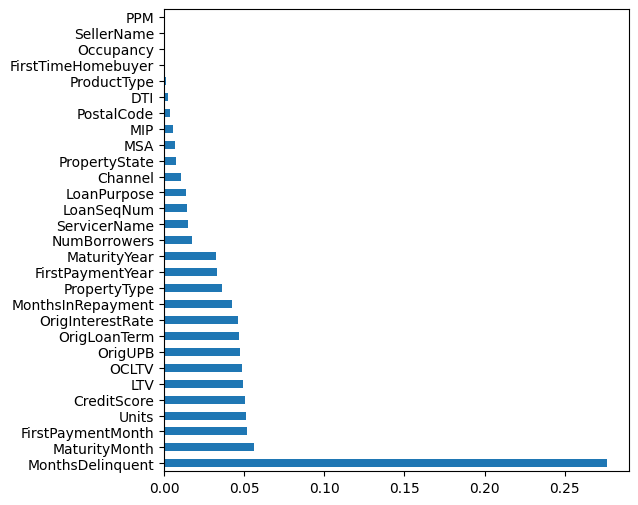

In [ ]:
# Mutual Information Gain for feature selection
from sklearn.feature_selection import mutual_info_classif
mutual_info=mutual_info_classif(X,y)
mutual_info=pd.Series(mutual_info,index=X.columns)
mutual_info.sort_values(ascending=False).plot(kind='barh',figsize=(6,6))

In [ ]:
mutual_info.sort_values(ascending=False)

,0
MonthsDelinquent,0.276241
MaturityMonth,0.056443
FirstPaymentMonth,0.052011
Units,0.051182
CreditScore,0.050250
LTV,0.049581
OCLTV,0.048445
OrigUPB,0.047513
OrigLoanTerm,0.046691
OrigInterestRate,0.046309


In [ ]:
# model building

In [ ]:
# Import necessary libraries
import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [ ]:
X=df[['MonthsDelinquent','CreditScore','MaturityMonth','FirstPaymentMonth','OrigLoanTerm','OrigInterestRate',
      'OrigUPB','Units','PropertyType','MaturityYear','FirstPaymentYear','DTI','MIP']]
y=df['EverDelinquent']

In [ ]:
# # Separate features and target
# X = df.drop('EverDelinquent', axis=1)  # Features (all columns except 'Target')
# y = df['EverDelinquent']  # Target (the 'Target' column)

In [ ]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Random Forest Classifier
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
rf_predictions = rf_model.predict(X_test)

In [ ]:
# Evaluate the Random Forest model
print("Random Forest Classifier")
print(f"Accuracy: {accuracy_score(y_test, rf_predictions)}")
print("Classification Report:")
print(classification_report(y_test, rf_predictions))
print("Confusion Matrix:")
print(confusion_matrix(y_test, rf_predictions))
print("\n")

Random Forest Classifier
Accuracy: 0.9195868978452811
Classification Report:
              precision    recall  f1-score   support

           0       0.91      1.00      0.95     70135
           1       0.98      0.60      0.75     17301

    accuracy                           0.92     87436
   macro avg       0.95      0.80      0.85     87436
weighted avg       0.93      0.92      0.91     87436

Confusion Matrix:
[[69948   187]
 [ 6844 10457]]




In [ ]:
X=df[['MonthsDelinquent','CreditScore','MaturityMonth','FirstPaymentMonth','OrigLoanTerm','OrigInterestRate',
      'OrigUPB','Units','PropertyType','MaturityYear','FirstPaymentYear','DTI','MIP']]
y=df['EverDelinquent']

In [ ]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [ ]:
# K-Nearest Neighbors Classifier
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train, y_train)
knn_predictions = knn_model.predict(X_test)

In [ ]:
# Evaluate the KNN model
print("K-Nearest Neighbors Classifier")
print(f"Accuracy: {accuracy_score(y_test, knn_predictions)}")
print("Classification Report:")
print(classification_report(y_test, knn_predictions))
print("Confusion Matrix:")
print(confusion_matrix(y_test, knn_predictions))

K-Nearest Neighbors Classifier
Accuracy: 0.9069262088842125
Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.99      0.94     70135
           1       0.92      0.58      0.71     17301

    accuracy                           0.91     87436
   macro avg       0.91      0.78      0.83     87436
weighted avg       0.91      0.91      0.90     87436

Confusion Matrix:
[[69300   835]
 [ 7303  9998]]


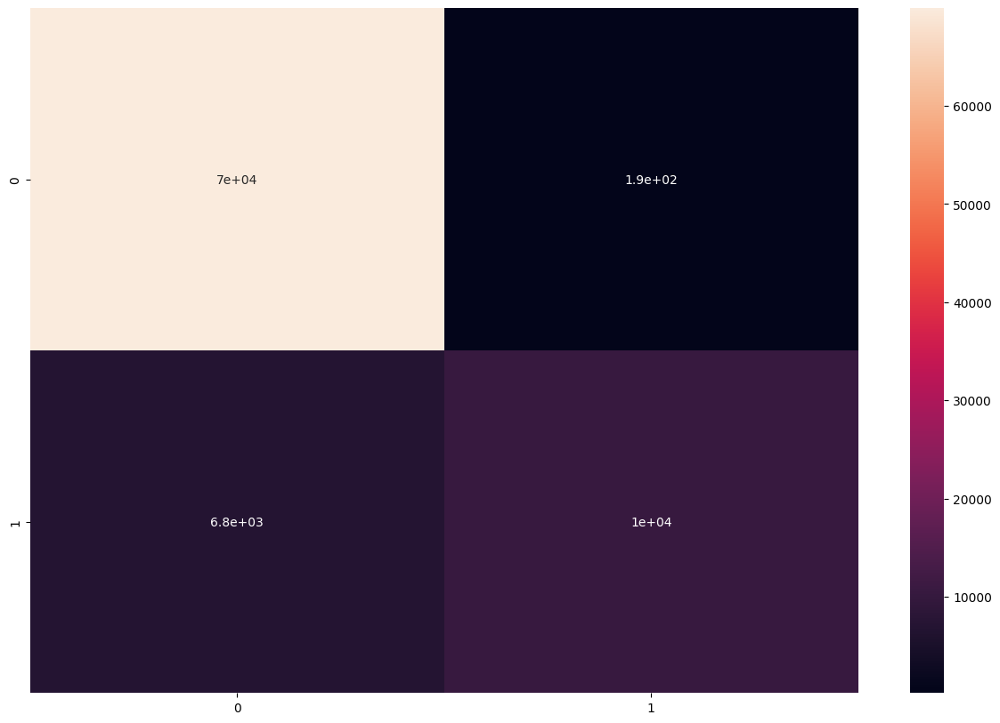

In [ ]:
plt.figure(figsize=(15,10))
sns.heatmap(confusion_matrix(y_test, rf_predictions),annot=True)
plt.show()

In [ ]:
# RF
pd.crosstab(y_test,rf_predictions)

col_0,0,1
EverDelinquent,,
0,69948,187
1,6844,10457


In [ ]:
# KNN
pd.crosstab(y_test,knn_predictions)

col_0,0,1
EverDelinquent,,
0,69300,835
1,7303,9998


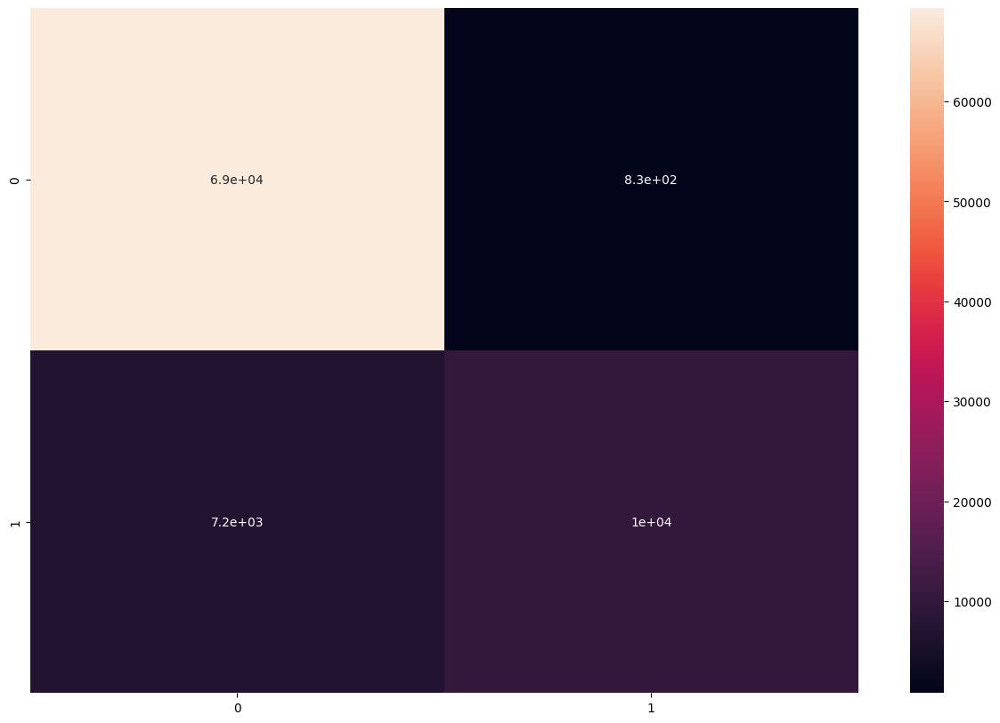

In [ ]:
plt.figure(figsize=(15,10))
sns.heatmap(confusion_matrix(y_test, knn_predictions),annot=True)
plt.show()

<Axes: xlabel='EverDelinquent'>

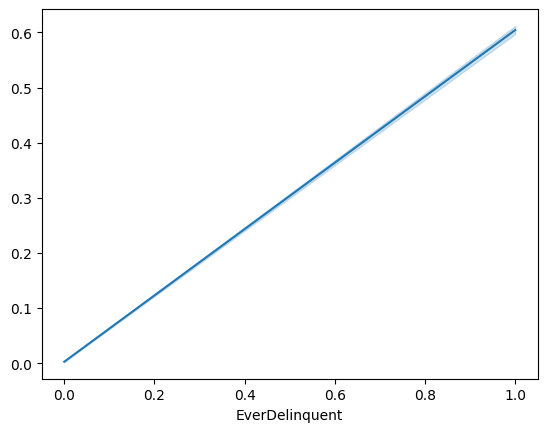

In [ ]:
sns.lineplot(x=y_test,y=rf_predictions)

<Axes: xlabel='EverDelinquent'>

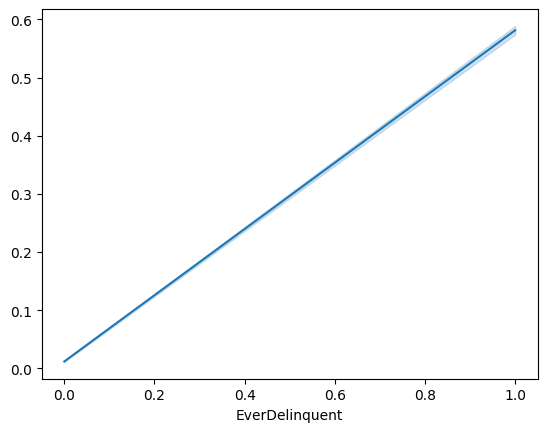

In [ ]:
sns.lineplot(x=y_test,y=knn_predictions)

In [ ]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [ ]:
X=df[['MonthsDelinquent','CreditScore','MaturityMonth','FirstPaymentMonth','OrigLoanTerm','OrigInterestRate',
      'OrigUPB','Units','PropertyType','MaturityYear','FirstPaymentYear','DTI','MIP']]
y=df['EverDelinquent']

In [ ]:
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a DMatrix for the training and test sets
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)

In [ ]:
# Define the parameters for the model
params = {
    'max_depth': 6,
    'eta': 0.3,
    'objective': 'binary:logistic',
    'eval_metric': 'logloss'
}

# Train the model
bst = xgb.train(params, dtrain, num_boost_round=10)

# Make predictions
preds = bst.predict(dtest)
predictions = [round(value) for value in preds]

# Evaluate the model
accuracy = accuracy_score(y_test, predictions)
print(f"Accuracy: {accuracy * 100:.2f}%")

Accuracy: 92.14%


In [ ]:
# Evaluate the KNN model
print("XGB")
print(f"Accuracy: {accuracy_score(y_test,predictions)}")
print("Classification Report:")
print(classification_report(y_test,predictions ))
print("Confusion Matrix:")
print(confusion_matrix(y_test,predictions ))

XGB
Accuracy: 0.9214458492734727
Classification Report:
              precision    recall  f1-score   support

           0       0.91      1.00      0.95     46767
           1       1.00      0.60      0.75     11524

    accuracy                           0.92     58291
   macro avg       0.96      0.80      0.85     58291
weighted avg       0.93      0.92      0.91     58291

Confusion Matrix:
[[46767     0]
 [ 4579  6945]]


In [ ]:
pd.crosstab(y_test, predictions)

col_0,0,1
EverDelinquent,,
0,46767,0
1,4579,6945


<Axes: xlabel='EverDelinquent'>

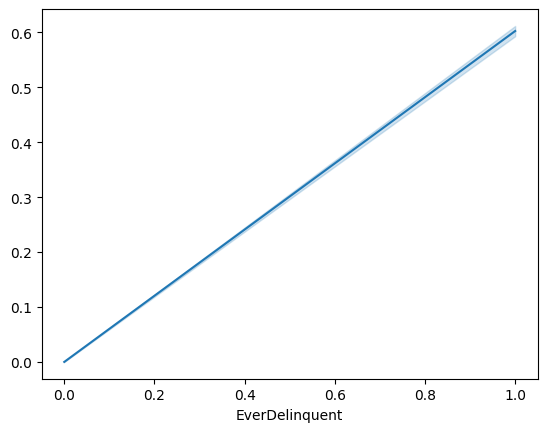

In [ ]:
sns.lineplot(x=y_test,y=predictions)

<Axes: xlabel='EverDelinquent', ylabel='Count'>

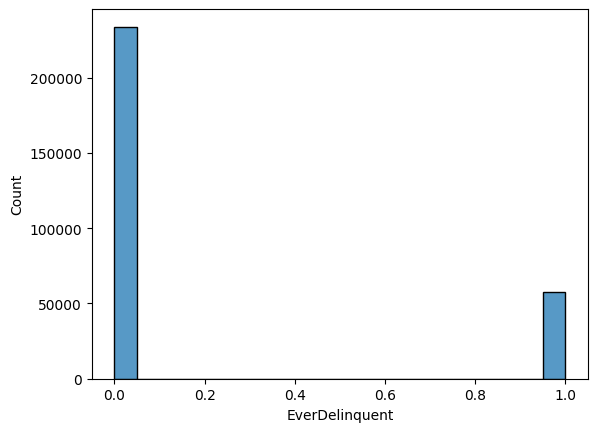

In [ ]:
sns.histplot(df['EverDelinquent'])

In [ ]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

# Assuming X and y are your features and labels
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the XGBoost model with parameters to handle overfitting
xgb_model = xgb.XGBClassifier(
    max_depth=6,          # Control the depth of the tree
    min_child_weight=1,   # Control the minimum sum of instance weight (hessian) needed in a child
    eta=0.1,              # Learning rate
    n_estimators=1000,    # Number of trees
    subsample=0.8,        # Fraction of training samples used for each tree
    colsample_bytree=0.8, # Fraction of features used for each tree
    reg_alpha=0.1,        # L1 regularization term
    reg_lambda=1.0,       # L2 regularization term
    objective='binary:logistic', # Objective function for binary classification
    eval_metric='logloss',       # Evaluation metric
    early_stopping_rounds=5    # Early stopping rounds
)

# Create a validation set from the training set
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Train the model with early stopping
xgb_model.fit(
    X_train,
    y_train,
    eval_set=[(X_val, y_val)],
    verbose=True
)

# Evaluate the model
predictions = xgb_model.predict(X_test)
print(f'Accuracy: {accuracy_score(y_test, predictions)}')
print(classification_report(y_test, predictions))


[0]	validation_0-logloss:0.45232
[1]	validation_0-logloss:0.42035
[2]	validation_0-logloss:0.39607
[3]	validation_0-logloss:0.37674
[4]	validation_0-logloss:0.36098
[5]	validation_0-logloss:0.34792
[6]	validation_0-logloss:0.33695
[7]	validation_0-logloss:0.33614
[8]	validation_0-logloss:0.32695
[9]	validation_0-logloss:0.31912
[10]	validation_0-logloss:0.31243
[11]	validation_0-logloss:0.31200
[12]	validation_0-logloss:0.31177
[13]	validation_0-logloss:0.31158
[14]	validation_0-logloss:0.30600
[15]	validation_0-logloss:0.30116
[16]	validation_0-logloss:0.29699
[17]	validation_0-logloss:0.29680
[18]	validation_0-logloss:0.29318
[19]	validation_0-logloss:0.29003
[20]	validation_0-logloss:0.28729
[21]	validation_0-logloss:0.28487
[22]	validation_0-logloss:0.28279
[23]	validation_0-logloss:0.28093
[24]	validation_0-logloss:0.28088
[25]	validation_0-logloss:0.27925
[26]	validation_0-logloss:0.27782
[27]	validation_0-logloss:0.27657
[28]	validation_0-logloss:0.27655
[29]	validation_0-loglos

In [ ]:
pd.crosstab(y_test, predictions)

col_0,0,1
EverDelinquent,,
0.0,46767,0
1.0,4579,6945


In [ ]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from imblearn.over_sampling import SMOTE

# Assuming X and y are your features and labels
# Balance the dataset
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Define the XGBoost model with parameters to handle overfitting
xgb_model = xgb.XGBClassifier(
    max_depth=6,          # Control the depth of the tree
    min_child_weight=1,   # Control the minimum sum of instance weight (hessian) needed in a child
    eta=0.1,              # Learning rate
    n_estimators=1000,    # Number of trees
    subsample=0.8,        # Fraction of training samples used for each tree
    colsample_bytree=0.8, # Fraction of features used for each tree
    reg_alpha=0.1,        # L1 regularization term
    reg_lambda=1.0,       # L2 regularization term
    objective='binary:logistic', # Objective function for binary classification
    eval_metric='logloss',       # Evaluation metric
    early_stopping_rounds=20     # Early stopping rounds
)

# Create a validation set from the training set
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Train the model with early stopping
xgb_model.fit(
    X_train,
    y_train,
    eval_set=[(X_val, y_val)],
    verbose=True
)

# Evaluate the model
predictions = xgb_model.predict(X_test)
print(f'Accuracy: {accuracy_score(y_test, predictions)}')
print(classification_report(y_test, predictions))


[0]	validation_0-logloss:0.65043
[1]	validation_0-logloss:0.61514
[2]	validation_0-logloss:0.58585
[3]	validation_0-logloss:0.56187
[4]	validation_0-logloss:0.54091
[5]	validation_0-logloss:0.52323
[6]	validation_0-logloss:0.50762
[7]	validation_0-logloss:0.50584
[8]	validation_0-logloss:0.49267
[9]	validation_0-logloss:0.48129
[10]	validation_0-logloss:0.47181
[11]	validation_0-logloss:0.47075
[12]	validation_0-logloss:0.47001
[13]	validation_0-logloss:0.46941
[14]	validation_0-logloss:0.46109
[15]	validation_0-logloss:0.45380
[16]	validation_0-logloss:0.44772
[17]	validation_0-logloss:0.44716
[18]	validation_0-logloss:0.44181
[19]	validation_0-logloss:0.43690
[20]	validation_0-logloss:0.43257
[21]	validation_0-logloss:0.42889
[22]	validation_0-logloss:0.42566
[23]	validation_0-logloss:0.42264
[24]	validation_0-logloss:0.42238
[25]	validation_0-logloss:0.41984
[26]	validation_0-logloss:0.41758
[27]	validation_0-logloss:0.41555
[28]	validation_0-logloss:0.41546
[29]	validation_0-loglos

In [ ]:
pd.crosstab(y_test, predictions)

col_0,0,1
EverDelinquent,,
0,46767,0
1,4579,6945


In [ ]:
# Random Forest Classifier Accuracy: 0.9195868978452811 as 92%

# K-Nearest Neighbors Classifier Accuracy: 0.9076696097717187 as 91%

# XGBooster Accuracy: 92.14%
# based on all aother metrics we have to take the random forest algorithm

## Create lineare modedels

## create Pre-payment

In [ ]:
df.columns

Index(['CreditScore', 'FirstTimeHomebuyer', 'MSA', 'MIP', 'Units', 'Occupancy',
       'OCLTV', 'DTI', 'OrigUPB', 'LTV', 'OrigInterestRate', 'Channel', 'PPM',
       'PropertyState', 'PropertyType', 'PostalCode', 'LoanPurpose',
       'OrigLoanTerm', 'NumBorrowers', 'ServicerName', 'EverDelinquent',
       'MonthsDelinquent', 'MonthsInRepayment', 'FirstPaymentYear',
       'FirstPaymentMonth', 'MaturityYear', 'MaturityMonth'],
      dtype='object')

In [ ]:
df_filtered = df.select_dtypes(include=['int64', 'float64'])
# Calculate the absolute Pearson correlation matrix
cor_matrix = df_filtered.corr().abs()

# Create a list to store the correlated features
correlated_features = []

# Iterate through the correlation matrix
for i in range(len(cor_matrix.columns)):
    for j in range(i):
        if cor_matrix.iloc[i, j] > 0.8:  # Check for high correlation
            colname_i = cor_matrix.columns[i]
            colname_j = cor_matrix.columns[j]
            if colname_i != 'EverDelinquent' and colname_j != 'EverDelinquent':  # Exclude 'EverDelinquent'
                # Add the feature with the higher index to the list
                correlated_features.append(colname_i if i > j else colname_j)

# Drop the correlated features
df_filtered = df_filtered.drop(columns=correlated_features)

In [ ]:
def calculate_emi(principal, annual_rate, loan_term):
    monthly_rate = annual_rate / 12 / 100
    n = loan_term
    emi = principal * monthly_rate * (1 + monthly_rate) ** n / ((1 + monthly_rate) ** n - 1)
    return emi

In [ ]:
df_filtered['EMI'] = df_filtered.apply(lambda row: calculate_emi(row['OrigUPB'], row['OrigInterestRate'], row['OrigLoanTerm']), axis=1)

In [ ]:
df_filtered['total_payment']=df_filtered["EMI"]*df_filtered["OrigLoanTerm"]
df_filtered['interest_amt']=df_filtered["total_payment"]-df_filtered["OrigUPB"]
df_filtered['MonthlyRate'] = df_filtered['OrigInterestRate'] / 12 / 100
df_filtered['MonthlyIncome'] = (df_filtered['EMI'] / df_filtered['DTI']) * 100

In [ ]:
def principal(MonthlyRate,amount,EMI,month):
    for i in range(month):
        interest=MonthlyRate*amount
        p=EMI-interest
        amount-=p
    return amount

In [ ]:
df_filtered["cur_principal"]=np.vectorize(principal)(df_filtered["MonthlyRate"],df_filtered["OrigUPB"],df_filtered["DTI"],df_filtered["MonthsInRepayment"])

In [ ]:
def prepay(dti,income):
    if(dti<40):
        p=income/2
    else:
        p=income*3/4
    return p

In [ ]:
df_filtered["prepayment"]=np.vectorize(prepay)(df_filtered["DTI"],df_filtered['MonthlyIncome']*24)

In [ ]:
df_filtered["prepayment"]=df_filtered["prepayment"]-(df_filtered["EMI"]*24)

In [ ]:
df_filtered.replace([np.inf, -np.inf], np.nan, inplace=True)

In [ ]:
df_filtered['prepayment'] = df_filtered['prepayment'].fillna(df_filtered['prepayment'].mean())

In [ ]:
df['total_payment']=df['MonthsInRepayment']*df['OrigLoanTerm']
df['interest_mount']=df['total_payment']-df['OrigUPB']

In [ ]:
def principl(monthly_rate,amount,emi,month):
  for i in range(month):
    interest=monthly_rate*amount
    p=emi-interest
    amount-=p
    return amount

In [ ]:
df["cur_principal"]=np.vectorize(principl)(df['MonthsDelinquent'],df['OrigUPB'],df['total_payment'],df['MonthsInRepayment'])

In [ ]:
def prepay(dti,income):
  if(dti<40):
    P=income/2
  else:
    p=income*3/4
  return p

In [ ]:
df['prepayment']=np.vectorize(prepay)(df['DTI'],df['total_payment'])
df['prepayment']=df['prepayment']-(df['MonthsInRepayment']*24)

In [ ]:
df_filtered.isnull().sum()

,0
CreditScore,0
MSA,0
MIP,0
Units,0
Occupancy,0
OCLTV,0
DTI,0
OrigUPB,0
OrigInterestRate,0
Channel,0


### LinearRegression

Linear Regression R^2 Score: 0.21046947235229474


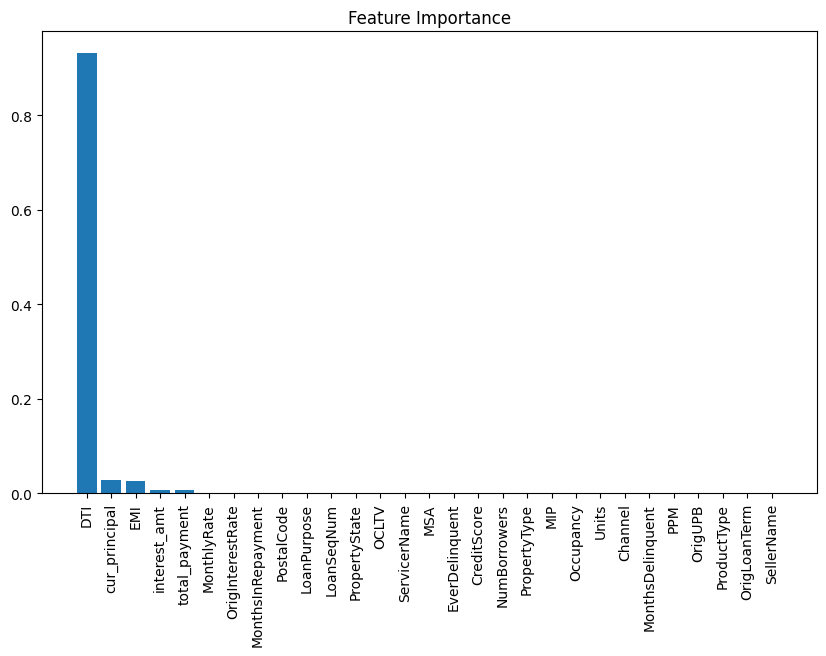

Random Forest R^2 Score: 0.9999981234973526


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor
import matplotlib.pyplot as plt

# Assuming df_filtered is already defined
X = df_filtered[['CreditScore', 'MSA', 'MIP', 'Units', 'Occupancy', 'OCLTV', 'DTI',
                 'OrigUPB', 'OrigInterestRate', 'Channel', 'PPM', 'ProductType',
                 'PropertyState', 'PropertyType', 'PostalCode', 'LoanSeqNum',
                 'LoanPurpose', 'OrigLoanTerm', 'NumBorrowers', 'SellerName',
                 'ServicerName', 'EverDelinquent', 'MonthsDelinquent',
                 'MonthsInRepayment', 'EMI', 'total_payment', 'interest_amt',
                 'MonthlyRate', 'cur_principal']]
y = df_filtered['prepayment']

# Feature Scaling
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Linear Regression Model
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Linear Regression R^2 Score: {r2}")

# Feature Importance with Decision Tree
tree_model = DecisionTreeRegressor(random_state=42)
tree_model.fit(X_train, y_train)

importances = tree_model.feature_importances_
indices = np.argsort(importances)[::-1]

# Plotting feature importance
plt.figure(figsize=(10, 6))
plt.title("Feature Importance")
plt.bar(range(X.shape[1]), importances[indices], align='center')
plt.xticks(range(X.shape[1]), X.columns[indices], rotation=90)
plt.show()

# Random Forest Model (Non-linear)
rf_model = RandomForestRegressor(random_state=42)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)

mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

print(f"Random Forest R^2 Score: {r2_rf}")


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Assuming df_filtered is already defined
X = df_filtered[['DTI', 'EMI', 'total_payment', 'interest_amt', 'cur_principal']]
y = df_filtered['prepayment']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"R^2 Score: {r2}")


R^2 Score: 0.19414014680529923


### Lasso Regression L1 Norm

Random Forest R^2 Score: 0.9999955193080536
Random Forest Mean Squared Error: 6928.940735896703
Cross-Validated R^2 Scores: [0.99999958 0.99996196 0.99999874 0.99999971 0.99996188]
Mean Cross-Validated R^2 Score: 0.9999843755452128


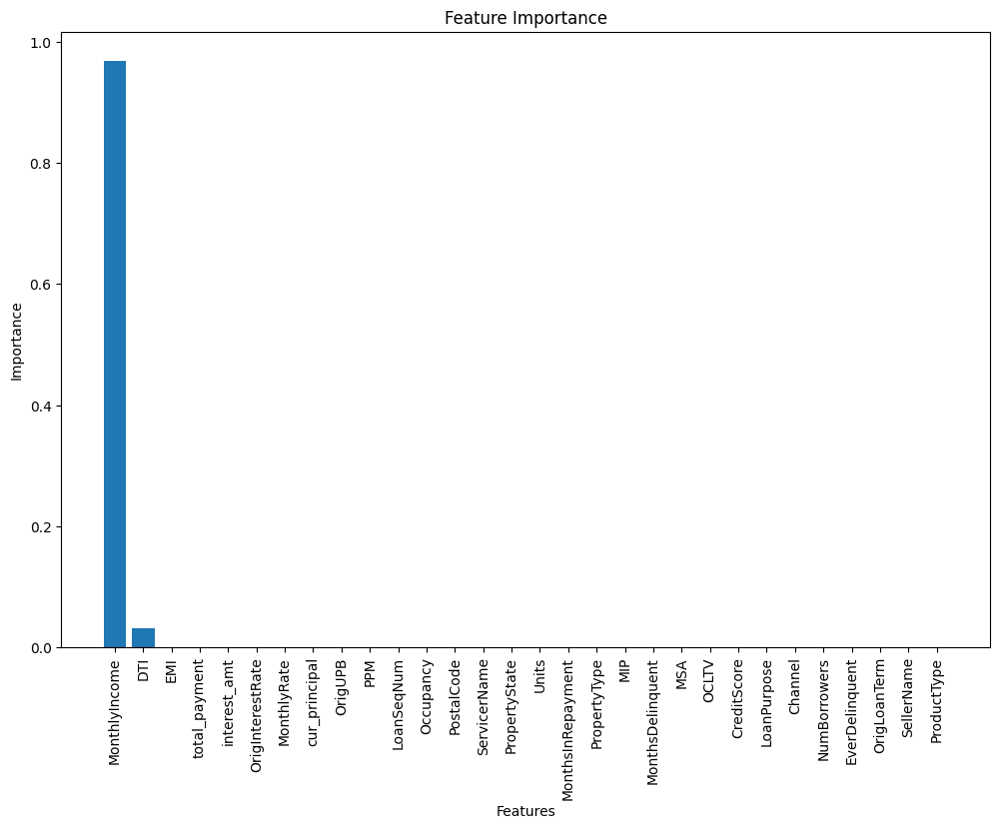

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import numpy as np
from sklearn.impute import SimpleImputer

# Assuming df_filtered is already defined and loaded
# Example DataFrame creation (comment this line if df_filtered is already loaded)
# df_filtered = pd.read_csv('path_to_your_file.csv')

# Handle missing values in 'MonthlyIncome' with median imputation
imputer = SimpleImputer(strategy='median')
df_filtered['MonthlyIncome'] = imputer.fit_transform(df_filtered[['MonthlyIncome']])

# Define features (X) and target (y)
X = df_filtered[['CreditScore', 'MSA', 'MIP', 'Units', 'Occupancy', 'OCLTV', 'DTI',
                 'OrigUPB', 'OrigInterestRate', 'Channel', 'PPM', 'ProductType',
                 'PropertyState', 'PropertyType', 'PostalCode', 'LoanSeqNum',
                 'LoanPurpose', 'OrigLoanTerm', 'NumBorrowers', 'SellerName',
                 'ServicerName', 'EverDelinquent', 'MonthsDelinquent',
                 'MonthsInRepayment', 'EMI', 'total_payment', 'interest_amt',
                 'MonthlyRate', 'MonthlyIncome', 'cur_principal']]
y = df_filtered['prepayment']

# Feature Scaling
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split Data into Training and Testing Sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Initialize and Train Random Forest Regressor
rf_model = RandomForestRegressor(random_state=42)
rf_model.fit(X_train, y_train)

# Make Predictions
y_pred_rf = rf_model.predict(X_test)

# Calculate Performance Metrics
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

print(f"Random Forest R^2 Score: {r2_rf}")
print(f"Random Forest Mean Squared Error: {mse_rf}")

# Cross-Validation
cv_scores = cross_val_score(rf_model, X_scaled, y, cv=5, scoring='r2')
print(f"Cross-Validated R^2 Scores: {cv_scores}")
print(f"Mean Cross-Validated R^2 Score: {cv_scores.mean()}")

# Feature Importance
importances = rf_model.feature_importances_
indices = np.argsort(importances)[::-1]

# Plot Feature Importance
plt.figure(figsize=(12, 8))
plt.title("Feature Importance")
plt.bar(range(X.shape[1]), importances[indices], align='center')
plt.xticks(range(X.shape[1]), X.columns[indices], rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.show()


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.impute import SimpleImputer

# Handle missing values in 'MonthlyIncome' with median imputation
imputer = SimpleImputer(strategy='median')
df_filtered['MonthlyIncome'] = imputer.fit_transform(df_filtered[['MonthlyIncome']])

# Define important features based on Lasso regression output
important_features_list = [
    'CreditScore', 'Units', 'DTI','OrigUPB', 'OrigInterestRate','MIP','MonthsDelinquent','OrigLoanTerm', 'MonthsInRepayment','EMI', 'interest_amt', 'MonthlyIncome', 'cur_principal'
]
# Define features (X) and target (y) using only important features
X = df_filtered[important_features_list]
y = df_filtered['prepayment']

# Feature Scaling
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split Data into Training and Testing Sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Initialize and Train Lasso Regressor
lasso_model = Lasso(alpha=0.1)  # You can tune alpha to optimize performance
lasso_model.fit(X_train, y_train)

# Make Predictions
y_pred_lasso = lasso_model.predict(X_test)

# Calculate Performance Metrics
mse_lasso = mean_squared_error(y_test, y_pred_lasso)
r2_lasso = r2_score(y_test, y_pred_lasso)

print(f"Lasso Regression R^2 Score: {r2_lasso}")
print(f"Lasso Regression Mean Squared Error: {mse_lasso}")

# Cross-Validation
cv_scores_lasso = cross_val_score(lasso_model, X_scaled, y, cv=5, scoring='r2')
print(f"Cross-Validated R^2 Scores (Lasso): {cv_scores_lasso}")
print(f"Mean Cross-Validated R^2 Score (Lasso): {cv_scores_lasso.mean()}")


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.630e+12, tolerance: 3.119e+10
  model = cd_fast.enet_coordinate_descent(


Lasso Regression R^2 Score: 0.9757630303051944
Lasso Regression Mean Squared Error: 37480042.95847854


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.532e+12, tolerance: 3.337e+10
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.582e+12, tolerance: 3.500e+10
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.545e+12, tolerance: 3.364e

Cross-Validated R^2 Scores (Lasso): [0.9655634  0.95507879 0.9661642  0.97819102 0.98200903]
Mean Cross-Validated R^2 Score (Lasso): 0.9694012892248246


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.732e+12, tolerance: 2.812e+10
  model = cd_fast.enet_coordinate_descent(


### Model pipeline

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, mean_squared_error, r2_score
import joblib

# Assuming df and df_filtered are already defined and loaded
# Example DataFrame creation (comment this line if df is already loaded)
# df = pd.read_csv('path_to_your_file.csv')
# df_filtered = pd.read_csv('path_to_your_filtered_file.csv')

# Prepare the data for classification
X_classification = df[['MonthsDelinquent', 'CreditScore', 'MaturityMonth', 'FirstPaymentMonth', 'OrigLoanTerm',
                       'OrigInterestRate', 'OrigUPB', 'Units', 'PropertyType', 'MaturityYear',
                       'FirstPaymentYear', 'DTI', 'MIP']]
y_classification = df['EverDelinquent']

# Prepare the data for regression
# Handle missing values in 'MonthlyIncome' with median imputation
imputer = SimpleImputer(strategy='median')
df_filtered['MonthlyIncome'] = imputer.fit_transform(df_filtered[['MonthlyIncome']])

# Define important features based on Lasso regression output
important_features_list = [
    'CreditScore', 'Units', 'DTI','OrigUPB', 'OrigInterestRate','MIP','MonthsDelinquent','OrigLoanTerm', 'MonthsInRepayment','EMI', 'interest_amt', 'MonthlyIncome', 'cur_principal'
]

# Define features (X) and target (y) using only important features
X_regression = df_filtered[important_features_list]
y_regression = df_filtered['prepayment']

# Split Data into Training and Testing Sets
X_train_class, X_test_class, y_train_class, y_test_class = train_test_split(X_classification, y_classification, test_size=0.2, random_state=42)
X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(X_regression, y_regression, test_size=0.2, random_state=42)

# Define and train RandomForestClassifier pipeline
pipeline_rf = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),  # Impute missing values
    ('scaler', StandardScaler()),  # Scale features
    ('clf', RandomForestClassifier(random_state=42))  # Classifier
])

# Fit the RandomForest pipeline
pipeline_rf.fit(X_train_class, y_train_class)

# Make predictions and evaluate RandomForest
y_pred_rf = pipeline_rf.predict(X_test_class)
print("Random Forest Classifier:")
print(f"Accuracy Score: {accuracy_score(y_test_class, y_pred_rf)}")
print("Classification Report:")
print(classification_report(y_test_class, y_pred_rf))
print("Confusion Matrix:")
print(confusion_matrix(y_test_class, y_pred_rf))

# Cross-Validation for RandomForest
cv_scores_rf = cross_val_score(pipeline_rf, X_classification, y_classification, cv=5, scoring='accuracy')
print(f"Cross-Validated Accuracy Scores (RandomForest): {cv_scores_rf}")
print(f"Mean Cross-Validated Accuracy Score (RandomForest): {cv_scores_rf.mean()}")

# Define and train Lasso Regression pipeline
pipeline_lasso = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),  # Impute missing values
    ('scaler', StandardScaler()),  # Scale features
    ('regressor', Lasso(alpha=0.1))  # Regressor
])

# Fit the Lasso pipeline
pipeline_lasso.fit(X_train_reg, y_train_reg)

# Make predictions and evaluate Lasso
y_pred_lasso = pipeline_lasso.predict(X_test_reg)
print("\nLasso Regression:")
print(f"R^2 Score: {r2_score(y_test_reg, y_pred_lasso)}")
print(f"Mean Squared Error: {mean_squared_error(y_test_reg, y_pred_lasso)}")

# Cross-Validation for Lasso
cv_scores_lasso = cross_val_score(pipeline_lasso, X_regression, y_regression, cv=5, scoring='r2')
print(f"Cross-Validated R^2 Scores (Lasso): {cv_scores_lasso}")
print(f"Mean Cross-Validated R^2 Score (Lasso): {cv_scores_lasso.mean()}")

# Save the pipelines
joblib.dump(pipeline_rf, 'random_forest_classifier_pipeline.joblib')
joblib.dump(pipeline_lasso, 'lasso_regression_pipeline.joblib')

print("\nPipelines saved successfully.")


Random Forest Classifier:
Accuracy Score: 0.9196102314250914
Classification Report:
              precision    recall  f1-score   support

           0       0.91      1.00      0.95     46767
           1       0.98      0.60      0.75     11524

    accuracy                           0.92     58291
   macro avg       0.95      0.80      0.85     58291
weighted avg       0.93      0.92      0.91     58291

Confusion Matrix:
[[46646   121]
 [ 4565  6959]]
Cross-Validated Accuracy Scores (RandomForest): [0.95079858 0.93630125 0.9211357  0.90327672 0.88344484]
Mean Cross-Validated Accuracy Score (RandomForest): 0.9189914194593257


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.632e+12, tolerance: 3.119e+10
  model = cd_fast.enet_coordinate_descent(



Lasso Regression:
R^2 Score: 0.9757630308643361
Mean Squared Error: 37480042.093821906


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.522e+12, tolerance: 3.337e+10
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.582e+12, tolerance: 3.500e+10
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.550e+12, tolerance: 3.364e

Cross-Validated R^2 Scores (Lasso): [0.9655634  0.95507879 0.9661642  0.97819102 0.98200903]
Mean Cross-Validated R^2 Score (Lasso): 0.969401287976788

Pipelines saved successfully.


In [ ]:
df.head()

,CreditScore,FirstTimeHomebuyer,MSA,MIP,Units,Occupancy,OCLTV,DTI,OrigUPB,LTV,...,NumBorrowers,SellerName,ServicerName,EverDelinquent,MonthsDelinquent,MonthsInRepayment,FirstPaymentYear,FirstPaymentMonth,MaturityYear,MaturityMonth
0,766,0,0.030094,25,1,0,93,27,187000,93,...,0,0,0.077632,0,1.0,98,1999,5,2029,4
1,766,0,0.018991,0,1,0,93,17,187000,93,...,1,0,0.018525,0,1.0,27,1999,5,2029,4
2,766,0,0.000261,0,1,0,93,16,187000,93,...,0,0,0.077632,0,1.0,98,1999,5,2029,4
3,766,0,0.032040,0,1,0,93,14,187000,93,...,0,0,0.039664,0,1.0,98,1999,5,2029,4
4,766,0,0.014253,0,1,0,93,18,187000,93,...,0,0,0.039664,0,1.0,98,1999,5,2029,4
